En el entorno educativo actual, el uso de redes sociales ha dejado de ser una actividad periférica para convertirse en un factor determinante del bienestar estudiantil. Esta investigación surge de la necesidad de cuantificar y predecir cómo variables como el tiempo de exposición y los conflictos digitales impactan tanto en la salud mental como en el desempeño académico.

In [ ]:
!pip install -U kaleido

In [1]:
# Librerias utilizadas

In [520]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression,LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram,linkage
import plotly.graph_objects as go
import plotly.express as px

#### EDA

In [3]:
# En lugar de la ruta de tu PC, usa esto:
df = pd.read_csv("Students Social Media Addiction.csv")

In [4]:
df.head(30)

,Student_ID,Age,Gender,Academic_Level,Country,Avg_Daily_Usage_Hours,Most_Used_Platform,Affects_Academic_Performance,Sleep_Hours_Per_Night,Mental_Health_Score,Relationship_Status,Conflicts_Over_Social_Media,Addicted_Score
0,1,19,Female,Undergraduate,Bangladesh,5.2,Instagram,Yes,6.5,6,In Relationship,3,8
1,2,22,Male,Graduate,India,2.1,Twitter,No,7.5,8,Single,0,3
2,3,20,Female,Undergraduate,USA,6.0,TikTok,Yes,5.0,5,Complicated,4,9
3,4,18,Male,High School,UK,3.0,YouTube,No,7.0,7,Single,1,4
4,5,21,Male,Graduate,Canada,4.5,Facebook,Yes,6.0,6,In Relationship,2,7
5,6,19,Female,Undergraduate,Australia,7.2,Instagram,Yes,4.5,4,Complicated,5,9
6,7,23,Male,Graduate,Germany,1.5,LinkedIn,No,8.0,9,Single,0,2
7,8,20,Female,Undergraduate,Brazil,5.8,Snapchat,Yes,6.0,6,In Relationship,2,8
8,9,18,Male,High School,Japan,4.0,TikTok,No,6.5,7,Single,1,5
9,10,21,Female,Graduate,South Korea,3.3,Instagram,No,7.0,7,In Relationship,1,4


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 705 entries, 0 to 704
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Student_ID                    705 non-null    int64  
 1   Age                           705 non-null    int64  
 2   Gender                        705 non-null    object 
 3   Academic_Level                705 non-null    object 
 4   Country                       705 non-null    object 
 5   Avg_Daily_Usage_Hours         705 non-null    float64
 6   Most_Used_Platform            705 non-null    object 
 7   Affects_Academic_Performance  705 non-null    object 
 8   Sleep_Hours_Per_Night         705 non-null    float64
 9   Mental_Health_Score           705 non-null    int64  
 10  Relationship_Status           705 non-null    object 
 11  Conflicts_Over_Social_Media   705 non-null    int64  
 12  Addicted_Score                705 non-null    int64  
dtypes: fl

In [6]:
df.isnull().sum()

Student_ID                      0
Age                             0
Gender                          0
Academic_Level                  0
Country                         0
Avg_Daily_Usage_Hours           0
Most_Used_Platform              0
Affects_Academic_Performance    0
Sleep_Hours_Per_Night           0
Mental_Health_Score             0
Relationship_Status             0
Conflicts_Over_Social_Media     0
Addicted_Score                  0
dtype: int64

In [7]:
df.describe()

,Student_ID,Age,Avg_Daily_Usage_Hours,Sleep_Hours_Per_Night,Mental_Health_Score,Conflicts_Over_Social_Media,Addicted_Score
count,705.000000,705.000000,705.000000,705.000000,705.000000,705.000000,705.000000
mean,353.000000,20.659574,4.918723,6.868936,6.226950,2.849645,6.436879
std,203.660256,1.399217,1.257395,1.126848,1.105055,0.957968,1.587165
min,1.000000,18.000000,1.500000,3.800000,4.000000,0.000000,2.000000
25%,177.000000,19.000000,4.100000,6.000000,5.000000,2.000000,5.000000
50%,353.000000,21.000000,4.800000,6.900000,6.000000,3.000000,7.000000
75%,529.000000,22.000000,5.800000,7.700000,7.000000,4.000000,8.000000
max,705.000000,24.000000,8.500000,9.600000,9.000000,5.000000,9.000000


In [8]:
# Puntaje de adiccion por estudiante
adiccion_puntaje = df.groupby("Addicted_Score")["Addicted_Score"].count()
adiccion_puntaje

Addicted_Score
2      1
3     16
4     83
5    136
6     61
7    209
8    144
9     55
Name: Addicted_Score, dtype: int64

In [9]:
# Adiccion por genero mayor a 7
adiccion_alta = df[df["Addicted_Score"] > 7]
conteo = adiccion_alta.groupby("Gender")["Student_ID"].count()
conteo_ordenado = conteo.sort_values(ascending=False)
conteo_ordenado

Gender
Female    118
Male       81
Name: Student_ID, dtype: int64

In [10]:
# Cantidad de estudiantes que tienen problemas con las redes sociales mayor igual a 5
conflicto_redes_sociales = df[df["Conflicts_Over_Social_Media"] >= 5]
conflicto_por_genero = conflicto_redes_sociales.groupby("Gender")["Student_ID"].count()
conteo_conflicto = conflicto_por_genero.sort_values()
conteo_conflicto

Gender
Male      7
Female    8
Name: Student_ID, dtype: int64

In [11]:
# Cantidad de estudiantes por genero
estudiantes_por_genero = df.groupby("Gender")["Student_ID"].count()
estudiantes_por_genero

Gender
Female    353
Male      352
Name: Student_ID, dtype: int64

In [12]:
# Agrupar estudiantes por nivel academico
agrupar_estudiantes = df.groupby('Academic_Level')

In [13]:
for genero, pais in agrupar_estudiantes:
    print(genero,pais)

Graduate      Student_ID  Age  Gender Academic_Level      Country  \
1             2   22    Male       Graduate        India   
4             5   21    Male       Graduate       Canada   
6             7   23    Male       Graduate      Germany   
9            10   21  Female       Graduate  South Korea   
12           13   22    Male       Graduate        Italy   
..          ...  ...     ...            ...          ...   
695         696   23    Male       Graduate          USA   
697         698   24    Male       Graduate       France   
699         700   22    Male       Graduate           UK   
701         702   23    Male       Graduate       Russia   
703         704   24    Male       Graduate        Japan   

     Avg_Daily_Usage_Hours Most_Used_Platform Affects_Academic_Performance  \
1                      2.1            Twitter                           No   
4                      4.5           Facebook                          Yes   
6                      1.5          

In [14]:
# Redes Sociales mas usadas por los estudiantes
redes_mas_usada = df.groupby("Most_Used_Platform")["Most_Used_Platform"].value_counts()
redes_mas_usada.sort_values(ascending=False)


Most_Used_Platform
Instagram    249
TikTok       154
Facebook     123
WhatsApp      54
Twitter       30
LinkedIn      21
WeChat        15
Snapchat      13
KakaoTalk     12
LINE          12
VKontakte     12
YouTube       10
Name: count, dtype: int64

In [15]:
redes_sociales = df['Most_Used_Platform'].value_counts().sort_values(ascending=False)

In [16]:
for plataforma, cantidad in redes_sociales.items():
    if cantidad > 245:
        print(f'{plataforma} es tendencia entre los estudiantes con total de: {cantidad} de usuarios')
    elif cantidad > 153:
        print(f'{plataforma} es mayoritaria entre los estudiantes con total de: {cantidad} de usuarios')
    elif cantidad > 122:
        print(f'{plataforma} es minorista entre los estudiantes con total de: {cantidad} de usuarios')

Instagram es tendencia entre los estudiantes con total de: 249 de usuarios
TikTok es mayoritaria entre los estudiantes con total de: 154 de usuarios
Facebook es minorista entre los estudiantes con total de: 123 de usuarios


In [17]:
# Estudiantes por edad
estudiante_por_edad= df.groupby("Age")["Age"].count()
estudiante_por_edad

Age
18     14
19    163
20    165
21    156
22    147
23     34
24     26
Name: Age, dtype: int64

In [18]:
# Estudiantes por edad y genero
edad_por_genero = df.groupby("Gender")["Age"].value_counts()
edad_por_genero

Gender  Age
Female  20     146
        19     135
        21      31
        23      15
        22      13
        24       8
        18       5
Male    22     134
        21     125
        19      28
        20      19
        23      19
        24      18
        18       9
Name: count, dtype: int64

In [19]:
# Puntuacion promedio de salud mental de los hombres
puntuacion_salud_mental_hombre = df[df['Gender'] == "Male"]["Mental_Health_Score"].mean()
puntuacion_salud_mental_hombre

np.float64(6.278409090909091)

In [20]:
# Puntuacion promedio de salud mental de las mujeres
puntuacion_salud_mental_mujer = df[df['Gender'] == "Female"]["Mental_Health_Score"].mean()
puntuacion_salud_mental_mujer

np.float64(6.175637393767706)

In [21]:
np.round(puntuacion_salud_mental_hombre,decimals=1)

np.float64(6.3)

In [22]:
np.round(puntuacion_salud_mental_mujer,decimals=1)

np.float64(6.2)

In [23]:
# Cantidad por genero en horas en la redes sociales
red_social = df[df["Avg_Daily_Usage_Hours"] < 4]
red_genero_horas = red_social.groupby("Gender")["Student_ID"].count()
conteo_red_genero_horas = red_genero_horas.sort_values()
conteo_red_genero_horas

Gender
Female    76
Male      78
Name: Student_ID, dtype: int64

In [24]:
# Cantidad de nacionalidad USA por genero
pais_genero_USA = df[df['Country'] == "USA"]["Gender"].value_counts()
pais_genero_USA

Gender
Female    36
Male       4
Name: count, dtype: int64

In [25]:
# # Cantidad de nacionalidad Bangladesh por genero
pais_genero_Bangladesh = df[df['Country'] == "Bangladesh"]["Gender"].value_counts()
pais_genero_Bangladesh

Gender
Female    11
Male       9
Name: count, dtype: int64

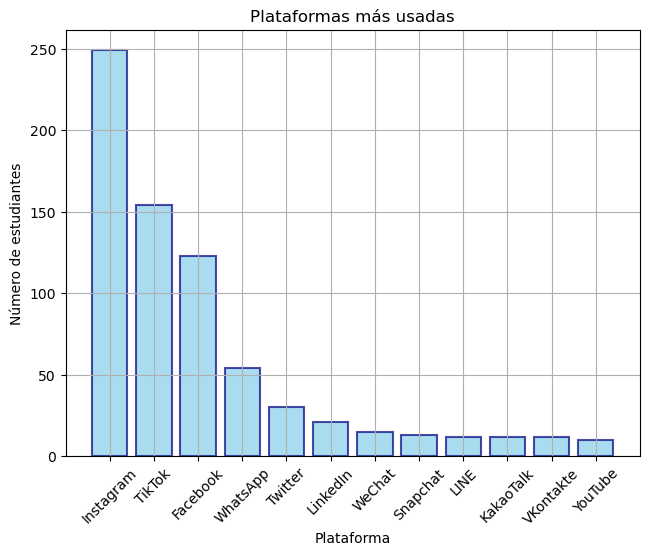

In [26]:
frecuencia_de_plataformas = df['Most_Used_Platform'].value_counts()
plt.bar(frecuencia_de_plataformas.index,frecuencia_de_plataformas.values,edgecolor="navy",color="skyblue",linewidth=1.5,alpha=0.7)
plt.tight_layout()
plt.xticks(rotation=45)
plt.title("Plataformas más usadas")
plt.xlabel("Plataforma")
plt.ylabel("Número de estudiantes");
plt.grid(True)

El gráfico muestra que Instagram es la plataforma de redes sociales más popular entre los estudiantes, con un número de usuarios significativamente alto. **Le siguen de cerca TikTok y Facebook**, que tienen una popularidad similar y se posicionan como las siguientes opciones preferidas. Por otro lado, **el uso de Snapchat y Twitter es considerablemente menor en comparación con las tres primeras**.

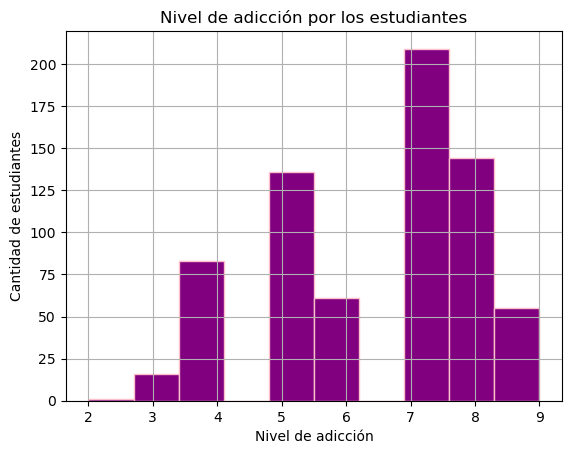

In [27]:
plt.hist(df["Addicted_Score"],edgecolor="pink",color="purple");
plt.title("Nivel de adicción por los estudiantes")
plt.xlabel("Nivel de adicción")
plt.ylabel("Cantidad de estudiantes");
plt.grid(True)

El gráfico revela que la mayoría de los estudiantes tiene una puntuación de adicción baja, lo cual se evidencia por las barras más altas que se encuentran en los rangos iniciales. **Esto sugiere que la adicción severa a las redes sociales no es un problema generalizado en la población estudiada**.

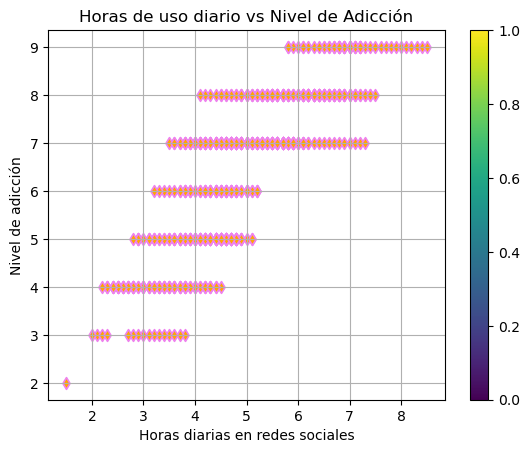

In [28]:
uso_red_social = df['Avg_Daily_Usage_Hours']
puntaje_adiccion = df['Addicted_Score']

plt.scatter(uso_red_social,puntaje_adiccion,edgecolor="violet",color="orange",marker="d",linewidths=1.2,);
plt.title("Horas de uso diario vs Nivel de Adicción")
plt.xlabel("Horas diarias en redes sociales")
plt.ylabel("Nivel de adicción")
plt.grid(True)
plt.colorbar();

La principal observación que se puede hacer de este gráfico es que **hay una clara correlación positiva entre las dos variables**. Esto significa que a medida que aumentan las horas de uso diario de redes sociales, **también aumenta la puntuación de adicción de los estudiantes**

🔺 Cuando X sube (más horas), Y también sube (más adicción).

🔻 Cuando X baja (menos horas), Y también baja (menos adicción).

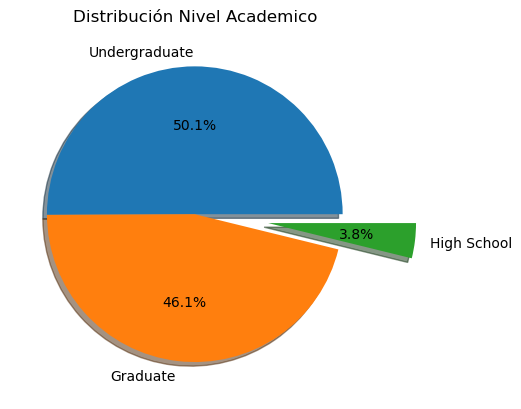

In [29]:
nivel_academico = df["Academic_Level"].value_counts()
nivel_academico
plt.pie(nivel_academico,labels=nivel_academico.index,
       autopct='%1.1f%%',shadow=True,
       explode=(0,0,0.5));

plt.title("Distribución Nivel Academico");

La observación principal es que **la gran mayoría de los estudiantes en este conjunto de datos son de nivel universitario**, **seguidos por los de posgrado**, mientras que los de secundaria representan una **pequeña minoría**

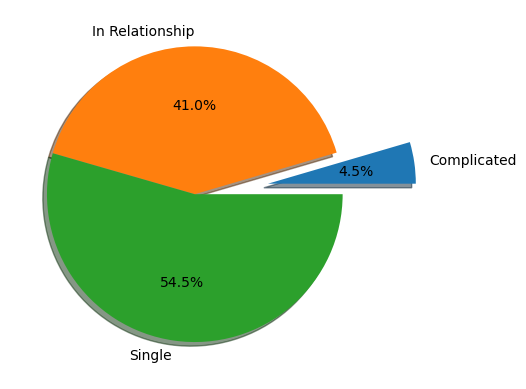

In [30]:
tipo_relacion = df.groupby("Relationship_Status")["Relationship_Status"].value_counts()
tipo_relacion
plt.pie(tipo_relacion,labels=tipo_relacion.index,
       autopct='%1.1f%%',shadow=True,
       explode=(0.5,0,0));


La mayoría de los estudiantes, **representados por el segmento más grande, están "En una relación" o "In a relationship".**

El segundo grupo más grande, que ocupa una porción **significativa del pastel, está "Soltero" o "Single".**

El grupo más pequeño está en la categoría de **"En un noviazgo casual" o "Casual relationship"**

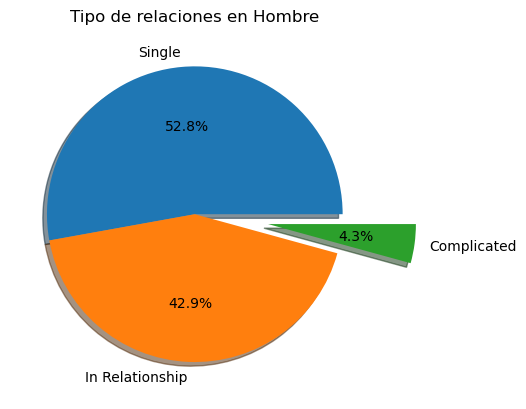

In [31]:
relacion_hombre = df[df['Gender'] == "Male"]["Relationship_Status"].value_counts()
plt.pie(relacion_hombre,autopct='%1.1f%%',labels=relacion_hombre.index,
       shadow=True,explode=(0,0,0.5));

plt.title("Tipo de relaciones en Hombre");

El gráfico de pastel muestra la distribución del estado de relación de las estudiantes hombres.

El segmento más grande, de color azul, **indica que la mayoría de los hombres encuestados están solteros ("Single")**, con más de la mitad de la muestra.

El segundo segmento más grande, de color naranja, **corresponde a los que están "In Relationship" o "En una relación"**.

El segmento más pequeño, de color verde, **representa a los que están en una "Relación complicada" o "Complicated".**

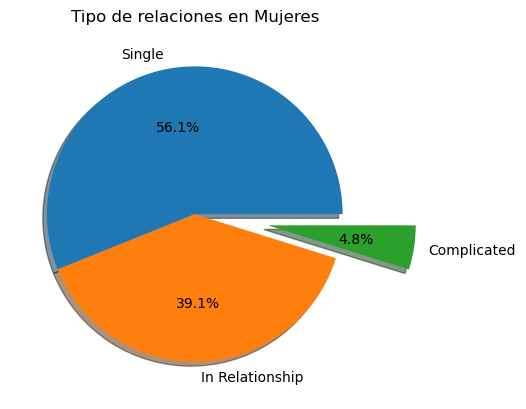

In [32]:
relacion_mujeres = df[df["Gender"] == "Female"]["Relationship_Status"].value_counts()
plt.pie(relacion_mujeres,autopct='%1.1f%%',labels=relacion_mujeres.index,
       shadow=True,explode=(0,0,0.5));

plt.title("Tipo de relaciones en Mujeres");

El gráfico de pastel muestra la distribución del estado de relación de las estudiantes mujeres.

El segmento más grande, de color azul, **indica que la mayoría de las mujeres encuestadas están solteras ("Single")**, con un 56.1%.

El segundo segmento más grande, de color naranja, **corresponde a las que están "In Relationship" o "En una relación"**, con un 39.1%.

El segmento más pequeño, de color verde, **representa a las que están en una "Relación complicada"**, con solo un 4.8%

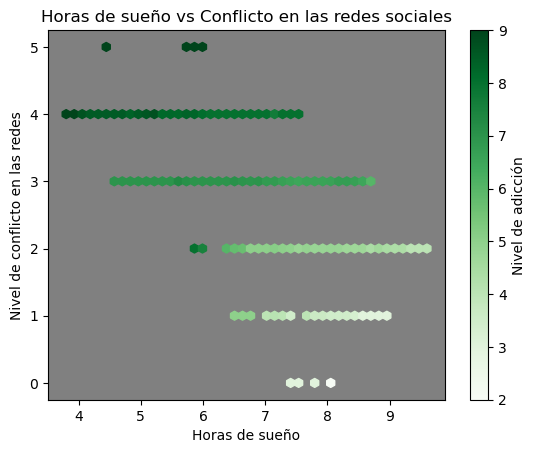

In [33]:
fig, ax = plt.subplots()

hb = ax.hexbin(df["Sleep_Hours_Per_Night"], df["Conflicts_Over_Social_Media"],C=df['Addicted_Score'], gridsize=45,cmap='Greens');
ax.set_facecolor('grey')
plt.colorbar(hb,label="Nivel de adicción");
plt.xlabel("Horas de sueño")
plt.ylabel("Nivel de conflicto en las redes")
plt.title("Horas de sueño vs Conflicto en las redes sociales");

Al observar ese punto en el gráfico, que se encuentra a la izquierda y arriba, podemos deducir que:

Hay un pequeño grupo de estudiantes que duerme pocas horas **(entre 4 y 4.5 horas)**.

Estos estudiantes tienen un alto nivel de conflicto **(nivel 4 o 5)**.

El color oscuro del hexágono indica que, a pesar de dormir pocas horas, este grupo tiene un alto nivel de adicción **(cercano a 8 o 9)**.

Esto sugiere que, para una **minoría de estudiantes, la falta de sueño podría estar directamente relacionada con su nivel de adicción y los conflictos que genera**, o bien, que la adicción es tan severa que afecta su capacidad para dormir

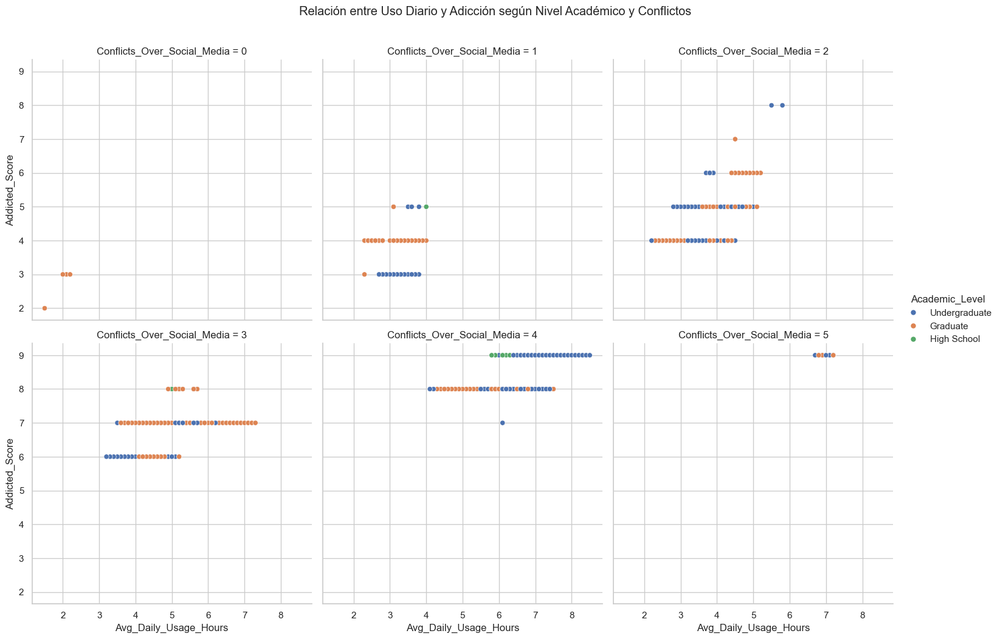

In [34]:
sns.set_theme(style="whitegrid")

sns.relplot(
    data=df,
    x="Avg_Daily_Usage_Hours",
    y="Addicted_Score",
    hue="Academic_Level",
    col="Conflicts_Over_Social_Media",
    col_wrap=3,                 
    height=5,
    aspect=1
)
plt.suptitle("Relación entre Uso Diario y Adicción según Nivel Académico y Conflictos", y=1.05);


A medida que el nivel de conflicto aumenta **(de 0 a 5)**, la relación entre las horas de uso y el puntaje de adicción parece volverse más fuerte y los puntos tienden a subir.

La variable Academic_Level (hue) te muestra la composición de cada grupo. Por ejemplo, la mayoría de los estudiantes con conflicto alto son de nivel **Undergraduate**

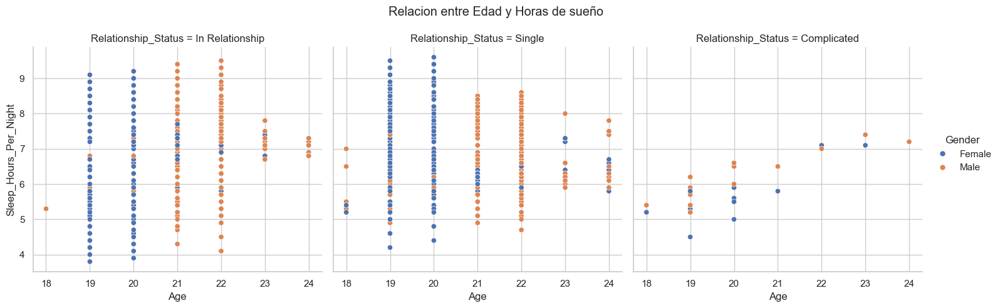

In [35]:
sns.relplot(data=df,
           x="Age",
           y="Sleep_Hours_Per_Night",
           hue="Gender",
           col="Relationship_Status");

plt.suptitle("Relacion entre Edad y Horas de sueño");
plt.subplots_adjust(top=0.85)

**Grupo En una relación:** En este grupo se puede ver que hay una gran concentración de estudiantes de entre 19 y 20 años que duermen entre 6 y 8 horas.

**Grupo Soltero**: Aquí la distribución es más amplia, con una mayor cantidad de estudiantes de 20 a 22 años y una dispersión más grande en las horas de sueño. Esto podría sugerir que la categoría de "solteros" es más heterogénea.

**Grupo Relación complicada**: Este es el grupo con menos puntos, lo que es coherente con tu análisis anterior del gráfico de pastel. Se puede ver que la mayoría de estos estudiantes son mujeres, tienen una edad de alrededor de 20 a 22 años, y duermen entre 6 y 7 horas.

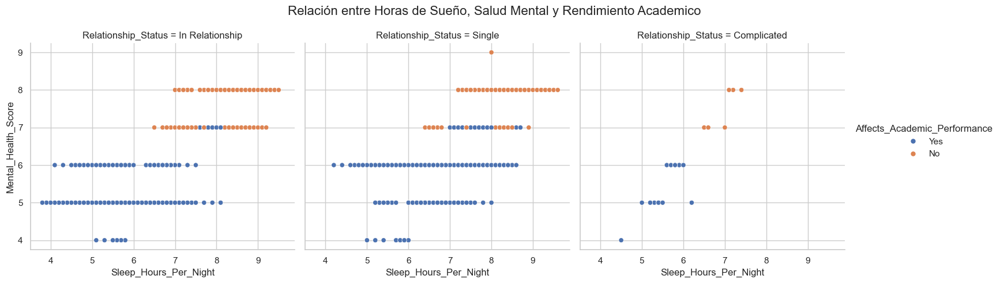

In [36]:
sns.relplot(data=df,
            x="Sleep_Hours_Per_Night",
            y="Mental_Health_Score",
            hue="Affects_Academic_Performance",
            col="Relationship_Status",);

plt.suptitle("Relación entre Horas de Sueño, Salud Mental y Rendimiento Academico", fontsize=16);
plt.subplots_adjust(top=0.85)

**Personas En relación**: En este grupo, la mayoría de los estudiantes con un alto puntaje de salud mental (7 a 8) duermen más de 7 horas y no se ven afectados en su rendimiento académico. Sin embargo, hay un grupo con puntajes de salud mental más bajos (5 a 6) que duermen menos horas y que indican que el uso de redes sociales sí afecta su rendimiento académico.

**Personas Solteras**: Este grupo es similar al de "En relación", con una alta concentración de estudiantes con buen puntaje de salud mental y que no se ven afectados en su rendimiento. Sin embargo, hay un número significativo de personas solteras con un puntaje bajo de salud mental que indican que sí se ven afectadas.

**Personas en una Relación complicada**: Este grupo, aunque pequeño, muestra una clara diferencia. Hay estudiantes con bajos puntajes de salud mental (5 a 6) que indican que se ven afectados académicamente y que duermen pocas horas.

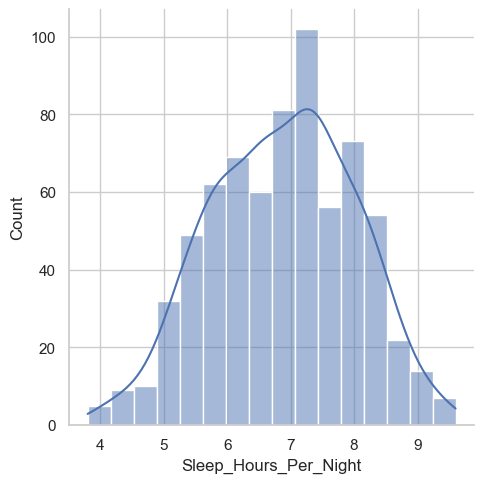

In [37]:
sns.displot(data=df,
           x="Sleep_Hours_Per_Night",
           kde=True);

Forma de la distribución: El gráfico tiene una forma de campana, lo que significa que la mayoría de los estudiantes duermen alrededor de 7 horas. La distribución es casi simétrica, aunque con una ligera inclinación hacia la derecha, lo que indica que hay más estudiantes que duermen 8 o más horas que aquellos que duermen menos de 6.

**Distribución de los datos**: Hay una alta concentración de estudiantes que duermen entre 6.5 y 7.5 horas. La mayoría de los datos se encuentran en este rango

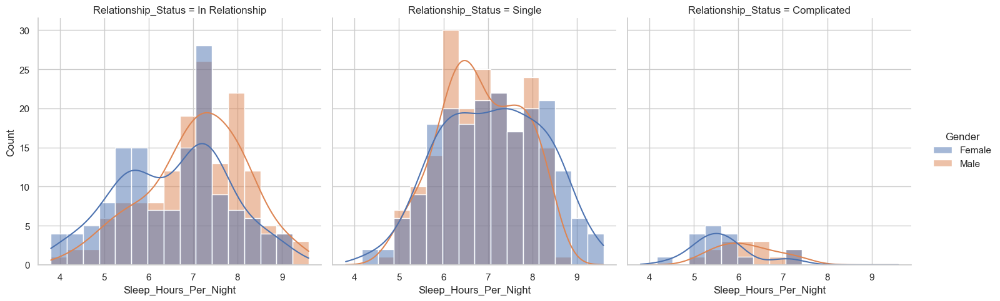

In [38]:
sns.displot(data=df,
           x="Sleep_Hours_Per_Night",
           kde=True,
           col="Relationship_Status",
           hue="Gender");



**En una relación**: Las curvas de distribución de hombres y mujeres son bastante similares, lo que indica que ambos géneros en este grupo tienen un patrón de sueño parecido. La mayoría de los estudiantes, independientemente del género, duerme entre 6 y 7 horas.

**Soltero**: Aquí hay una diferencia notable. La distribución de los hombres (naranja) tiene un pico más claro alrededor de las 8 horas, mientras que la de las mujeres (azul) es más amplia y se concentra alrededor de las 6 a 7 horas, con una curva más plana. Esto sugiere una mayor variedad en el patrón de sueño de las mujeres solteras.

**Relación complicada**: En este grupo, aunque la muestra es pequeña, se puede ver que la distribución de las horas de sueño es muy similar entre hombres y mujeres.

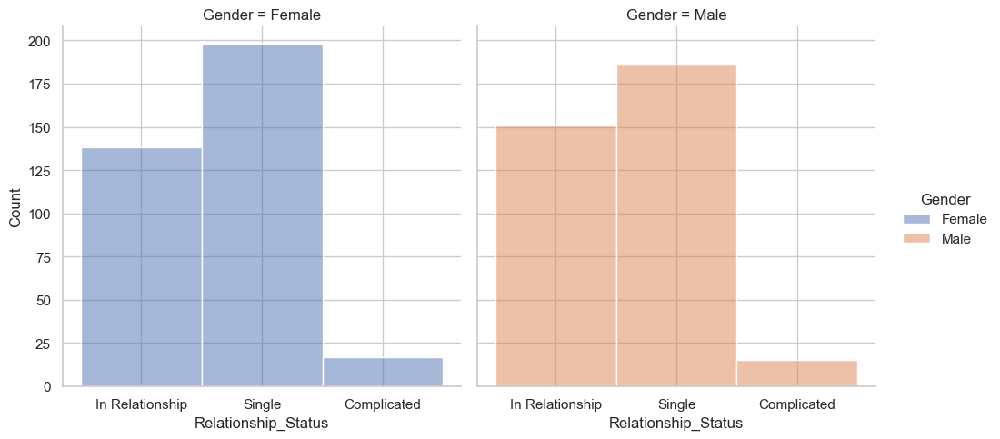

In [39]:
sns.displot(data=df,
           x="Relationship_Status",
           col="Gender",
           hue="Gender",
           aspect=1);

**Hombres (Male)**: Hay más hombres solteros que hombres en una relación. El conteo de solteros es casi el doble que el de los hombres en una relación.

**Mujeres (Female)**: De manera similar, hay más mujeres solteras que mujeres en una relación. La diferencia es menos marcada que en los hombres, pero el patrón es el mismo.

**General**: Se puede ver que hay una gran mayoría de estudiantes solteros, tanto hombres como mujeres.

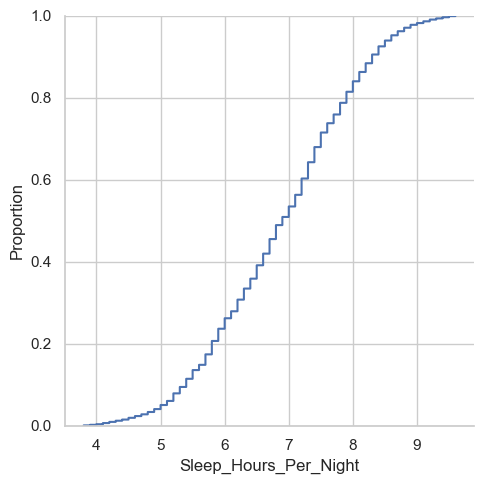

In [40]:
sns.displot(data=df,
           x="Sleep_Hours_Per_Night",
           kind="ecdf");

Concentración Mayoritaria: La gran mayoría de los estudiantes duerme dentro del rango que se considera saludable.

**Alrededor del 60%** de los estudiantes duerme 7 horas o menos por noche.

**Alrededor del 90%** de los estudiantes duerme 8 horas o menos por noche.

Esto significa que el grueso de la muestra se concentra en el rango de 7 a 8 horas.

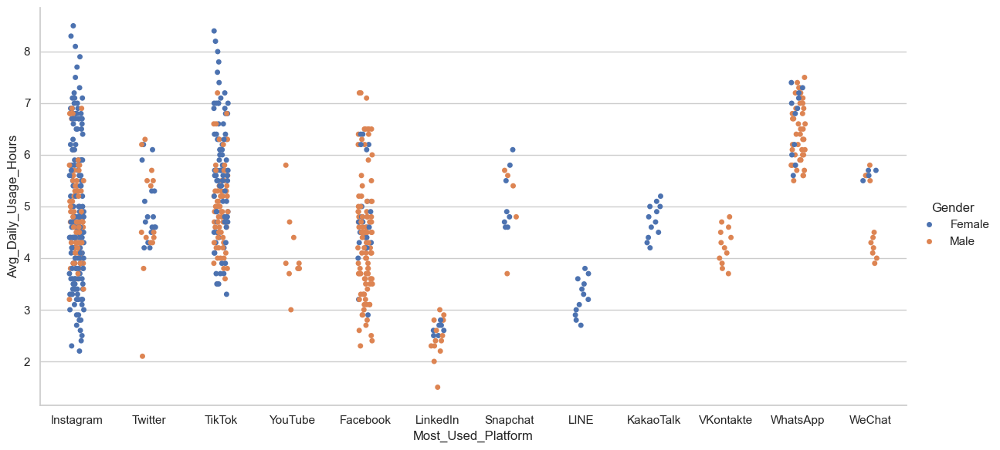

In [41]:
sns.catplot(data=df,
           kind="strip", 
           x="Most_Used_Platform",
           y="Avg_Daily_Usage_Hours",
           hue="Gender",
           height=6,
           aspect=2);

Si en **Instagram** hay muchos puntos (usuarios) altos en el eje Y (por ejemplo, de 6 a 8 horas), eso sugiere que los usuarios de Instagram tienden a pasar muchas horas al día.

Si en **Facebook** los puntos están más bajos (2 a 4 horas), se interpreta que los usuarios de Facebook tienen un menor uso diario promedio.

El color muestra la diferencia entre géneros: por ejemplo, si los puntos azules (mujeres) están más arriba que los naranjos (hombres) en TikTok, podrías decir que las mujeres usan más TikTok que los hombres, en promedio.

Si los puntos están muy juntos o solapados en una categoría, significa que hay muchas personas con valores similares (y en un swarmplot los verás mejor distribuidos).

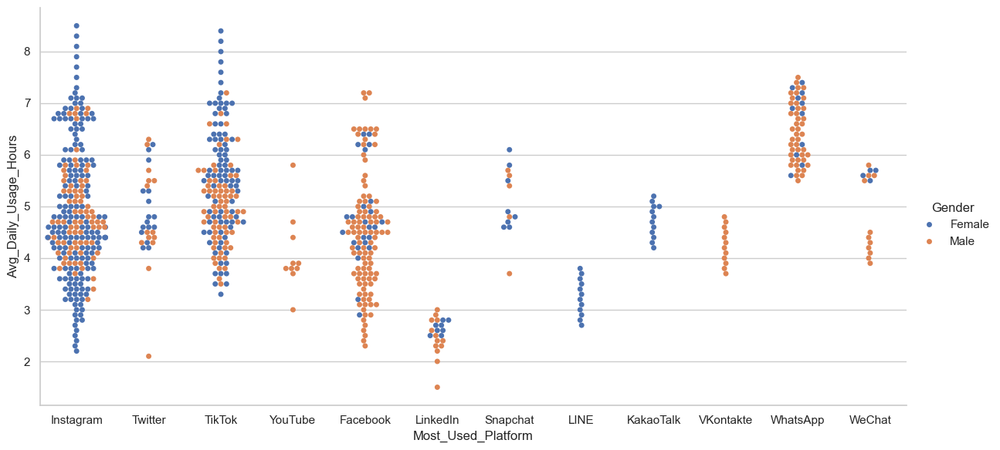

In [42]:
sns.catplot(data=df,
           kind="swarm", 
           x="Most_Used_Platform",
           y="Avg_Daily_Usage_Hours",
           hue="Gender",
           height=6,
           aspect=2);

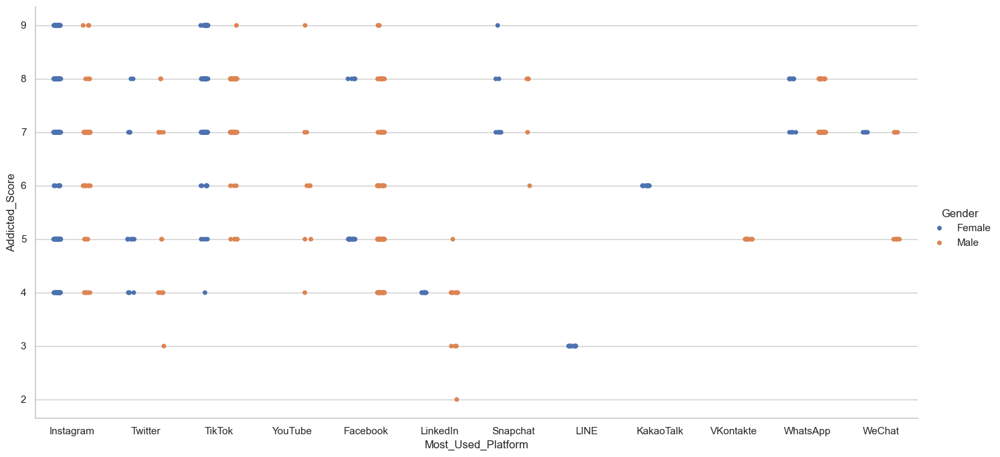

In [43]:
sns.catplot(data=df,
           kind="strip",
           x="Most_Used_Platform",
           y="Addicted_Score",
           hue="Gender",
           jitter=True,
           height=7,
           aspect=2,
           dodge=True);

1.  **Plataformas de Mayor Adicción:** Instagram, TikTok, YouTube, Twitter y Facebook concentran a los usuarios con las puntuaciones de adicción más altas (7 a 9), siendo las únicas donde se reporta el máximo de 9.
2.  **Plataformas de Menor Adicción:** El uso de LinkedIn, Snapchat, LINE y KakaoTalk rara vez se asocia con puntuaciones de adicción superiores a 4, confirmando un uso más limitado y funcional.
3.  **Diferencia de Género en YouTube:** Existe una observación clave: las puntuaciones de adicción más altas en YouTube son predominantemente reportadas por **hombres**, lo que sugiere una diferencia de género en el tipo de contenido adictivo.

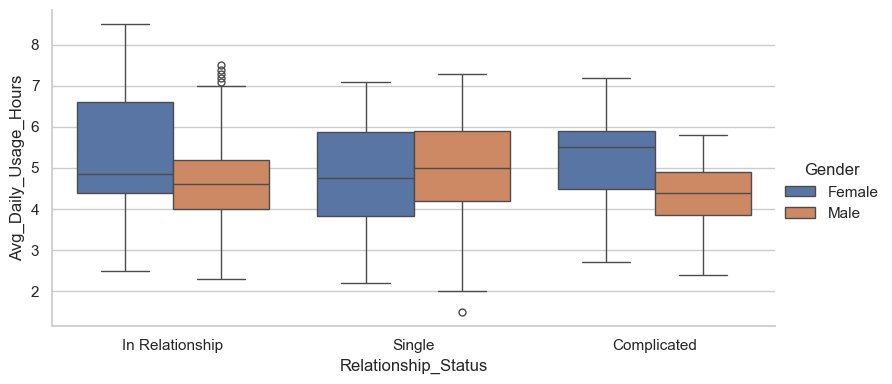

In [44]:
sns.catplot(data=df,
           kind="box",
           x="Relationship_Status",
           y="Avg_Daily_Usage_Hours",
           hue="Gender",
           height=4,
           aspect=2);

Al examinar las cajas de la categoría "In Relationship", se confirma una diferencia en el uso promedio de redes sociales:

**La mediana (línea central de la caja) del grupo de Mujeres se encuentra aproximadamente en 5.0 horas de uso diario.**

**La mediana del grupo de Hombres se encuentra ligeramente por debajo, alrededor de 4.7-4.8 horas de uso diario.**

**La mediana (uso promedio) del grupo de Hombres Solteros se sitúa en ≈5.1 horas.**

**La mediana del grupo de Mujeres Solteras se sitúa ligeramente por debajo, en ≈4.7 horas.**

**Mujeres "Complicated": Uso promedio (mediana) de ≈5.5 horas.**

**Hombres "Complicated": Uso promedio (mediana) de ≈4.5 horas.**

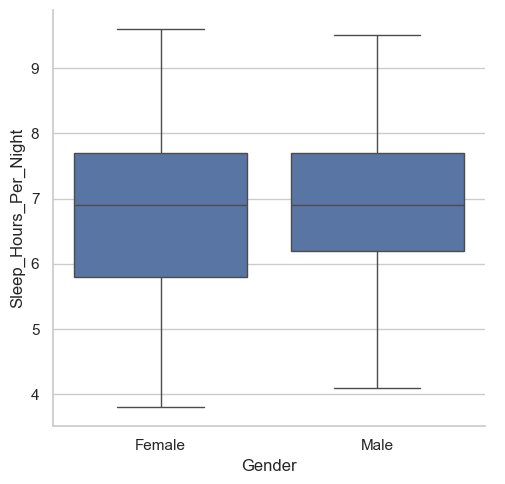

In [45]:
sns.catplot(data=df,
           kind="box",
           x="Gender",
           y="Sleep_Hours_Per_Night");

**Las mujeres parten desde ≈3.8 hasta ≈5.8 horas.**

La línea inferior del bigote está justo por debajo de 4.0 (cerca de 3.8), y el fondo de la caja (Q1) está en ≈5.8.

Conclusión: El 25% de las mujeres que menos duerme lo hace en el rango de 3.8 a 5.8 horas.

**Los hombres duermen desde ≈4.2 hasta ≈6.3 horas.**

El fondo del bigote inferior parece estar en ≈4.0 horas.

El fondo de la caja (Q1) está en ≈5.8 horas (similar al de las mujeres).

Conclusión: El 25% de los hombres que menos duerme lo hace en el rango de 4.0 a 5.8 horas.

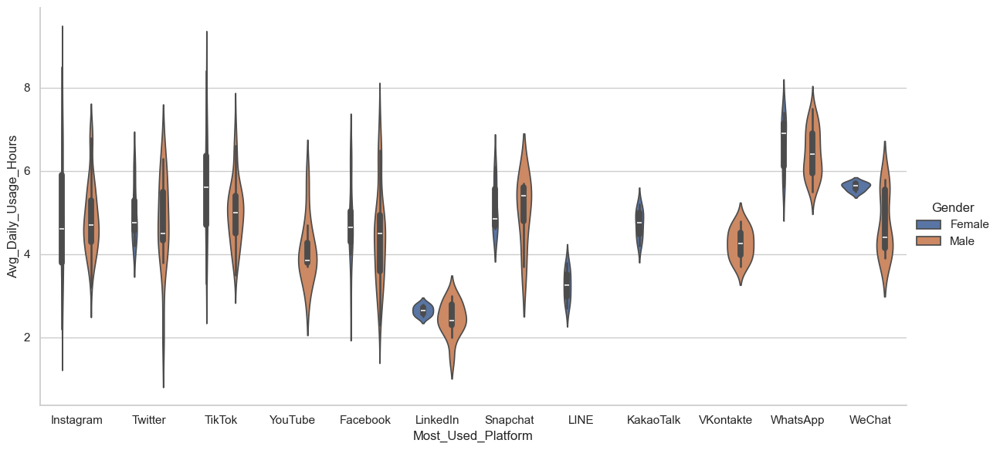

In [46]:
sns.catplot(data=df,
           kind="violin",
           x="Most_Used_Platform",
           y="Avg_Daily_Usage_Hours",
           hue="Gender",
           height=6,
           aspect=2);

**Diferencia de Densidad por Plataforma**:

Instagram y TikTok: Las formas de violín son anchas y largas. Hay una gran variedad de uso, pero la mayor densidad se encuentra alrededor de 4.5 a 5.5 horas.

LinkedIn y WeChat: Los "violines" son muy delgados y cortos, con una concentración masiva de uso en la parte baja (≈2.5 a 3.5 horas). Esto confirma que su uso es bajo y muy consistente.

**Diferencias de Género (División de la Forma)**:

Instagram: Las formas azul (Mujer) y naranja (Hombre) son muy similares en su densidad, pero el violín azul se extiende un poco más alto, lo que sugiere que las mujeres tienen el mayor uso extremo.

WhatsApp: Hay una clara bimodalidad (dos picos) en el uso, especialmente en las mujeres, lo que sugiere que hay dos grupos distintos de usuarias: las de uso moderado y las de uso alto.

YouTube y Facebook: El violín naranja (Hombre) se ve un poco más ancho en el rango medio a alto, lo que sugiere una mayor densidad de hombres en ese uso que en otras plataformas, respaldando tu análisis anterior.

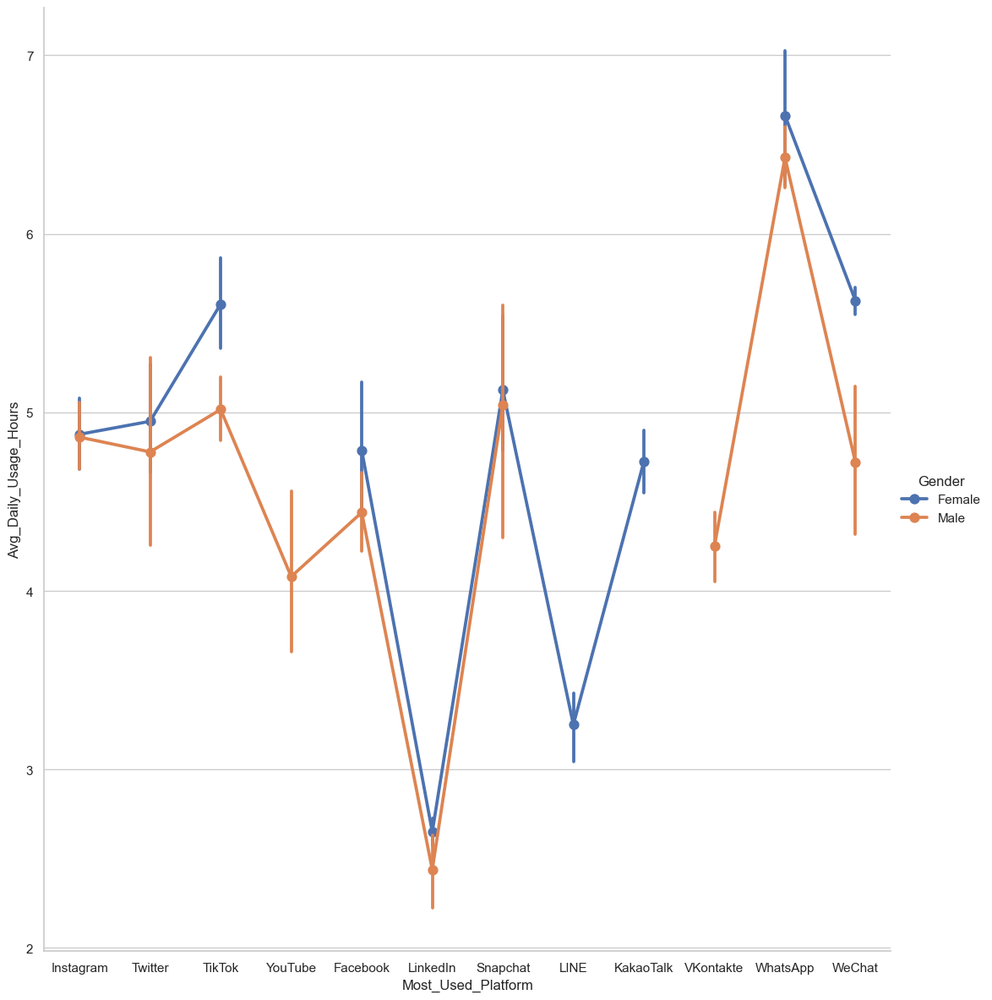

In [47]:
sns.catplot(data=df,
           kind="point",
           x="Most_Used_Platform",
           y="Avg_Daily_Usage_Hours",
           hue="Gender",
           height=12,
           aspect=0.9);

**Observaciones Clave
Diferencia de Promedio por Género (Mujeres > Hombres):**

En la mayoría de las plataformas populares (Instagram, TikTok, Facebook, WhatsApp), el punto azul (Mujeres) está consistentemente por encima del punto naranja (Hombres).

**Conclusión: Las mujeres tienen un promedio de uso diario notablemente más alto que los hombres en las plataformas dominantes.**

Plataformas con Mayor Uso Promedio:

WhatsApp: Presenta el promedio de uso más alto para ambos géneros, con las mujeres llegando a casi 7 horas (el pico más alto).

TikTok y Snapchat: Muestran promedios muy altos para las mujeres (cercanos a 5.7 horas).

**Plataformas de Uso Bajo y Convergencia:**

LinkedIn: Muestra el promedio más bajo para ambos géneros (cercano a 2.6 horas), y lo más importante, los puntos (promedios) de hombres y mujeres están casi idénticos y sus intervalos de confianza se superponen.

**Conclusión: El uso en LinkedIn es bajo, y no hay una diferencia significativa de género en ese uso.**

Diferencia de Uso en YouTube:

Aquí se invierte la tendencia: el promedio de uso de hombres (naranja) es más bajo que el de las mujeres (azul) en casi todas partes, pero en YouTube, el promedio de las mujeres es ≈5.0 horas, mientras que el de los hombres es ≈4.0 horas.


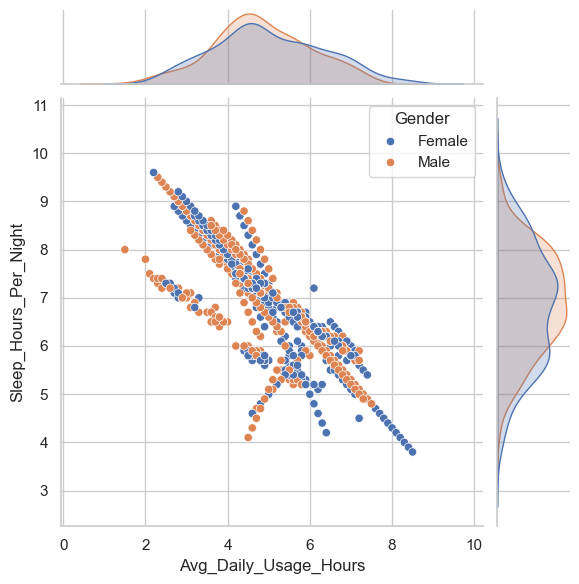

In [48]:
sns.jointplot(data=df,
             x="Avg_Daily_Usage_Hours",
             y="Sleep_Hours_Per_Night",
             hue="Gender");

Relación Bivariada (Gráfico Central)
Correlación: Hay una clara correlación negativa. A medida que las Avg_Daily_Usage_Hours aumentan (vas a la derecha), las Sleep_Hours_Per_Night tienden a disminuir (vas hacia abajo).

**Conclusión: Un mayor uso diario del teléfono/redes sociales está fuertemente asociado con una menor cantidad de horas de sueño.**

Separación por Género: Los puntos azules (Mujeres) y naranjas (Hombres) están bien mezclados.

**Conclusión: La relación negativa entre el uso del teléfono y el sueño afecta a ambos géneros por igual. No hay un grupo que escape a esta correlación.**

2. Distribución de Horas de Sueño (Eje Y, Gráfico Derecho)
Picos: La distribución tiene su pico principal alrededor de 7 a 8 horas, lo que ya habías confirmado con tu displot anterior.

**Diferencia de Género: Se puede ver que la densidad de las mujeres (azul) se extiende ligeramente más abajo (menos horas de sueño) que la de los hombres (naranja), confirmando tu observación anterior del boxplot.**

3. Distribución de Uso Diario (Eje X, Gráfico Superior)
Picos: La distribución de uso es más dispersa, pero tiene picos alrededor de 4-5 horas y luego una densidad alta alrededor de 6-7 horas.

Diferencia de Género: El gráfico superior es más ancho para las mujeres (azul) en el rango de uso más alto (6 a 8 horas), mientras que la densidad de los hombres (naranja) parece concentrarse un poco más en el rango de 4 a 6 horas. Esto sugiere que las mujeres están sobrerrepresentadas en el extremo de mayor uso diario, lo que concuerda con lo que observaste en los pointplot y boxplot anteriores.

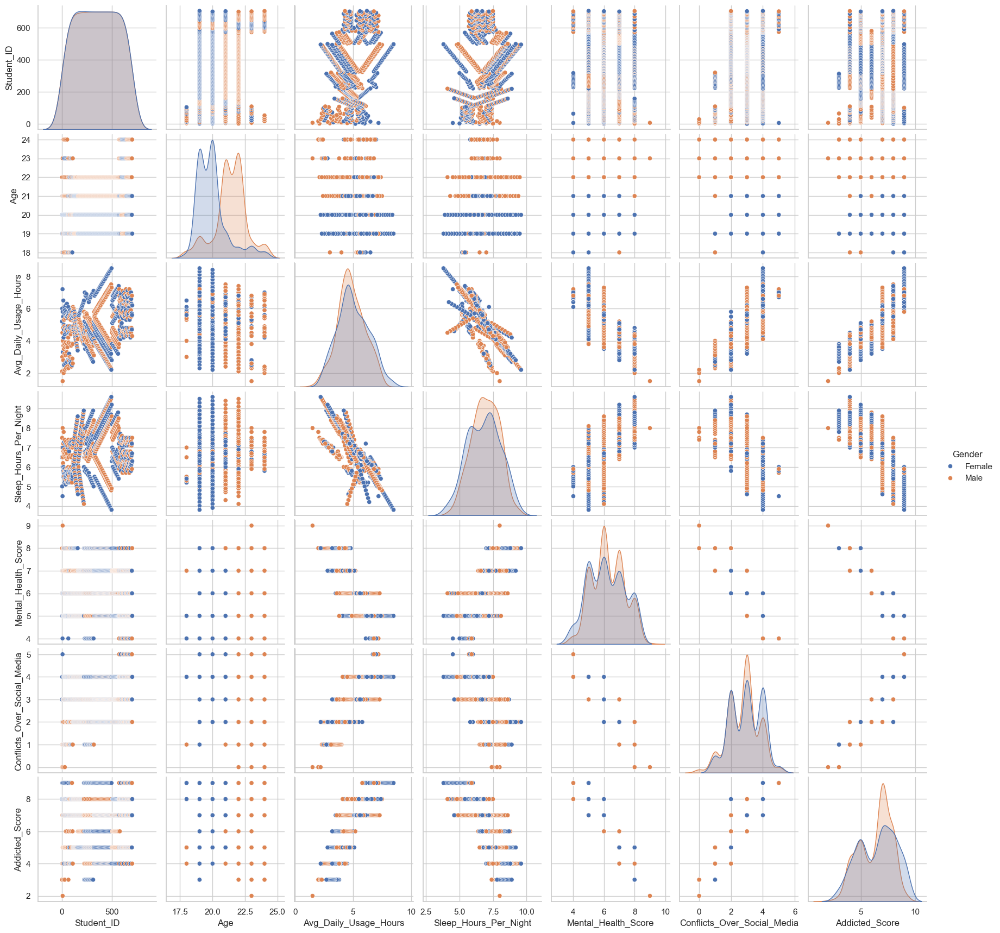

In [49]:
sns.pairplot(data=df,
            hue="Gender");

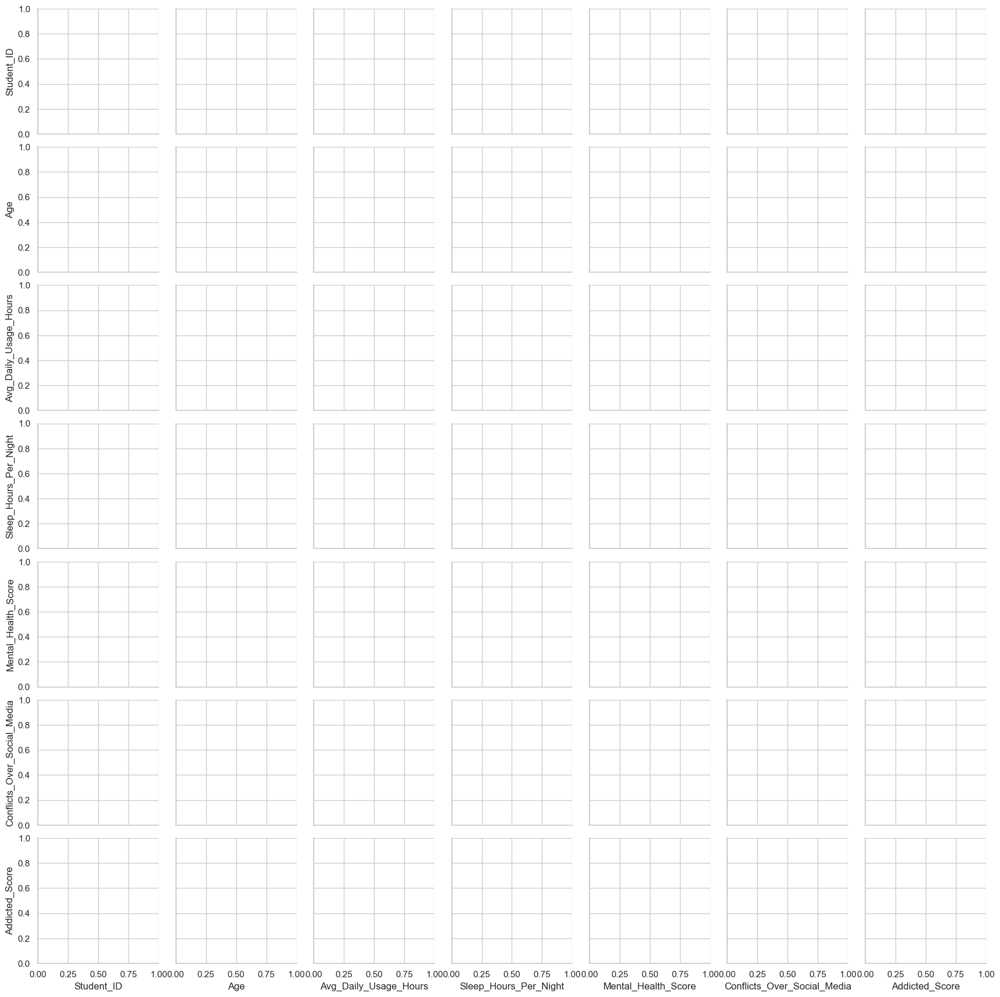

In [50]:
a = sns.PairGrid(df,
            hue="Gender");

Se creo un conjunto de ejes que contiene todas las variables numericas de mi dataset, que estan tanto en el eje X e Y

Tambien estas variables se pueden repetir en el eje X tanto como en el Y

C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\U

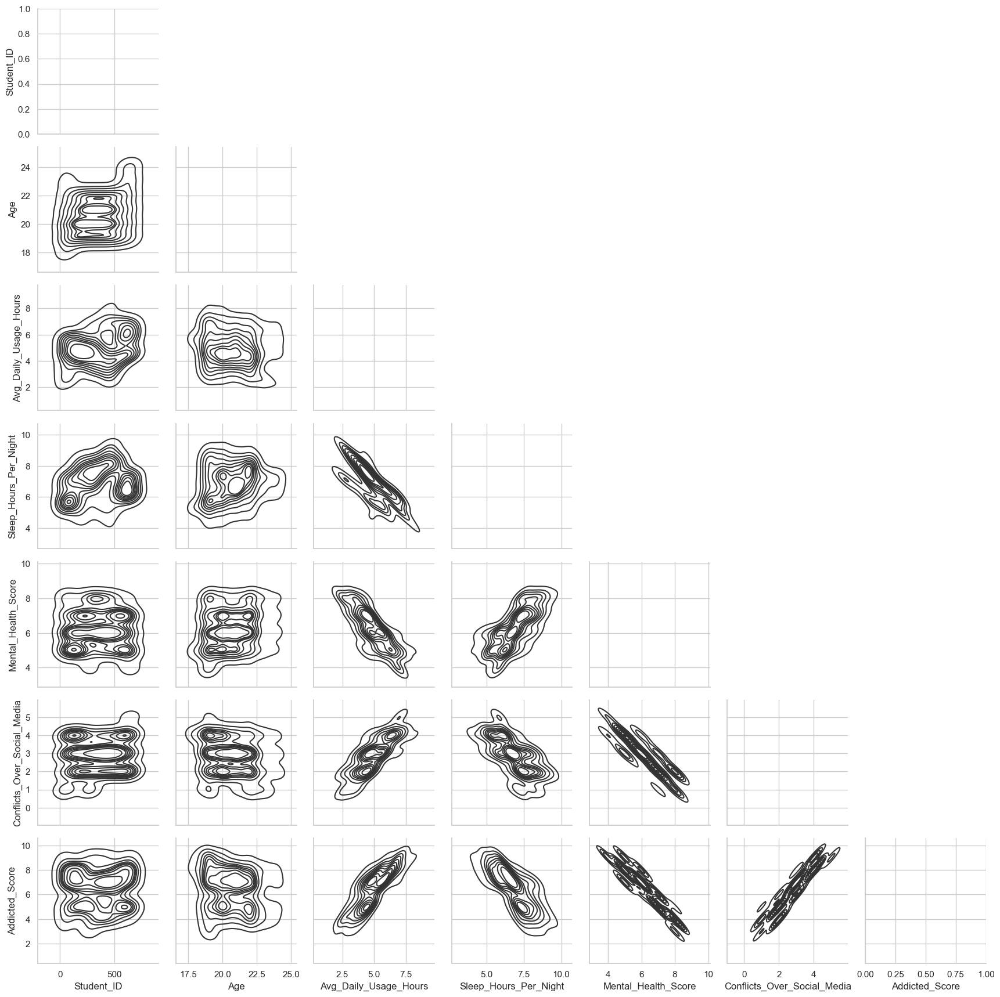

In [51]:
a = sns.PairGrid(df,
            hue="Gender",
            corner=True);

a.map_lower(sns.kdeplot,hue=None,
           level=5,
           color=".2");

C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\U

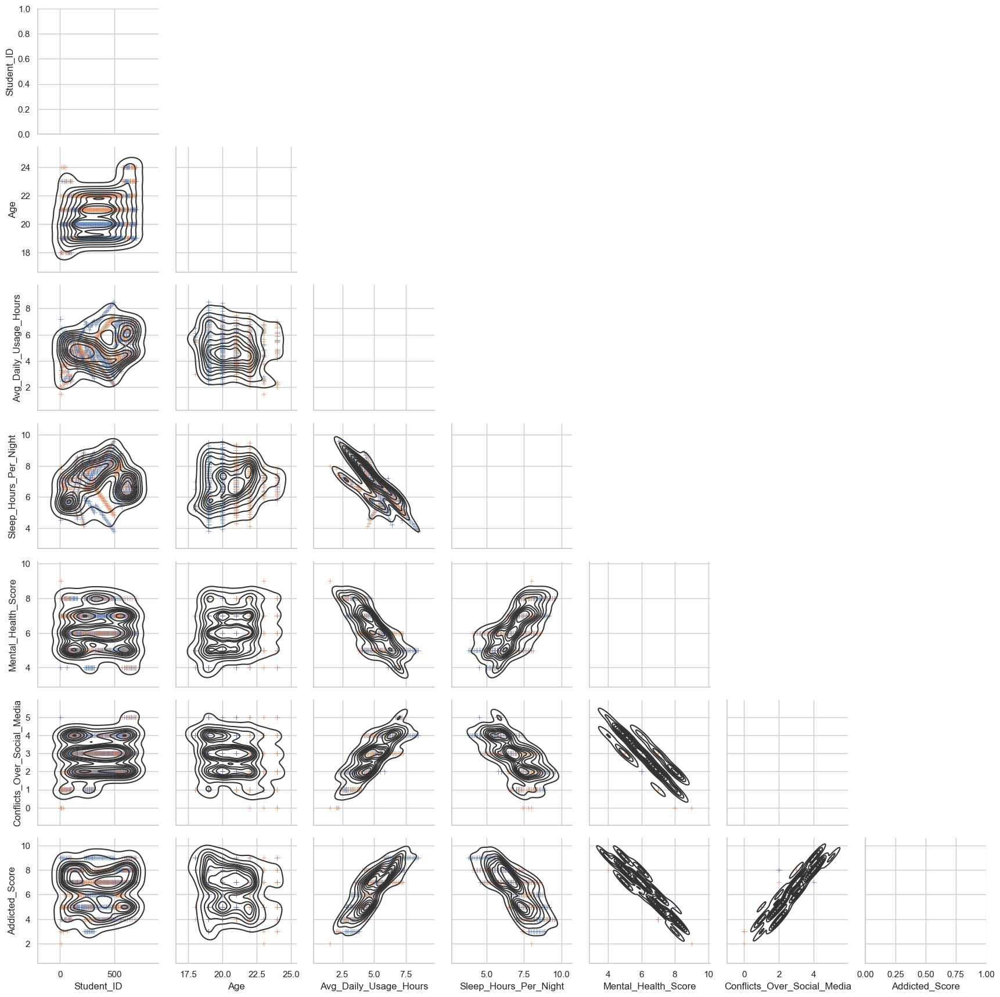

In [52]:
a = sns.PairGrid(df,
            hue="Gender",
            corner=True);

a.map_lower(sns.kdeplot,hue=None,
           level=5,
           color=".2")

a.map_lower(sns.scatterplot,
           marker="+");

C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\U

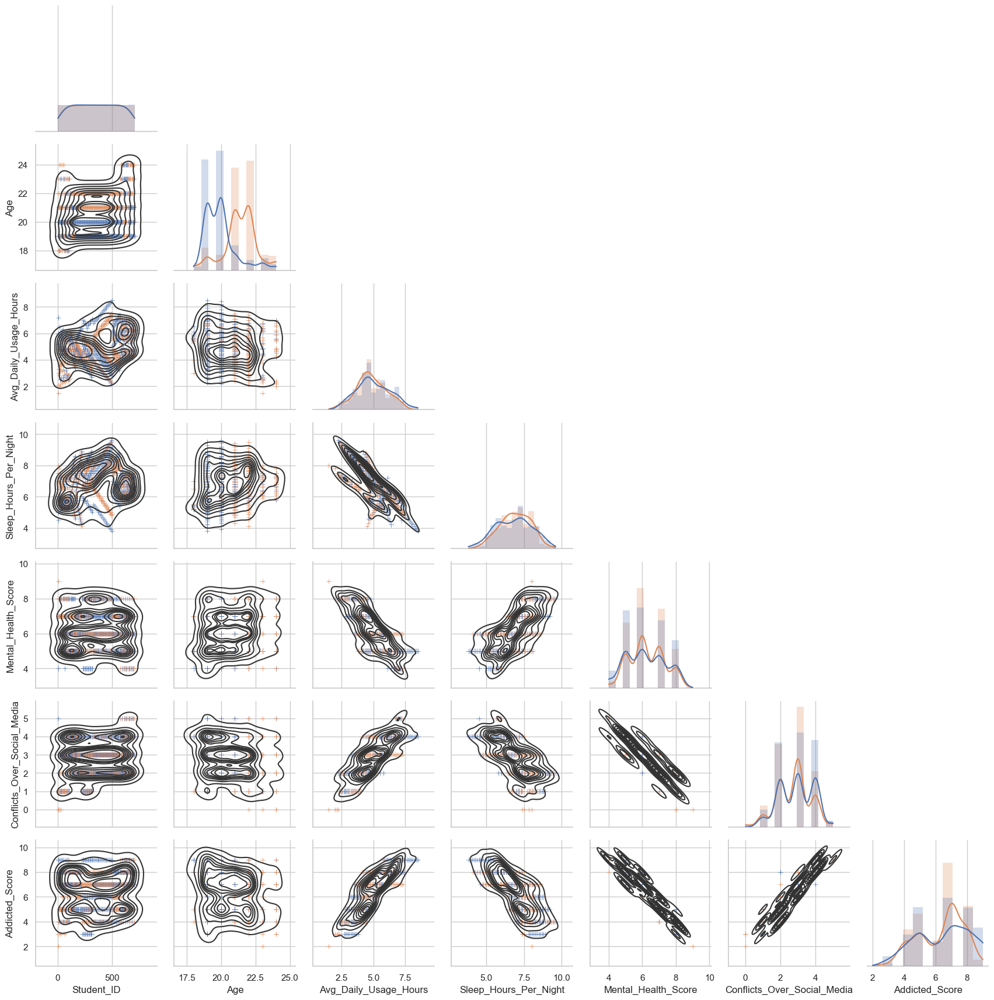

In [53]:
a = sns.PairGrid(df,
            hue="Gender",
            corner=True);

a.map_lower(sns.kdeplot,hue=None,
           level=5,
           color=".2")

a.map_lower(sns.scatterplot,
           marker="+");

a.map_diag(sns.histplot,
          element="step",
          linewidth=0,
          kde=True);

C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\U

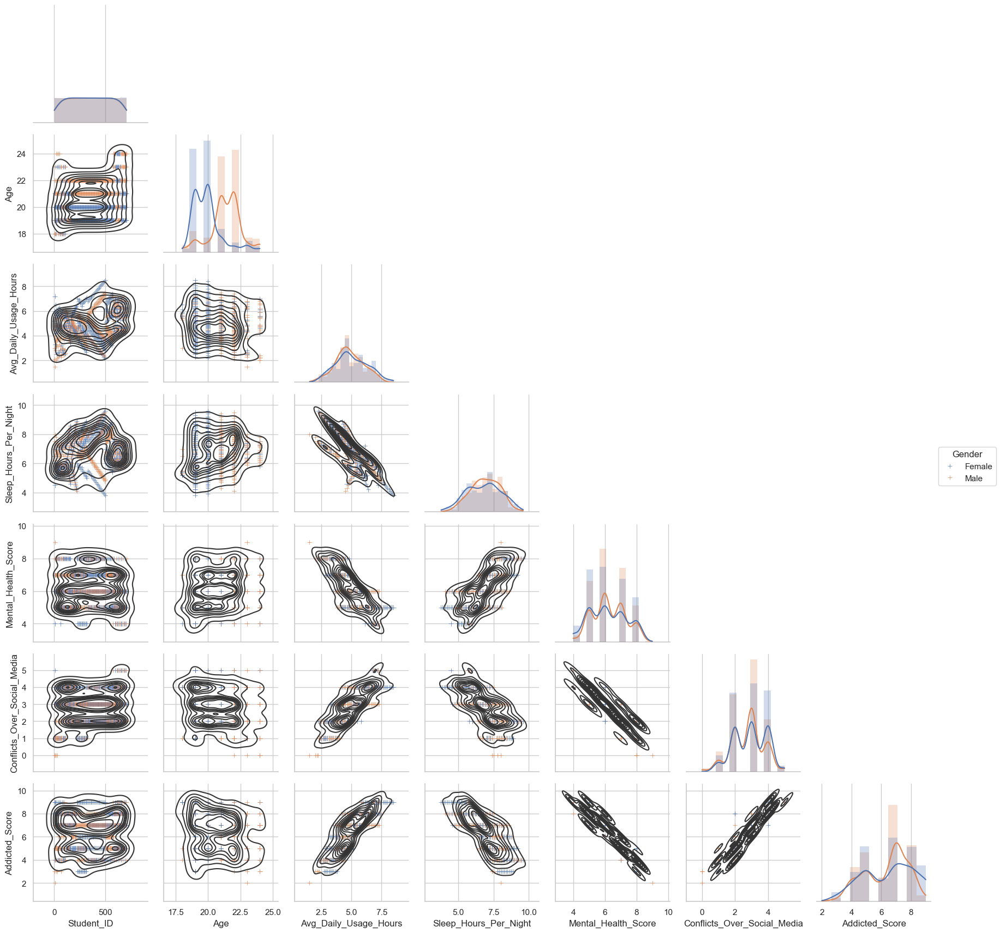

In [54]:
a = sns.PairGrid(df,
            hue="Gender",
            corner=True);

a.map_lower(sns.kdeplot,hue=None,
           level=5,
           color=".2")

a.map_lower(sns.scatterplot,
           marker="+");

a.map_diag(sns.histplot,
          element="step",
          linewidth=0,
          kde=True);

a.add_legend(frameon=True)

C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\Users\Matias\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(
C:\U

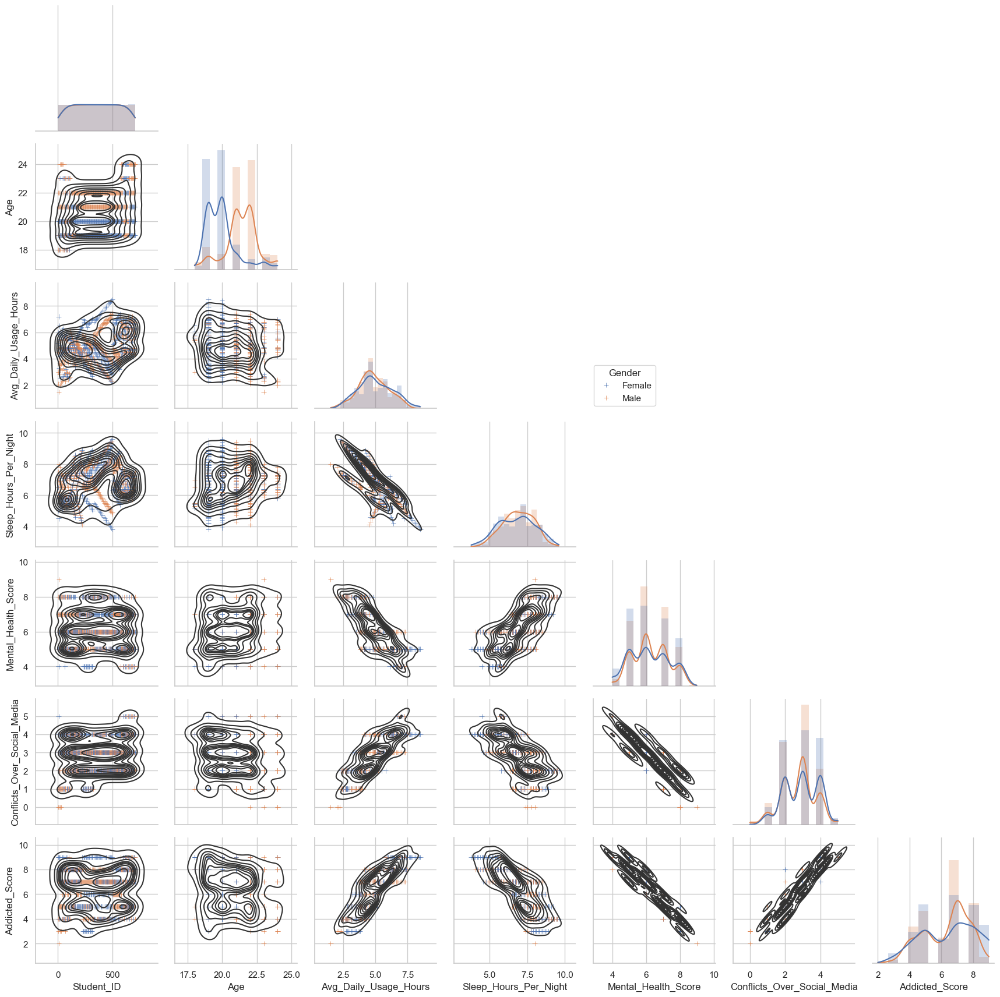

In [55]:
a = sns.PairGrid(df,
            hue="Gender",
            corner=True);

a.map_lower(sns.kdeplot,hue=None,
           level=5,
           color=".2")

a.map_lower(sns.scatterplot,
           marker="+");

a.map_diag(sns.histplot,
          element="step",
          linewidth=0,
          kde=True);

a.add_legend(frameon=True)
a.legend.set_bbox_to_anchor((.61,.6));

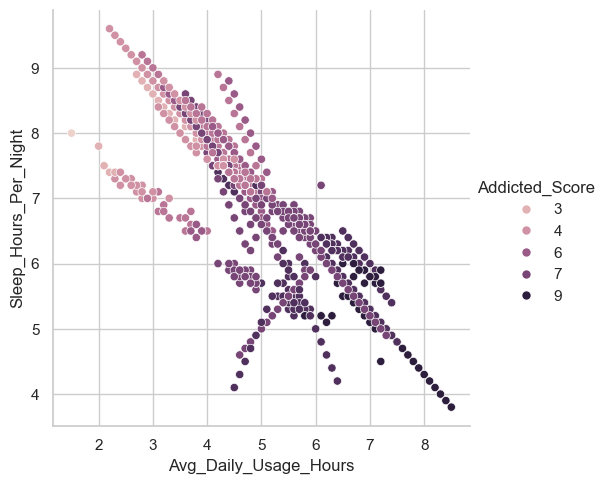

In [56]:
sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           hue="Addicted_Score");

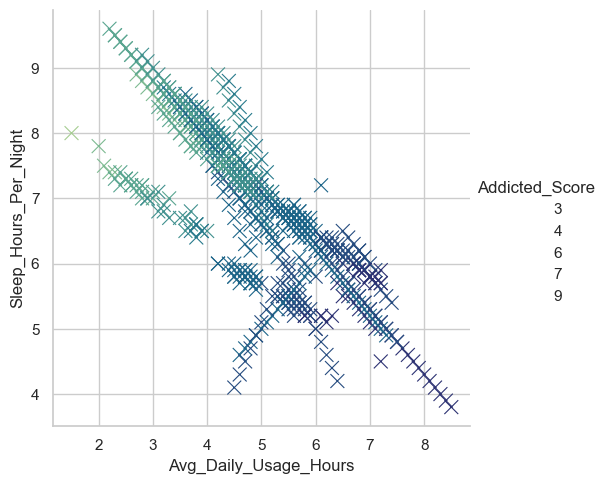

In [57]:
sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           hue="Addicted_Score",
           palette="crest",
           marker="x",
           s=100);

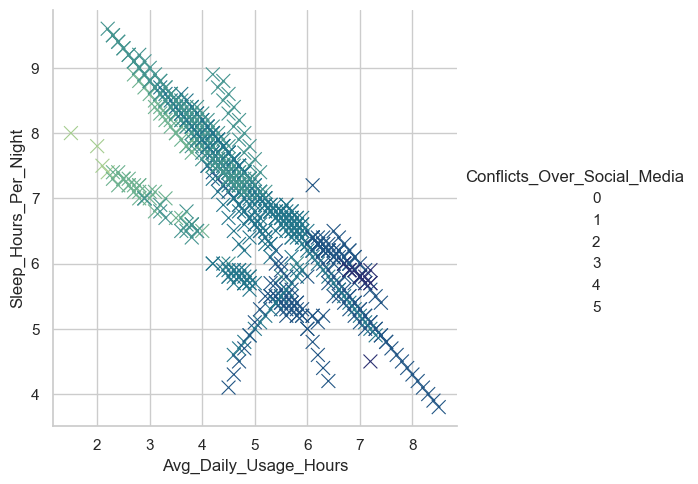

In [58]:
sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           hue="Conflicts_Over_Social_Media",
           palette="crest",
           marker="x",
           s=100);

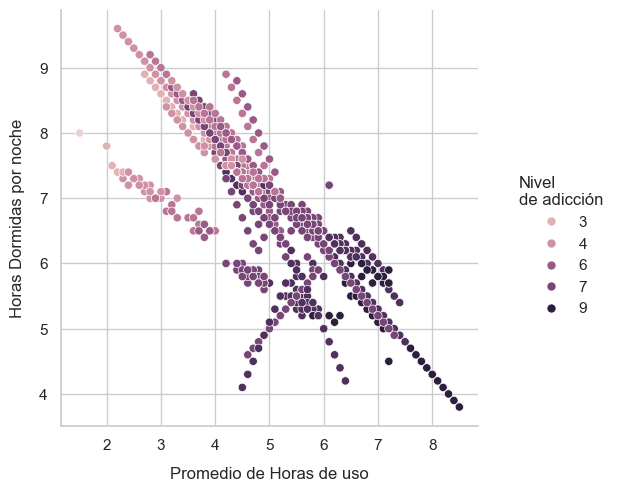

In [59]:
s = sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           hue="Addicted_Score")
s.set_axis_labels("Promedio de Horas de uso",
                 "Horas Dormidas por noche",
                 labelpad=10)

s.legend.set_title("Nivel\nde adicción");

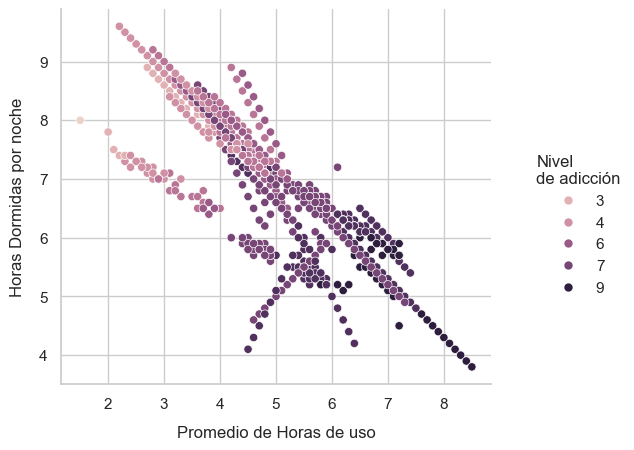

In [60]:
s = sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           hue="Addicted_Score")
s.set_axis_labels("Promedio de Horas de uso",
                 "Horas Dormidas por noche",
                 labelpad=10)

s.legend.set_title("Nivel\nde adicción")
s.figure.set_size_inches(6.5,4.5);

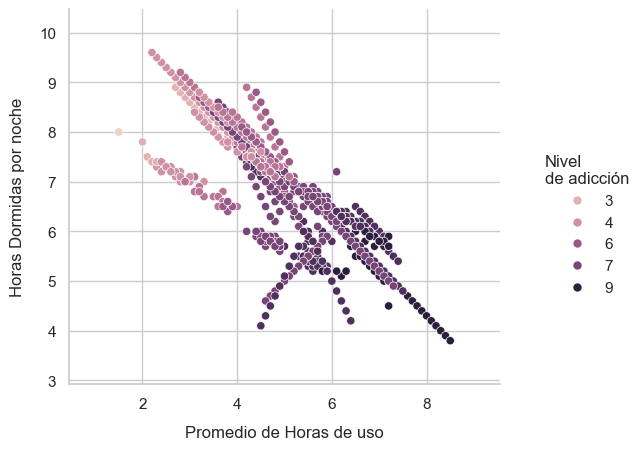

In [61]:
s = sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           hue="Addicted_Score")
s.set_axis_labels("Promedio de Horas de uso",
                 "Horas Dormidas por noche",
                 labelpad=10)

s.legend.set_title("Nivel\nde adicción")
s.figure.set_size_inches(6.5,4.5);
s.ax.margins(.15)

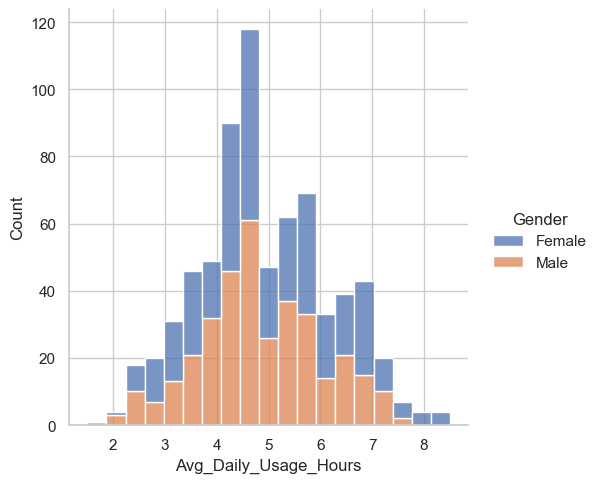

In [62]:
sns.displot(data=df,
           x="Avg_Daily_Usage_Hours",
           hue="Gender",
           multiple="stack"); 

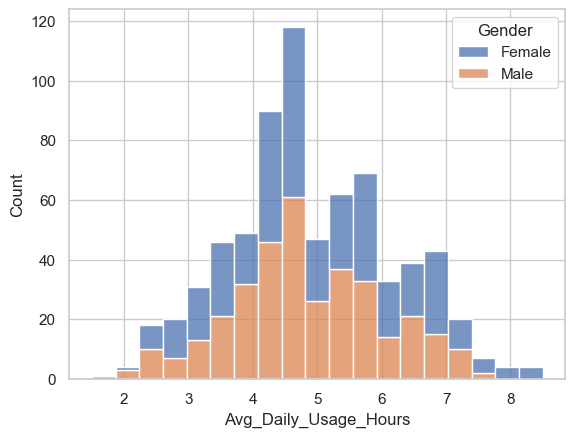

In [63]:
sns.histplot(data=df,
           x="Avg_Daily_Usage_Hours",
           hue="Gender",
           multiple="stack"); 

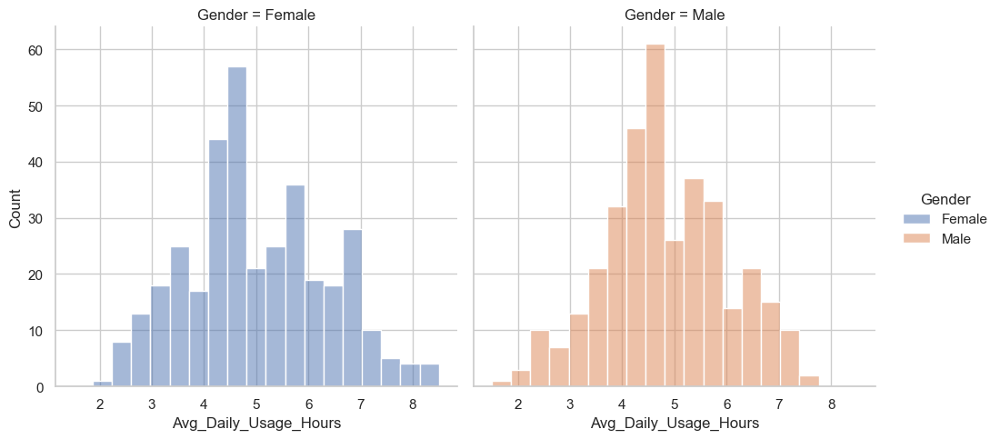

In [64]:
sns.displot(data=df,
           x="Avg_Daily_Usage_Hours",
           hue="Gender",
           col="Gender"); 

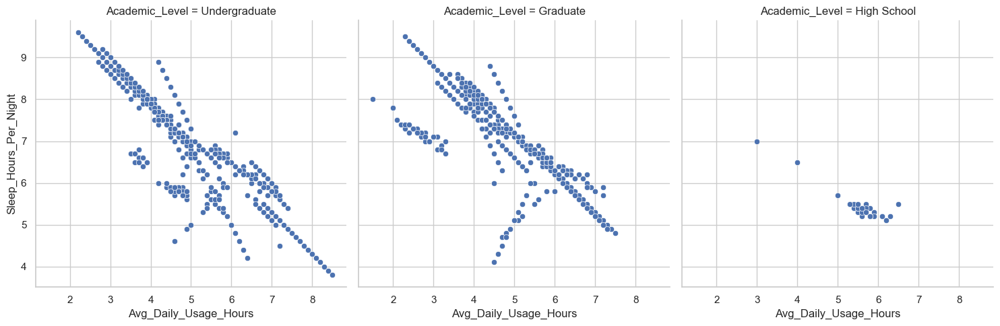

In [65]:
sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           col="Academic_Level");

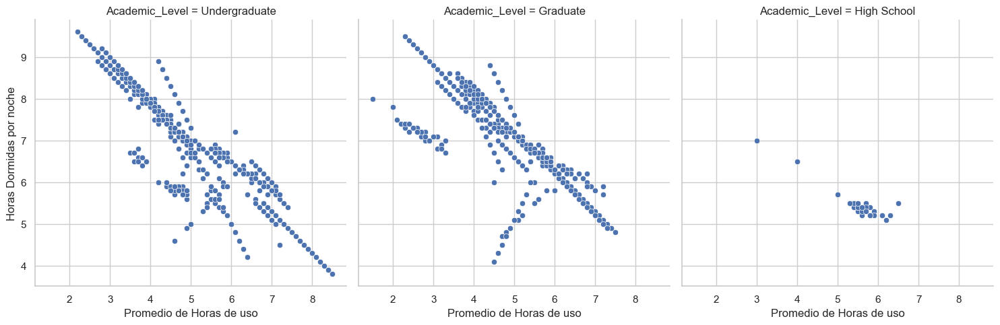

In [66]:
graf = sns.relplot(data=df,
           x="Avg_Daily_Usage_Hours",
           y="Sleep_Hours_Per_Night",
           col="Academic_Level")
graf.set_axis_labels("Promedio de Horas de uso",
                 "Horas Dormidas por noche");

#### Machine Learning Aprendizaje Supervisado (Regresión Lineal)

In [67]:
# Problema: Predecir la Puntuación de Salud Mental

# Queremos saber si la puntuación de salud mental de un estudiante está linealmente relacionada con su puntuación de adicción a las redes sociales.

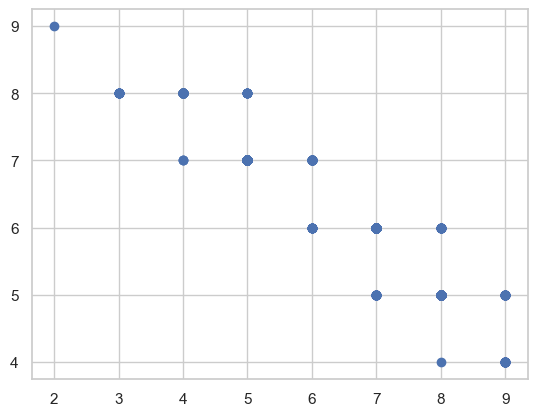

In [68]:
plt.scatter(df['Addicted_Score'],df['Mental_Health_Score']);

Creamos nuestra variable de entrada la cual contiene los datos que conocemos, esta tiene que ser una DataFrame por que recibe tanto filas como colummnas

In [69]:
X = df[["Addicted_Score"]]

In [70]:
X

,Addicted_Score
0,8
1,3
2,9
3,4
4,7
...,...
700,5
701,9
702,7
703,4


Nuestra proxima variable es la de salida con la cual queremos predecir en base a la de entrada , y que usamos para el entrenamiento

In [71]:
y = df["Mental_Health_Score"] 

In [72]:
y

0      6
1      8
2      5
3      7
4      6
      ..
700    7
701    4
702    6
703    8
704    5
Name: Mental_Health_Score, Length: 705, dtype: int64

Aca creamos un objeto de regresion lineal con la libreria sklearn, que es nuestra base para el entrenamiento

In [73]:
modelo = linear_model.LinearRegression()

Luego nuestro modelo se entrena con la funcion fit que toma a nuestro modelo de regresion lineal y lo entrena para luego predecir

In [74]:
modelo.fit(X,y)

LinearRegression()

In [75]:
modelo.predict([[2]])

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([9.14635808])

Finalmente nuestro modelo ya con el entrenamiento pudo predecir el valor que consta de que si un estudiante con adiccion de 2 tiene una salud mental de 9.14 y este resultado puede variar ya que es una aproximación

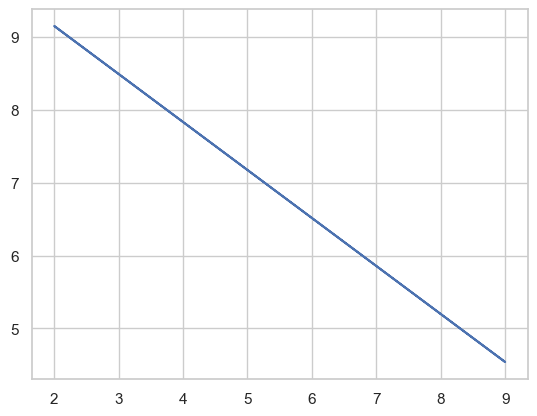

In [76]:
plt.plot(df["Addicted_Score"],modelo.predict(X));

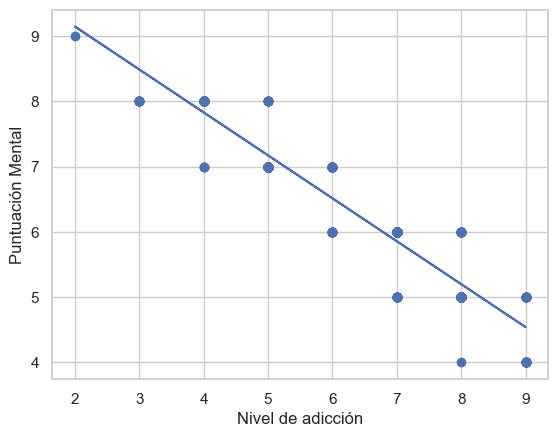

In [77]:
plt.scatter(df["Addicted_Score"],df["Mental_Health_Score"])
plt.plot(df["Addicted_Score"],modelo.predict(X))

plt.xlabel("Nivel de adicción")
plt.ylabel("Puntuación Mental");

| Elemento | Tu Definición Natural | Implementación en Python |
| :--- | :--- | :--- |
| **Definir $X$ (Predictor)** | "X = contiene los datos de los puntajes de adicción" | `X = df[['Addicted_Score']]` |
| **Definir $Y$ (Objetivo)** | Puntuación de Salud Mental | `Y = df['Mental_Health_Score']` |
| **Instanciar** | (Crear la máquina de regresión) | `modelo = linear_model.LinearRegression()` |
| **Entrenar** | "Modelo tiene lo aprendido..." | `modelo.fit(X, y)` |
| **Predecir** | "Modelo, muéstrame las predicciones en base X" | `modelo.predict(X)` |

In [78]:
# Problema: Predecir la Puntuación de Adicción
# Queremos saber si el tiempo que un estudiante que pasa usando las redes sociales está linealmente relacionado con su nivel de adicción.

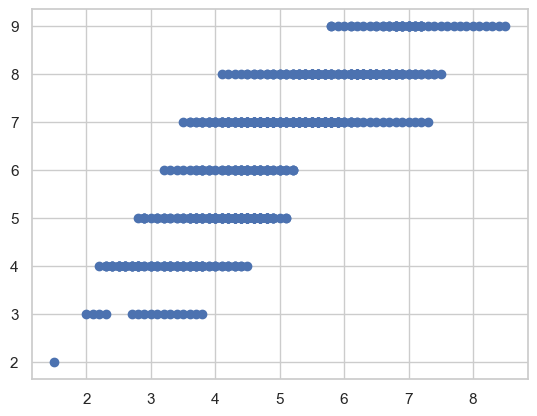

In [79]:
plt.scatter(df["Avg_Daily_Usage_Hours"],df["Addicted_Score"]);

In [80]:
X = df[["Avg_Daily_Usage_Hours"]]

In [81]:
X

,Avg_Daily_Usage_Hours
0,5.2
1,2.1
2,6.0
3,3.0
4,4.5
...,...
700,4.7
701,6.8
702,5.6
703,4.3


In [82]:
y = df["Addicted_Score"]

In [83]:
y 

0      8
1      3
2      9
3      4
4      7
      ..
700    5
701    9
702    7
703    4
704    8
Name: Addicted_Score, Length: 705, dtype: int64

In [84]:
modelo = linear_model.LinearRegression()

In [85]:
modelo.fit(X,y)

LinearRegression()

In [86]:
modelo.predict([[4]])

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([5.47203191])

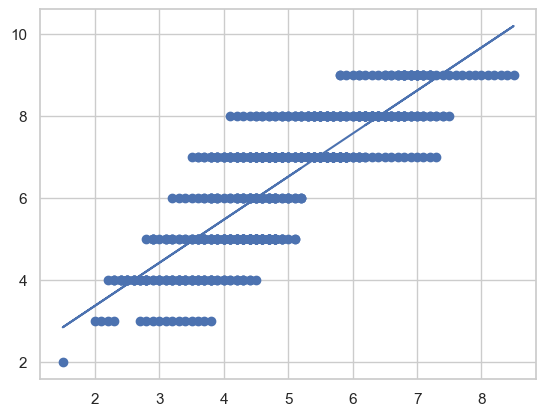

In [87]:
plt.scatter(df["Avg_Daily_Usage_Hours"],df["Addicted_Score"])
plt.plot(df["Avg_Daily_Usage_Hours"],modelo.predict((X)));

In [88]:
# Problema: Predecir un conflicto en base a la Puntuación de Salud Mental
# Queremos ver si una mejor salud mental está relacionada con menos conflictos

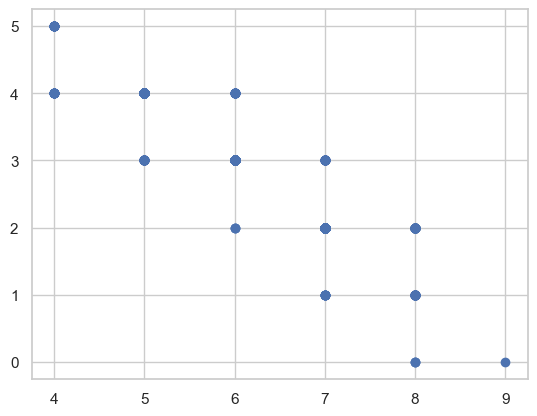

In [89]:
plt.scatter(df['Mental_Health_Score'],df['Conflicts_Over_Social_Media']);

In [90]:
X = df[['Mental_Health_Score']]

In [91]:
y = df['Conflicts_Over_Social_Media']

In [92]:
modelo = linear_model.LinearRegression()

In [93]:
modelo.fit(X,y)

LinearRegression()

In [94]:
modelo.predict([[9]])

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([0.70154765])

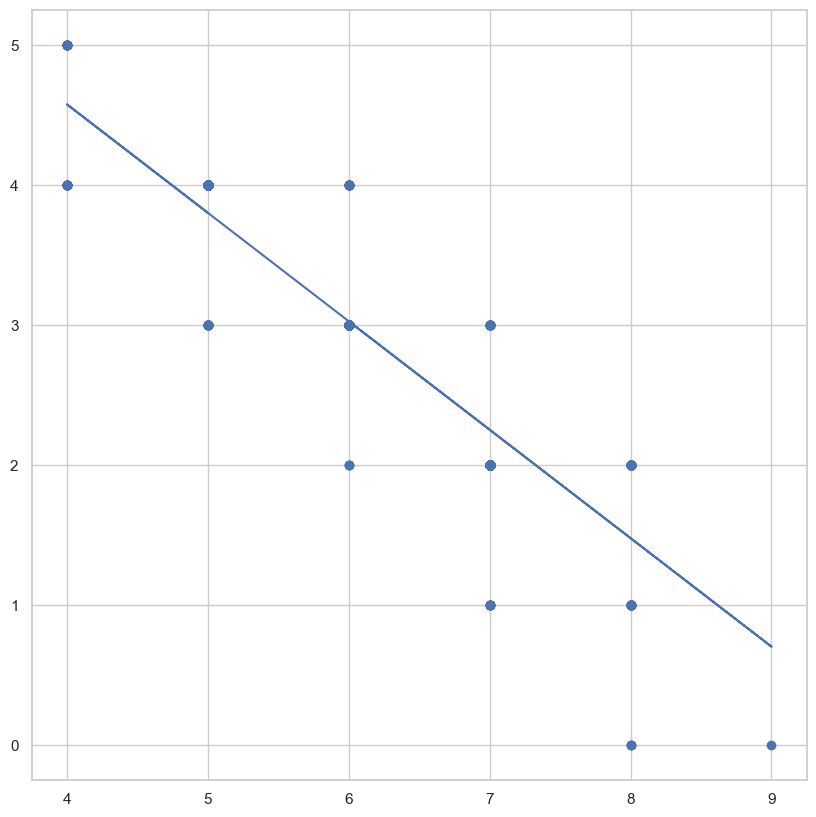

In [95]:
plt.figure(figsize=(10,10))
plt.scatter(df['Mental_Health_Score'],df['Conflicts_Over_Social_Media'])
plt.plot(df['Mental_Health_Score'],modelo.predict(X));

In [96]:
# Problema: Predecir el nivel de Conflictos en las redes sociales en base a las adiccion a las redes sociales
# Queremos saber si la adiccion a las redes sociales esta linealmente relacionada con el conflicto en las redes sociales

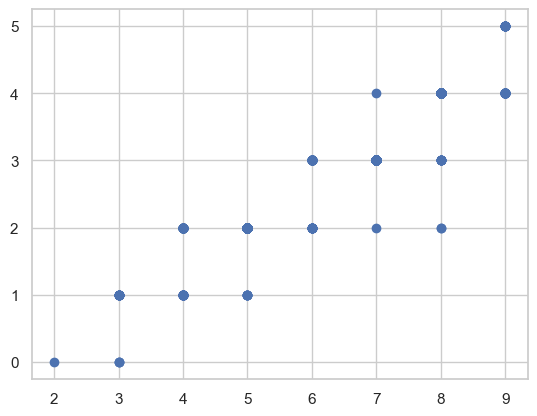

In [97]:
plt.scatter(df['Addicted_Score'],df['Conflicts_Over_Social_Media']);

In [98]:
X = df[['Addicted_Score']]

In [99]:
y = df['Conflicts_Over_Social_Media']

In [100]:
modelo_conflicto_adiccion = LinearRegression()

In [101]:
modelo_conflicto_adiccion.fit(X,y)

LinearRegression()

In [102]:
modelo_conflicto_adiccion.predict([[7]])

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([3.16695594])

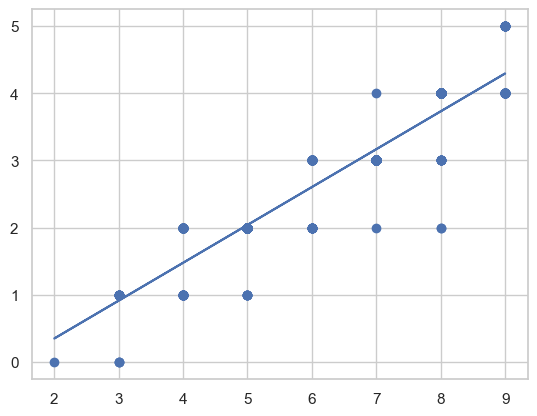

In [103]:
plt.scatter(df['Addicted_Score'],df['Conflicts_Over_Social_Media'])
plt.plot(df['Addicted_Score'],modelo_conflicto_adiccion.predict(X));

#### Machine Learning Aprendizaje Supervisado (Regresión Logistica)

In [104]:
# Objetivo: Clasificar si el estudiante tiene 'Alto Riesgo' o 'Bajo Riesgo' de adicción, usando como predictor su Puntuación de Salud Mental.

In [105]:
df['Addicted_Risk'] = np.where(df['Addicted_Score'] > 6, 'Alto Riesgo', 'Bajo Riesgo')

In [106]:
df

,Student_ID,Age,Gender,Academic_Level,Country,Avg_Daily_Usage_Hours,Most_Used_Platform,Affects_Academic_Performance,Sleep_Hours_Per_Night,Mental_Health_Score,Relationship_Status,Conflicts_Over_Social_Media,Addicted_Score,Addicted_Risk
0,1,19,Female,Undergraduate,Bangladesh,5.2,Instagram,Yes,6.5,6,In Relationship,3,8,Alto Riesgo
1,2,22,Male,Graduate,India,2.1,Twitter,No,7.5,8,Single,0,3,Bajo Riesgo
2,3,20,Female,Undergraduate,USA,6.0,TikTok,Yes,5.0,5,Complicated,4,9,Alto Riesgo
3,4,18,Male,High School,UK,3.0,YouTube,No,7.0,7,Single,1,4,Bajo Riesgo
4,5,21,Male,Graduate,Canada,4.5,Facebook,Yes,6.0,6,In Relationship,2,7,Alto Riesgo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,701,20,Female,Undergraduate,Italy,4.7,TikTok,No,7.2,7,In Relationship,2,5,Bajo Riesgo
701,702,23,Male,Graduate,Russia,6.8,Instagram,Yes,5.9,4,Single,5,9,Alto Riesgo
702,703,21,Female,Undergraduate,China,5.6,WeChat,Yes,6.7,6,In Relationship,3,7,Alto Riesgo
703,704,24,Male,Graduate,Japan,4.3,Twitter,No,7.5,8,Single,2,4,Bajo Riesgo


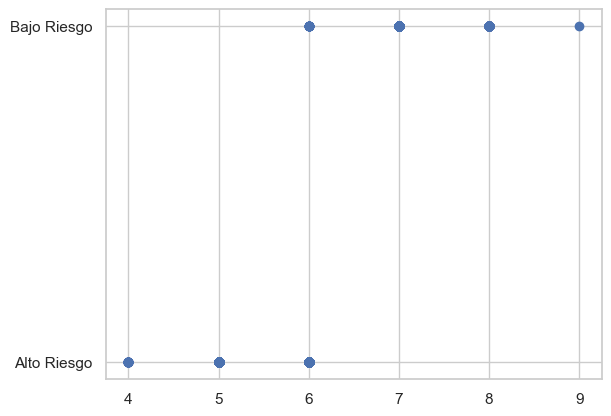

In [107]:
plt.scatter(df['Mental_Health_Score'],df['Addicted_Risk']);

In [108]:
X = df[['Mental_Health_Score']]

In [109]:
y = df['Addicted_Risk']

In [110]:
le = LabelEncoder()

In [111]:
y_codificado = le.fit_transform(y)

In [112]:
y_codificado

array([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0,

In [113]:
## LabelEncoder y la Base de Scikit-learn

#El uso de LabelEncoder ejemplifica los dos pasos fundamentales de casi todas las herramientas de preprocesamiento en Scikit-learn: .fit() (Aprender) y .transform() (Aplicar).


### 1. El Propósito de .fit(): APRENDER 🧠

# El método .fit() inspecciona los datos para **aprender la regla de conversión**.

# Acción: le.fit(y)  lee la columna de texto (y).
# Tarea Clave: Identifica todas las etiquetas de texto únicas (ej., 'Alto Riesgo', 'Bajo Riesgo').
# Resultado: Crea y almacena internamente un diccionario de mapeo, asignando un índice numérico a cada etiqueta (ej., 'Alto Riesgo' -> 0, 'Bajo Riesgo' -> 1.



### 2. El Propósito de  .transform() : APLICAR 🚀

# El método .transform() usa la regla aprendida por .fit() para realizar la conversión.

# Acción: le.transform(y) aplica el mapeo almacenado.
# Tarea Clave: Reemplaza cada texto por su número asignado.
# Resultado: Genera la nueva columna y_codificada que solo contiene números (0s y 1s).



### 3. La Ejecución en Código (Uso Práctico)

# La forma más común y eficiente para los datos de entrenamiento es combinar ambos pasos:

#from sklearn.preprocessing import LabelEncoder

# 1. Instanciar el objeto transformador
# le = LabelEncoder() 

# 2. Fit and Transform (Aprender y Aplicar en un solo paso)
# y_codificado = le.fit_transform(y)

In [114]:
clases = le.classes_
print(f"Clases codificadas: {clases}")
print(f"La clase 0 es: {clases[0]}")
print(f"La clase 1 es: {clases[1]}")

Clases codificadas: ['Alto Riesgo' 'Bajo Riesgo']
La clase 0 es: Alto Riesgo
La clase 1 es: Bajo Riesgo


In [115]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y_codificado,train_size=0.9)

In [116]:
X_entrena

,Mental_Health_Score
610,6
595,6
552,8
439,6
615,7
...,...
326,5
205,5
634,6
301,6


In [117]:
X_prueba

,Mental_Health_Score
241,5
531,7
686,8
266,6
374,8
...,...
563,7
130,7
433,5
468,7


In [118]:
modelo = LogisticRegression()

In [119]:
modelo.fit(X_entrena,y_entrena)

LogisticRegression()

In [120]:
modelo.score(X_entrena,y_entrena)

0.9826498422712934

In [121]:
modelo.score(X_prueba,y_prueba)

0.971830985915493

In [122]:
nuevos_datos = pd.DataFrame({"Mental_Health_Score": np.linspace(4, 9, 50)})

In [123]:
nuevos_datos

,Mental_Health_Score
0,4.000000
1,4.102041
2,4.204082
3,4.306122
4,4.408163
5,4.510204
6,4.612245
7,4.714286
8,4.816327
9,4.918367


In [124]:
probabilidades_adiccion = modelo.predict_proba(nuevos_datos)

In [125]:
probabilidades_adiccion

array([[9.99998979e-01, 1.02056655e-06],
       [9.99998175e-01, 1.82450403e-06],
       [9.99996738e-01, 3.26173030e-06],
       [9.99994169e-01, 5.83110386e-06],
       [9.99989576e-01, 1.04244374e-05],
       [9.99981364e-01, 1.86360087e-05],
       [9.99966684e-01, 3.33158099e-05],
       [9.99940442e-01, 5.95583726e-05],
       [9.99893530e-01, 1.06469764e-04],
       [9.99809676e-01, 1.90324069e-04],
       [9.99659801e-01, 3.40198545e-04],
       [9.99391977e-01, 6.08022887e-04],
       [9.98913535e-01, 1.08646518e-03],
       [9.98059346e-01, 1.94065405e-03],
       [9.96535915e-01, 3.46408514e-03],
       [9.93823977e-01, 6.17602319e-03],
       [9.89012345e-01, 1.09876548e-02],
       [9.80525513e-01, 1.94744874e-02],
       [9.65710745e-01, 3.42892547e-02],
       [9.40312029e-01, 5.96879714e-02],
       [8.98085420e-01, 1.01914580e-01],
       [8.31343520e-01, 1.68656480e-01],
       [7.33846767e-01, 2.66153233e-01],
       [6.06655905e-01, 3.93344095e-01],
       [4.631484

In [126]:
probabilidades_adiccion_baja = probabilidades_adiccion[:,1]
probabilidades_adiccion_baja

array([1.02056655e-06, 1.82450403e-06, 3.26173030e-06, 5.83110386e-06,
       1.04244374e-05, 1.86360087e-05, 3.33158099e-05, 5.95583726e-05,
       1.06469764e-04, 1.90324069e-04, 3.40198545e-04, 6.08022887e-04,
       1.08646518e-03, 1.94065405e-03, 3.46408514e-03, 6.17602319e-03,
       1.09876548e-02, 1.94744874e-02, 3.42892547e-02, 5.96879714e-02,
       1.01914580e-01, 1.68656480e-01, 2.66153233e-01, 3.93344095e-01,
       5.36851581e-01, 6.74503506e-01, 7.87442239e-01, 8.68815644e-01,
       9.22118004e-01, 9.54887298e-01, 9.74253693e-01, 9.85433132e-01,
       9.91799149e-01, 9.95396085e-01, 9.97419491e-01, 9.98554908e-01,
       9.99191149e-01, 9.99547395e-01, 9.99746778e-01, 9.99858340e-01,
       9.99920755e-01, 9.99955672e-01, 9.99975204e-01, 9.99986130e-01,
       9.99992241e-01, 9.99995660e-01, 9.99997572e-01, 9.99998642e-01,
       9.99999240e-01, 9.99999575e-01])

In [127]:
probabilidades_adiccion_alta = probabilidades_adiccion[:,0]
probabilidades_adiccion_alta

array([9.99998979e-01, 9.99998175e-01, 9.99996738e-01, 9.99994169e-01,
       9.99989576e-01, 9.99981364e-01, 9.99966684e-01, 9.99940442e-01,
       9.99893530e-01, 9.99809676e-01, 9.99659801e-01, 9.99391977e-01,
       9.98913535e-01, 9.98059346e-01, 9.96535915e-01, 9.93823977e-01,
       9.89012345e-01, 9.80525513e-01, 9.65710745e-01, 9.40312029e-01,
       8.98085420e-01, 8.31343520e-01, 7.33846767e-01, 6.06655905e-01,
       4.63148419e-01, 3.25496494e-01, 2.12557761e-01, 1.31184356e-01,
       7.78819956e-02, 4.51127021e-02, 2.57463068e-02, 1.45668683e-02,
       8.20085100e-03, 4.60391475e-03, 2.58050884e-03, 1.44509236e-03,
       8.08850743e-04, 4.52605010e-04, 2.53222408e-04, 1.41659841e-04,
       7.92446614e-05, 4.43283263e-05, 2.47962481e-05, 1.38703325e-05,
       7.75864145e-06, 4.33993597e-06, 2.42761777e-06, 1.35792857e-06,
       7.59579687e-07, 4.24883282e-07])

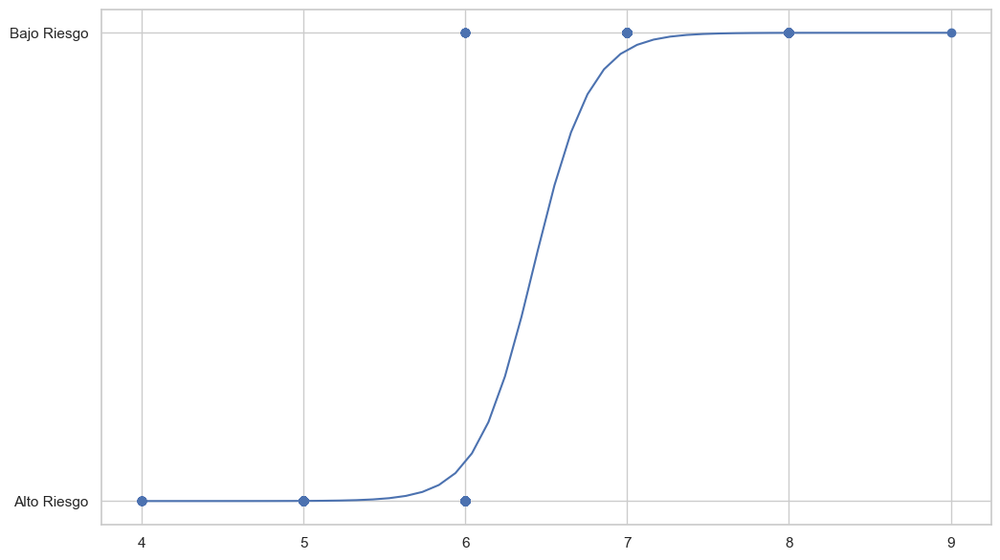

In [128]:
plt.figure(figsize=(12,7))
plt.scatter(df['Mental_Health_Score'], df['Addicted_Risk'])
plt.plot(nuevos_datos,probabilidades_adiccion_baja);

In [129]:
array_numerico = np.array([0,1,0,1,0,1])

In [130]:
predicciones_numericas = array_numerico

In [131]:
predicciones_texto = le.inverse_transform(predicciones_numericas) 

In [132]:
print(f'Predicciones Numericas,{predicciones_numericas}')
print(f'Predicciones Texto,{predicciones_texto}')

Predicciones Numericas,[0 1 0 1 0 1]
Predicciones Texto,['Alto Riesgo' 'Bajo Riesgo' 'Alto Riesgo' 'Bajo Riesgo' 'Alto Riesgo'
 'Bajo Riesgo']


In [133]:
# Objetivo: Predecir la probabilidad de que el uso promedio diario del teléfono (Avg_Daily_Usage_Hours) afecte el rendimiento académico (Affects_Academic_Performance).

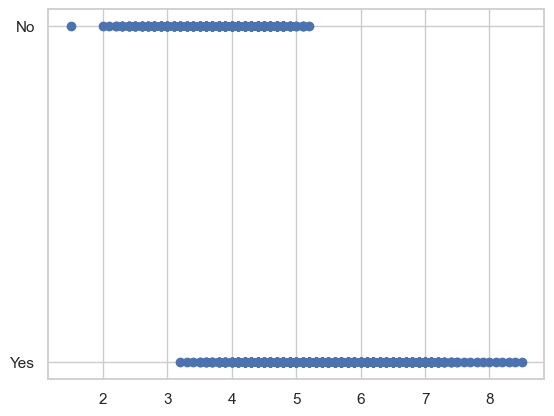

In [134]:
plt.scatter(df['Avg_Daily_Usage_Hours'],df['Affects_Academic_Performance']);

In [135]:
X = df[['Avg_Daily_Usage_Hours']]

In [136]:
y = df['Affects_Academic_Performance']

In [137]:
le = LabelEncoder()

In [138]:
y_afecta_rendimiento = le.fit_transform(y)

In [139]:
y_afecta_rendimiento

array([1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1,

In [140]:
## 🔢 Apunte Clave: Mapeo de Clases con le.classes_

# El atributo le.classes_ es fundamental porque revela el diccionario interno que el LabelEncoder ha creado durante la fase de .fit()

### 1. ¿Qué Contiene?
# Contiene un array de todas las etiquetas de texto únicas*encontradas en la columna y original (antes de la codificación), ordenadas alfabéticamente.

### 2. La Regla de Mapeo
# El índice (posición) de la etiqueta de texto en este array es el **número codificado** que le corresponde.

#  Índice | Etiqueta de Texto le.classes_[índice] | Número Codificado |
#  0 Etiqueta que empieza con A, C, etc. | Clase 0 |
#  1 Siguiente etiqueta en orden alfabético. | Clase 1 |

### 3. Ejemplo de Uso en Código

# Este código te permite verificar el mapeo exacto de texto a número:

# Obtener el array de clases (etiquetas de texto ordenadas alfabéticamente)
# clases_rendimiento = le.classes_

# Imprimir el mapeo. En tu caso:
# clases[0] -> 'No'
# clases[1] -> 'Yes'


# print(f"Clases codificadas: {clases_rendimiento}")
# print(f"La clase numérica 0 es: {clases_rendimiento[0]}")
# print(f"La clase numérica 1 es: {clases_rendimiento[1]}")

In [141]:
clases_rendimiento = le.classes_

print(f"Clases codificadas: {clases_rendimiento}")
print(f"La clase numérica 0 es: {clases_rendimiento[0]}")
print(f"La clase numérica 1 es: {clases_rendimiento[1]}")

Clases codificadas: ['No' 'Yes']
La clase numérica 0 es: No
La clase numérica 1 es: Yes


In [142]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y_afecta_rendimiento,train_size=0.9,random_state=42)

In [143]:
modelo_rendimiento = LogisticRegression()

In [144]:
modelo_rendimiento.fit(X_entrena,y_entrena)

LogisticRegression()

In [145]:
score_entrenamiento = modelo_rendimiento.score(X_entrena,y_entrena)

In [146]:
print(f"Precisión del Árbol de Decisión en datos de entrenamiento: {score_entrenamiento:.4f}")

Precisión del Árbol de Decisión en datos de entrenamiento: 0.8139


In [147]:
rendimiento_desempeño_prueba = modelo_rendimiento.score(X_prueba,y_prueba)

In [148]:
print(f'El desempeño del modelo con datos de entrenamiento es de {rendimiento_desempeño_prueba:.4f}')

El desempeño del modelo con datos de entrenamiento es de 0.8028


In [149]:
estudiantes_nuevos_horas = pd.DataFrame({"Avg_Daily_Usage_Hours": np.linspace(2, 6.5, 10)}) 

In [150]:
estudiantes_nuevos_horas

,Avg_Daily_Usage_Hours
0,2.0
1,2.5
2,3.0
3,3.5
4,4.0
5,4.5
6,5.0
7,5.5
8,6.0
9,6.5


In [151]:
probabilidades_rendimiento = modelo_rendimiento.predict_proba(estudiantes_nuevos_horas)

In [152]:
probabilidades_rendimiento

array([[0.99587089, 0.00412911],
       [0.98686169, 0.01313831],
       [0.95900476, 0.04099524],
       [0.87930684, 0.12069316],
       [0.69409302, 0.30590698],
       [0.41405364, 0.58594636],
       [0.18037775, 0.81962225],
       [0.06414299, 0.93585701],
       [0.02089957, 0.97910043],
       [0.00660394, 0.99339606]])

In [153]:
probabilidad_no_afecta = probabilidades_rendimiento[:,0]

In [154]:
probabilidad_no_afecta

array([0.99587089, 0.98686169, 0.95900476, 0.87930684, 0.69409302,
       0.41405364, 0.18037775, 0.06414299, 0.02089957, 0.00660394])

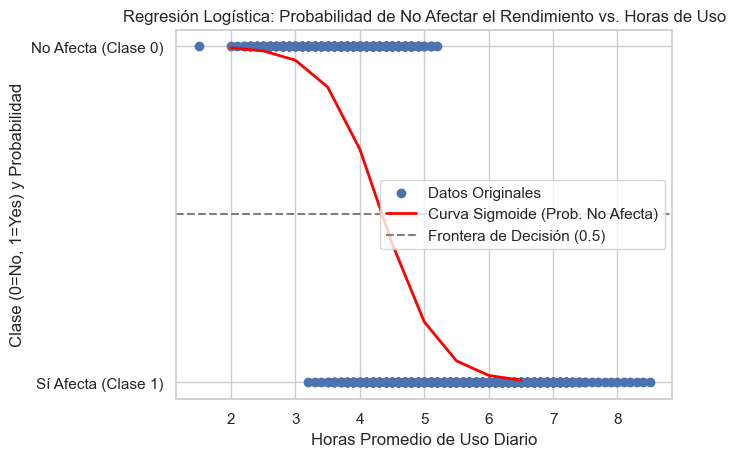

In [155]:
plt.scatter(df['Avg_Daily_Usage_Hours'], df['Affects_Academic_Performance'], label='Datos Originales')
plt.plot(estudiantes_nuevos_horas, probabilidad_no_afecta, color='red', linewidth=2, label='Curva Sigmoide (Prob. No Afecta)');

plt.title('Regresión Logística: Probabilidad de No Afectar el Rendimiento vs. Horas de Uso')
plt.xlabel('Horas Promedio de Uso Diario')
plt.ylabel('Clase (0=No, 1=Yes) y Probabilidad')
plt.yticks([0, 1], ['Sí Afecta (Clase 1)', 'No Afecta (Clase 0)'])
plt.axhline(0.5, color='gray', linestyle='--', label='Frontera de Decisión (0.5)') 
plt.legend(loc='center right')
plt.grid(True)
plt.show()

In [156]:
#Objetivo: Encontrar cual es la probabilidad de que el uso de las horas en el telefono afecta la probabilidad de riesgos de adicción

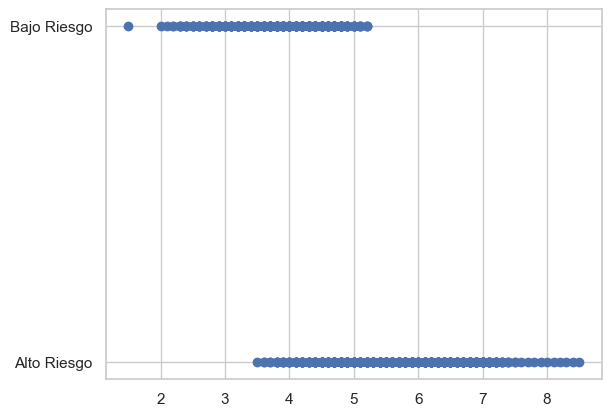

In [157]:
plt.scatter(df["Avg_Daily_Usage_Hours"],df['Addicted_Risk']);

In [158]:
X = df[["Avg_Daily_Usage_Hours"]]

In [159]:
y = y_codificado

In [160]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.7,random_state=42)

In [161]:
modelo_logistico = LogisticRegression()

In [162]:
modelo_logistico.fit(X_prueba,y_prueba)

LogisticRegression()

In [163]:
test_desempeño_prueba = modelo_logistico.score(X_prueba,y_prueba)

In [164]:
print(f'El desempeño del modelo con los datos de prueba fue de {test_desempeño_prueba:.2f}')

El desempeño del modelo con los datos de prueba fue de 0.86


In [165]:
test_desempeño_entrenamiento = modelo_logistico.score(X_entrena,y_entrena)

In [166]:
print(f'El desempeño del modelo con los datos de entrenamiento fue de {test_desempeño_entrenamiento:.2f}')

El desempeño del modelo con los datos de entrenamiento fue de 0.82


In [167]:
nuevas_horas_uso = pd.DataFrame({"Avg_Daily_Usage_Hours": np.linspace(1.5,8.5,50)})

In [168]:
nuevas_horas_uso

,Avg_Daily_Usage_Hours
0,1.500000
1,1.642857
2,1.785714
3,1.928571
4,2.071429
5,2.214286
6,2.357143
7,2.500000
8,2.642857
9,2.785714


In [169]:
probabilidades_uso_riesgo = modelo_logistico.predict_proba(nuevas_horas_uso)

In [170]:
probabilidades_uso_riesgo

array([[3.76131353e-04, 9.99623869e-01],
       [5.41576918e-04, 9.99458423e-01],
       [7.79738793e-04, 9.99220261e-01],
       [1.12251623e-03, 9.98877484e-01],
       [1.61573684e-03, 9.98384263e-01],
       [2.32516841e-03, 9.97674832e-01],
       [3.34505082e-03, 9.96654949e-01],
       [4.81012472e-03, 9.95189875e-01],
       [6.91242500e-03, 9.93087575e-01],
       [9.92438818e-03, 9.90075612e-01],
       [1.42299539e-02, 9.85770046e-01],
       [2.03650115e-02, 9.79634989e-01],
       [2.90671247e-02, 9.70932875e-01],
       [4.13308297e-02, 9.58669170e-01],
       [5.84571893e-02, 9.41542811e-01],
       [8.20726860e-02, 9.17927314e-01],
       [1.14072517e-01, 8.85927483e-01],
       [1.56422837e-01, 8.43577163e-01],
       [2.10755687e-01, 7.89244313e-01],
       [2.77747145e-01, 7.22252855e-01],
       [3.56416464e-01, 6.43583536e-01],
       [4.43680085e-01, 5.56319915e-01],
       [5.34562904e-01, 4.65437096e-01],
       [6.23207445e-01, 3.76792555e-01],
       [7.043078

In [171]:
probabilidad_alto_riesgo_uso = probabilidades_uso_riesgo[:, 1]

In [172]:
probabilidad_alto_riesgo_uso

array([9.99623869e-01, 9.99458423e-01, 9.99220261e-01, 9.98877484e-01,
       9.98384263e-01, 9.97674832e-01, 9.96654949e-01, 9.95189875e-01,
       9.93087575e-01, 9.90075612e-01, 9.85770046e-01, 9.79634989e-01,
       9.70932875e-01, 9.58669170e-01, 9.41542811e-01, 9.17927314e-01,
       8.85927483e-01, 8.43577163e-01, 7.89244313e-01, 7.22252855e-01,
       6.43583536e-01, 5.56319915e-01, 4.65437096e-01, 3.76792555e-01,
       2.95692111e-01, 2.25725106e-01, 1.68356339e-01, 1.23247150e-01,
       8.89319879e-02, 6.34792943e-02, 4.49518409e-02, 3.16491784e-02,
       2.21917183e-02, 1.55150720e-02, 1.08249372e-02, 7.54174735e-03,
       5.24906069e-03, 3.65078555e-03, 2.53792414e-03, 1.76369348e-03,
       1.22536299e-03, 8.51206489e-04, 5.91228578e-04, 4.10621229e-04,
       2.85169717e-04, 1.98038104e-04, 1.37525283e-04, 9.55010850e-05,
       6.63175518e-05, 4.60516072e-05])

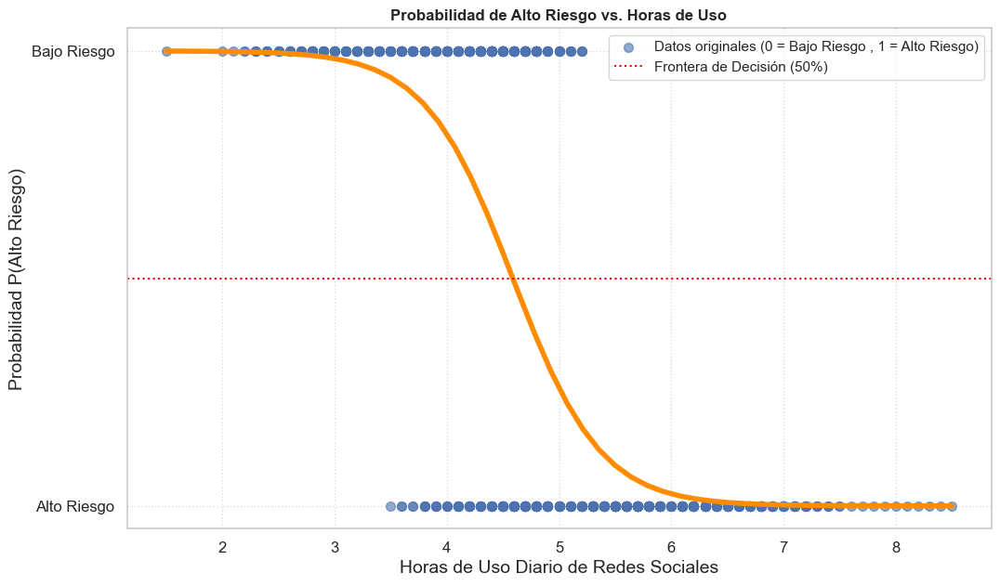

In [173]:
plt.figure(figsize=(12,7))
plt.scatter(df["Avg_Daily_Usage_Hours"],df['Addicted_Risk'],label='Datos originales (0 = Bajo Riesgo , 1 = Alto Riesgo)',alpha=0.6,s=50)
plt.plot(nuevas_horas_uso,probabilidad_alto_riesgo_uso,color='darkorange',linewidth=4)

plt.title('Probabilidad de Alto Riesgo vs. Horas de Uso',fontweight='bold')
plt.axhline(0.5,linestyle=':',color='red',label='Frontera de Decisión (50%)')
plt.xlabel('Horas de Uso Diario de Redes Sociales',fontsize=14)
plt.ylabel('Probabilidad P(Alto Riesgo)',fontsize=14)
plt.legend()
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle=':', alpha=0.7);

In [174]:
# 📚 Apunte: Posicionamiento de la Leyenda (`plt.legend()`)

# El parámetro **`loc`** (location) dentro de `plt.legend()` te permite especificar dónde se debe dibujar el cuadro de la leyenda, lo cual es crucial para evitar que la leyenda tape tus datos o la curva de predicción.

# Opciones Comunes para el Parámetro `loc`

# La siguiente tabla resume los valores más utilizados para el parámetro `loc`:

# | Valor de `loc` (String) | Descripción | Nota Práctica |
# | :---: | :---: | :---: |
# | `'best'` | Automático (Valor por defecto). | `matplotlib` elige la posición con **menor superposición**. |
# | **`'upper right'`** | Esquina superior derecha. | Útil cuando la mayoría de los datos se concentran en la parte inferior. |
# | **`'lower right'`** | Esquina inferior derecha. | **Ideal** si la curva se extiende hacia la parte superior izquierda (como tu Sigmoide invertida). # |
# | **`'upper left'`** | Esquina superior izquierda. | |
# | **`'lower left'`** | Esquina inferior izquierda. | |
# | `'center right'` | Lado derecho, centrado verticalmente. | |
# | `'center'` | Centro del gráfico. | Generalmente **se evita** porque tapa los datos. |


# 💻 Ejemplo de Uso Práctico

# Para colocar la leyenda en la esquina inferior derecha:

# ```python
# plt.legend(loc='lower right')

In [175]:
# Objetivo: Cuantificar y visualizar la relación predictiva entre el nivel de conflictos de los estudiantes por el uso de redes sociales y la probabilidad de que su rendimiento académico se vea afectado.

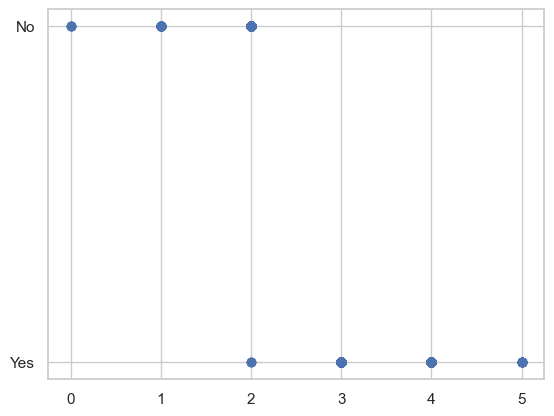

In [176]:
plt.scatter(df["Conflicts_Over_Social_Media"],df["Affects_Academic_Performance"]);

In [177]:
X = df[['Conflicts_Over_Social_Media']]

In [178]:
y = y_afecta_rendimiento

In [179]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.9,random_state=42)

In [180]:
modelo_conflicto_rendimiento = LogisticRegression()

In [181]:
modelo_conflicto_rendimiento.fit(X_entrena,y_entrena)

LogisticRegression()

In [182]:
modelo_conflicto_rendimiento.score(X_entrena,y_entrena)

0.9952681388012619

In [183]:
estudiantes_conflictivos = pd.DataFrame({"Conflicts_Over_Social_Media": np.linspace(0,5,50)})

In [184]:
probabilidades_conflicto_rendimiento = modelo_conflicto_rendimiento.predict_proba(estudiantes_conflictivos)

In [185]:
probabilidades_conflicto_rendimiento

array([[9.99999872e-01, 1.28279000e-07],
       [9.99999752e-01, 2.48349373e-07],
       [9.99999519e-01, 4.80806712e-07],
       [9.99999069e-01, 9.30846094e-07],
       [9.99998198e-01, 1.80212560e-06],
       [9.99996511e-01, 3.48892697e-06],
       [9.99993245e-01, 6.75457479e-06],
       [9.99986923e-01, 1.30768404e-05],
       [9.99974683e-01, 2.53165815e-05],
       [9.99950988e-01, 4.90119888e-05],
       [9.99905117e-01, 9.48833385e-05],
       [9.99816321e-01, 1.83678762e-04],
       [9.99644457e-01, 3.55542758e-04],
       [9.99311895e-01, 6.88105274e-04],
       [9.98668679e-01, 1.33132109e-03],
       [9.97425757e-01, 2.57424286e-03],
       [9.95028220e-01, 4.97177986e-03],
       [9.90419171e-01, 9.58082893e-03],
       [9.81616282e-01, 1.83837182e-02],
       [9.65011009e-01, 3.49889914e-02],
       [9.34409075e-01, 6.55909254e-02],
       [8.80360446e-01, 1.19639554e-01],
       [7.91702584e-01, 2.08297416e-01],
       [6.62530128e-01, 3.37469872e-01],
       [5.034901

In [186]:
probabilidades_no_afecta_rendimiento = probabilidades_conflicto_rendimiento[:,0]

In [187]:
probabilidades_no_afecta_rendimiento

array([9.99999872e-01, 9.99999752e-01, 9.99999519e-01, 9.99999069e-01,
       9.99998198e-01, 9.99996511e-01, 9.99993245e-01, 9.99986923e-01,
       9.99974683e-01, 9.99950988e-01, 9.99905117e-01, 9.99816321e-01,
       9.99644457e-01, 9.99311895e-01, 9.98668679e-01, 9.97425757e-01,
       9.95028220e-01, 9.90419171e-01, 9.81616282e-01, 9.65011009e-01,
       9.34409075e-01, 8.80360446e-01, 7.91702584e-01, 6.62530128e-01,
       5.03490128e-01, 3.43740716e-01, 2.12939442e-01, 1.22611782e-01,
       6.73230955e-02, 3.59440922e-02, 1.88944168e-02, 9.84943750e-03,
       5.11183586e-03, 2.64693945e-03, 1.36896576e-03, 7.07575143e-04,
       3.65606247e-04, 1.88878631e-04, 9.75696918e-05, 5.03996901e-05,
       2.60334002e-05, 1.34471053e-05, 6.94582880e-06, 3.58771535e-06,
       1.85315258e-06, 9.57202914e-07, 4.94420715e-07, 2.55381367e-07,
       1.31911211e-07, 6.81356149e-08])

In [188]:
probabilidades_si_afecta_rendimiento = probabilidades_conflicto_rendimiento[:,1]

In [189]:
probabilidades_si_afecta_rendimiento

array([1.28279000e-07, 2.48349373e-07, 4.80806712e-07, 9.30846094e-07,
       1.80212560e-06, 3.48892697e-06, 6.75457479e-06, 1.30768404e-05,
       2.53165815e-05, 4.90119888e-05, 9.48833385e-05, 1.83678762e-04,
       3.55542758e-04, 6.88105274e-04, 1.33132109e-03, 2.57424286e-03,
       4.97177986e-03, 9.58082893e-03, 1.83837182e-02, 3.49889914e-02,
       6.55909254e-02, 1.19639554e-01, 2.08297416e-01, 3.37469872e-01,
       4.96509872e-01, 6.56259284e-01, 7.87060558e-01, 8.77388218e-01,
       9.32676905e-01, 9.64055908e-01, 9.81105583e-01, 9.90150562e-01,
       9.94888164e-01, 9.97353061e-01, 9.98631034e-01, 9.99292425e-01,
       9.99634394e-01, 9.99811121e-01, 9.99902430e-01, 9.99949600e-01,
       9.99973967e-01, 9.99986553e-01, 9.99993054e-01, 9.99996412e-01,
       9.99998147e-01, 9.99999043e-01, 9.99999506e-01, 9.99999745e-01,
       9.99999868e-01, 9.99999932e-01])

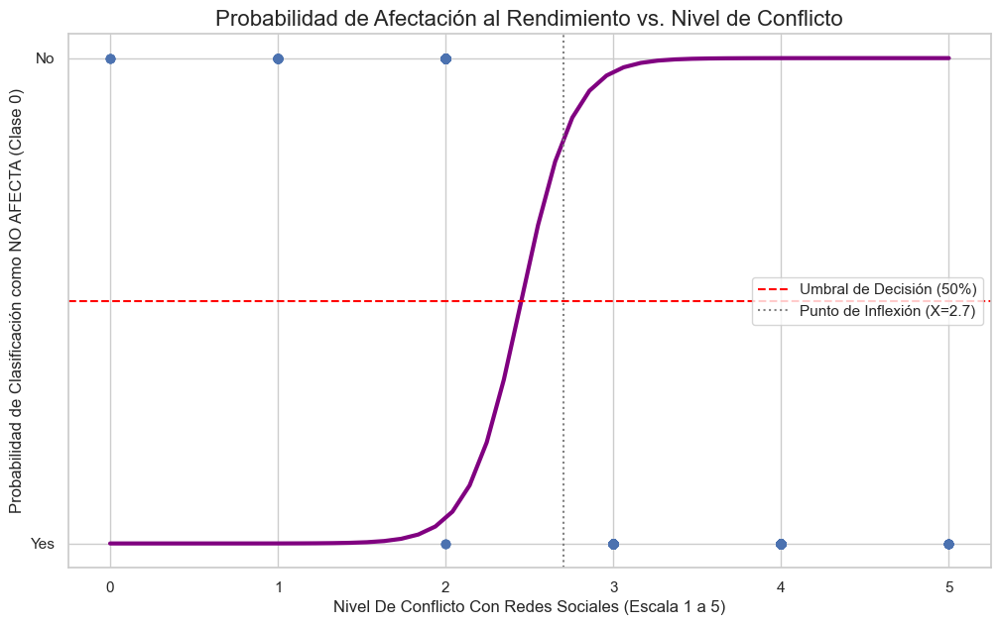

In [190]:
plt.figure(figsize=(12,7))

plt.scatter(df["Conflicts_Over_Social_Media"],df["Affects_Academic_Performance"])
plt.plot(estudiantes_conflictivos,probabilidades_si_afecta_rendimiento,color='purple', linewidth=3)
plt.title("Probabilidad de Afectación al Rendimiento vs. Nivel de Conflicto", fontsize=16)
plt.axhline(y=0.5, color='red', linestyle='--', label='Umbral de Decisión (50%)')
plt.axvline(x=2.7, color='gray', linestyle=':', label='Punto de Inflexión (X=2.7)')
plt.xlabel("Nivel De Conflicto Con Redes Sociales (Escala 1 a 5)", fontsize=12)
plt.ylabel("Probabilidad de Clasificación como NO AFECTA (Clase 0)", fontsize=12)
plt.legend();
plt.grid(True)

In [191]:
# El objetivo principal es lograr que el algoritmo aprenda a distinguir patrones entre los 705 estudiantes para clasificar correctamente quién pertenece al grupo de "Alto Riesgo" y quién al de "Bajo Riesgo". Queremos que, cuando le entreguemos los datos de un estudiante nuevo, el modelo no "adivine", sino que base su respuesta en la evidencia de las variables (sueño, estrés, uso de redes)

In [192]:
X = df[["Age","Avg_Daily_Usage_Hours", 
    "Sleep_Hours_Per_Night", 
    "Mental_Health_Score", 
    "Conflicts_Over_Social_Media"]]

In [193]:
X

,Age,Avg_Daily_Usage_Hours,Sleep_Hours_Per_Night,Mental_Health_Score,Conflicts_Over_Social_Media
0,19,5.2,6.5,6,3
1,22,2.1,7.5,8,0
2,20,6.0,5.0,5,4
3,18,3.0,7.0,7,1
4,21,4.5,6.0,6,2
...,...,...,...,...,...
700,20,4.7,7.2,7,2
701,23,6.8,5.9,4,5
702,21,5.6,6.7,6,3
703,24,4.3,7.5,8,2


In [194]:
y = y_codificado

In [195]:
y

array([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0,

In [196]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,random_state=42)

In [197]:
modelo_riesgo_estudiante = LogisticRegression()

In [198]:
modelo_riesgo_estudiante.fit(X_entrena,y_entrena)

LogisticRegression()

In [199]:
modelo_riesgo_estudiante.score(X_entrena,y_entrena)

0.9829545454545454

In [200]:
modelo_riesgo_estudiante.score(X_prueba,y_prueba)

0.9774011299435028

In [201]:
estudiantes_nuevos = pd.DataFrame({
    'Age': [20, 20],
    'Avg_Daily_Usage_Hours': [6, 3],
    'Sleep_Hours_Per_Night': [4, 7],
    'Mental_Health_Score': [4, 9], 
    'Conflicts_Over_Social_Media': [3, 1]
})

In [202]:
# Ver los coeficientes (pesos) que el modelo le dio a cada columna
for col, coef in zip(X, modelo_riesgo_estudiante.coef_[0]):
    print(f"Variable: {col:25} | Peso: {coef:.4f}")

Variable: Age                       | Peso: -0.2642
Variable: Avg_Daily_Usage_Hours     | Peso: -0.4877
Variable: Sleep_Hours_Per_Night     | Peso: 0.6099
Variable: Mental_Health_Score       | Peso: 4.1157
Variable: Conflicts_Over_Social_Media | Peso: -1.6466


In [203]:
# 1. 'columnas_x' tiene los nombres de nuestras variables (texto)
# 2. 'modelo_riesgo_estudiante.coef_[0]' tiene los pesos numéricos calculados por la IA
# Usamos zip() para emparejar cada nombre con su peso correspondiente
# for col, coef in zip(columnas_x, modelo_riesgo_estudiante.coef_[0]):
    
    # Imprimimos los resultados con formato:
    # {col:25} -> Reserva 25 espacios para el nombre de la columna (alineación)
    # {coef:.4f} -> Muestra el coeficiente con 4 decimales
    # print(f"Variable: {col:25} | Peso: {coef:.4f}")

# REGLA DE ORO PARA INTERPRETAR:
# - Peso POSITIVO (+): Al aumentar esta variable, sube la probabilidad de ser '1' (Bajo Riesgo).
# - Peso NEGATIVO (-): Al aumentar esta variable, baja la probabilidad de ser '1' (es decir, nos acerca al '0' o Alto Riesgo).
# - Valor cercano a CERO: Esa variable casi no influye en la decisión del modelo.

In [204]:
print(modelo_riesgo_estudiante.predict(estudiantes_nuevos))

[0 1]


In [205]:
modelo_riesgo_probabilidad = modelo_riesgo_estudiante.predict_proba(estudiantes_nuevos)

In [206]:
modelo_riesgo_probabilidad

array([[9.99997106e-01, 2.89387913e-06],
       [5.51147467e-07, 9.99999449e-01]])

In [207]:
print(modelo_riesgo_estudiante.classes_)

[0 1]


In [208]:
modelo_riesgo_estudiante_si_afecta_riesgo = modelo_riesgo_probabilidad[:,0]

In [209]:
modelo_riesgo_estudiante_si_afecta_riesgo

array([9.99997106e-01, 5.51147467e-07])

In [210]:
modelo_riesgo_estudiante_no_afecta_riesgo = modelo_riesgo_probabilidad[:,1]

In [211]:
modelo_riesgo_estudiante_no_afecta_riesgo

array([2.89387913e-06, 9.99999449e-01])

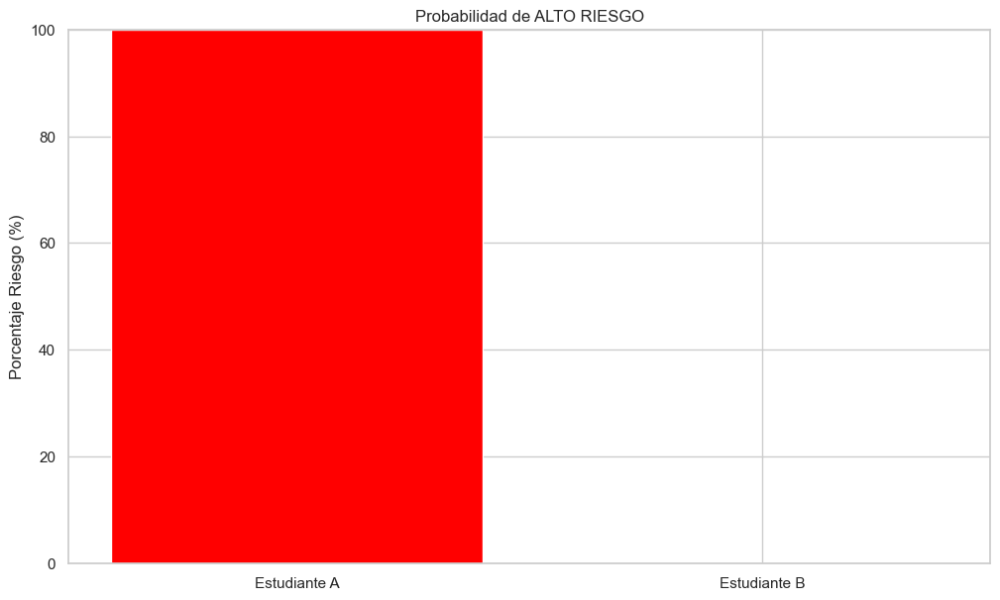

In [212]:
plt.figure(figsize=(12,7))

nombres = ['Estudiante A','Estudiante B']
porcentajes = modelo_riesgo_estudiante_si_afecta_riesgo * 100

plt.bar(nombres,porcentajes,color=['red','green'])

plt.title('Probabilidad de ALTO RIESGO')
plt.ylabel('Porcentaje Riesgo (%)')
plt.ylim(0,100);


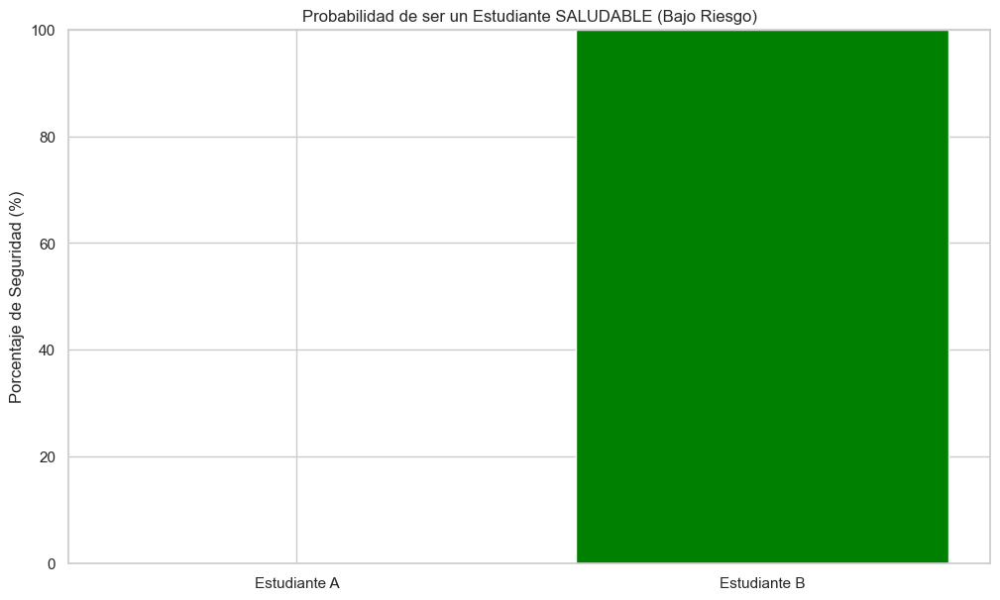

In [213]:
plt.figure(figsize=(12,7))

nombres = ['Estudiante A', 'Estudiante B']

porcentajes_bajo_riesgo = modelo_riesgo_estudiante_no_afecta_riesgo * 100

plt.bar(nombres, porcentajes_bajo_riesgo, color=['salmon', 'green'])

plt.title('Probabilidad de ser un Estudiante SALUDABLE (Bajo Riesgo)')
plt.ylabel('Porcentaje de Seguridad (%)')
plt.ylim(0, 100);

In [214]:
# El objetivo principal es ¿Qué consecuencias tiene esa adicción en la vida real del estudiante (su rendimiento académico)?

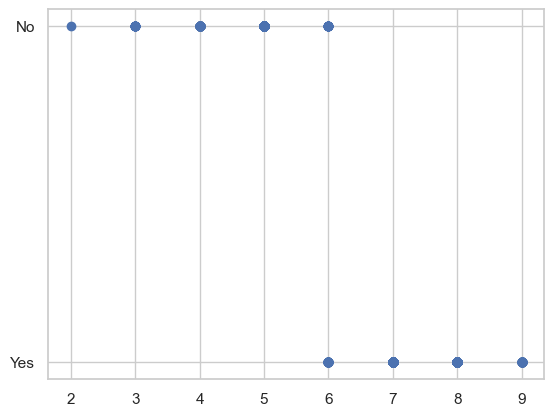

In [215]:
plt.scatter(df['Addicted_Score'],df['Affects_Academic_Performance']);

In [216]:
X = df[['Addicted_Score']]

In [217]:
y = y_afecta_rendimiento

In [218]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.8,random_state=42)

In [219]:
modelo_adiccion_rendimiento = LogisticRegression()

In [220]:
modelo_adiccion_rendimiento.fit(X_entrena,y_entrena)

LogisticRegression()

In [221]:
modelo_adiccion_rendimiento.score(X_prueba,y_prueba)

0.9929078014184397

In [222]:
modelo_adiccion_rendimiento.score(X_entrena,y_entrena)

0.973404255319149

In [223]:
test_academico = pd.DataFrame({'Addicted_Score': [2, 5, 7,9]})

In [224]:
test_academico_adiccion = modelo_adiccion_rendimiento.predict_proba(test_academico)

In [225]:
test_academico_adiccion

array([[9.99999906e-01, 9.39834727e-08],
       [9.70479093e-01, 2.95209067e-02],
       [6.92538181e-03, 9.93074618e-01],
       [1.47933504e-06, 9.99998521e-01]])

In [226]:
probabilidades_si_afecta_riesgo = test_academico_adiccion[:,1]

In [227]:
probabilidades_si_afecta_riesgo

array([9.39834727e-08, 2.95209067e-02, 9.93074618e-01, 9.99998521e-01])

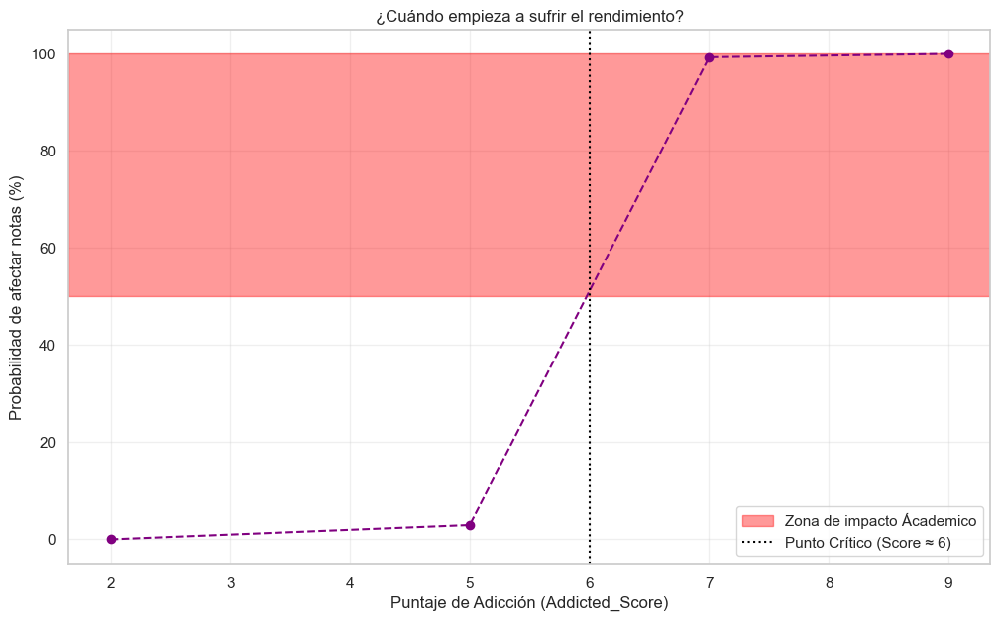

In [228]:
plt.figure(figsize=(12,7))
probabilidades_si = probabilidades_si_afecta_riesgo*100;
puntajes = [2,5,7,9]

plt.plot(puntajes,probabilidades_si,marker='o',linestyle='--',color='purple')
plt.axhspan(50,100,color='red',alpha=0.4,label='Zona de impacto Ácademico')
plt.axvline(x=6,color='black', linestyle=':', label='Punto Crítico (Score ≈ 6)')
plt.title('¿Cuándo empieza a sufrir el rendimiento?')
plt.xlabel('Puntaje de Adicción (Addicted_Score)')
plt.ylabel('Probabilidad de afectar notas (%)')
plt.legend()
plt.grid(True, alpha=0.3)

#### Machine Learning Aprendizaje Supervisado (Arboles de Decisión)

In [229]:
# Objetivo: Determinar, a través de una serie de reglas condicionales y jerárquicas, si el rendimiento académico de un estudiante se verá afectado ('Sí Afecta' o 'No Afecta'), basándose en sus niveles de conflicto en redes sociales y sus hábitos de uso diario.

In [230]:
X = df[['Conflicts_Over_Social_Media','Avg_Daily_Usage_Hours','Mental_Health_Score']]

In [231]:
y = y_afecta_rendimiento

In [232]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.8,random_state=42)

In [233]:
arbol_decision = DecisionTreeClassifier(max_depth=4, random_state=42)

In [234]:
arbol_decision.fit(X_entrena,y_entrena)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [235]:
arbol_decision.score(X_prueba,y_prueba)

1.0

In [236]:
arbol_decision.score(X_entrena,y_entrena)

1.0

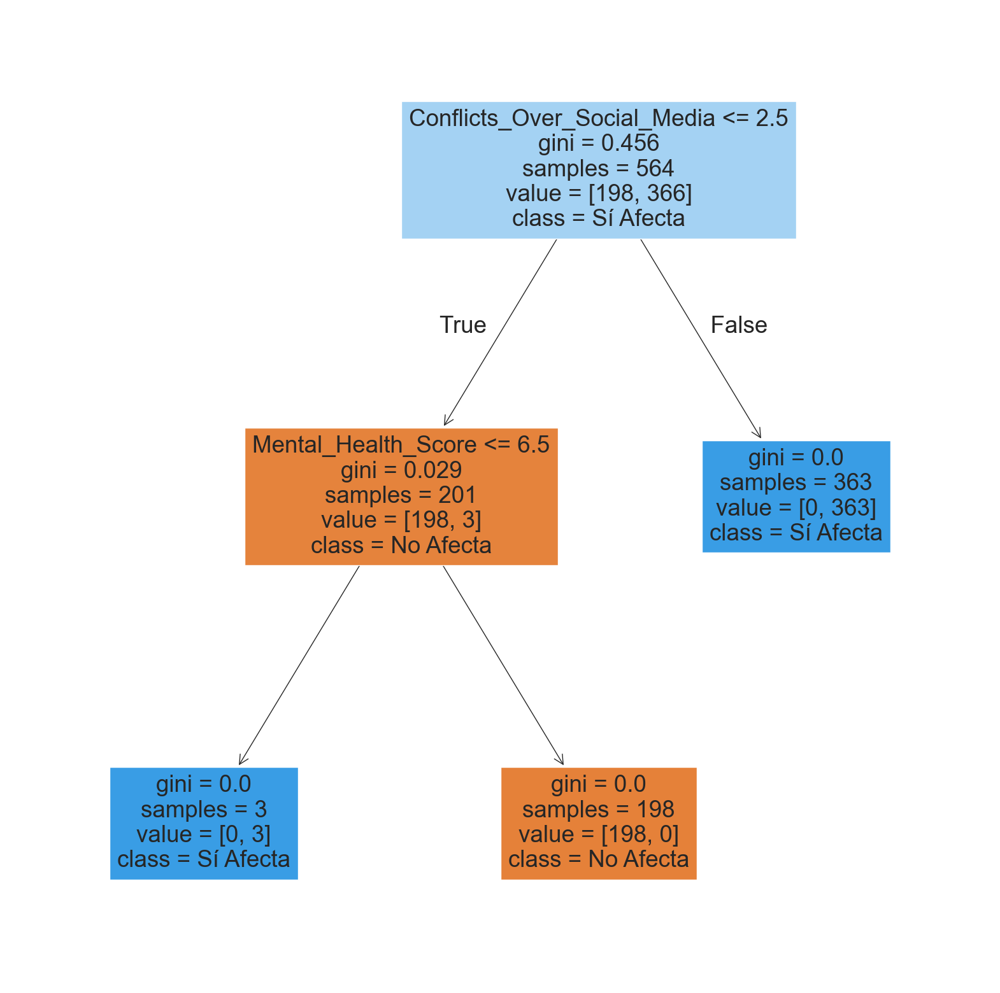

In [237]:
plt.figure(figsize=(20,20))
plot_tree(decision_tree=arbol_decision,filled=True,class_names=['No Afecta', 'Sí Afecta'],
          feature_names=['Conflicts_Over_Social_Media', 'Avg_Daily_Usage_Hours', 'Mental_Health_Score'],
          )
plt.savefig("arbol_decision_grande.png");

In [238]:
from sklearn.model_selection import cross_val_score
import numpy as np

# 1. Precisión en el conjunto de prueba (para comparar con el 1.0 anterior)
precision_ajustada = arbol_decision.score(X_prueba, y_prueba)
print(f"La precisión en el conjunto de prueba (max_depth=4) es: {precision_ajustada:.4f}")

# 2. Validación Cruzada (K=5) para una precisión realista
scores = cross_val_score(
    estimator=arbol_decision, # El modelo con max_depth=4
    X=X,                     # Todo el conjunto de Features
    y=y,                     # Todo el Target
    cv=5                     # 5-Fold Cross-Validation
)

print("\nScores individuales de Validación Cruzada (K=5):", scores)
print(f"Precisión Media (Valor a reportar): {np.mean(scores):.4f}")
print(f"Desviación Estándar (Variabilidad): {np.std(scores):.4f}")

La precisión en el conjunto de prueba (max_depth=4) es: 1.0000

Scores individuales de Validación Cruzada (K=5): [0.9787234 1.        1.        1.        1.       ]
Precisión Media (Valor a reportar): 0.9957
Desviación Estándar (Variabilidad): 0.0085


In [239]:
# Objetivo: Determinar la probabilidad de que un estudiante tenga un Nivel de Adicción X (Adicción o No Adicción) basándose únicamente en el nivel de Conflictos generados por el uso de Redes Sociales

In [240]:
X = df[['Mental_Health_Score', 'Avg_Daily_Usage_Hours']]

In [241]:
X

,Mental_Health_Score,Avg_Daily_Usage_Hours
0,6,5.2
1,8,2.1
2,5,6.0
3,7,3.0
4,6,4.5
...,...,...
700,7,4.7
701,4,6.8
702,6,5.6
703,8,4.3


In [242]:
y_codificado

array([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0,

In [243]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y_codificado,train_size=0.8,random_state=42)

In [244]:
X_entrena

,Mental_Health_Score,Avg_Daily_Usage_Hours
24,7,3.2
155,5,4.2
210,6,6.3
260,4,6.6
424,8,2.9
...,...,...
71,7,3.2
106,7,3.8
270,7,4.5
435,6,4.4


In [245]:
X_prueba

,Mental_Health_Score,Avg_Daily_Usage_Hours
478,7,3.0
81,6,4.8
77,7,2.9
208,5,4.2
319,8,3.1
...,...,...
108,8,2.6
257,5,5.3
56,5,5.6
686,8,4.2


In [246]:
arbol = DecisionTreeClassifier(max_depth=6)

In [247]:
arbol.fit(X_entrena,y_entrena)

DecisionTreeClassifier(max_depth=6)

In [248]:
score_prueba = arbol.score(X_prueba, y_prueba)

In [249]:
print(f"Precisión del Árbol de Decisión en datos de prueba: {score_prueba:.4f}")

Precisión del Árbol de Decisión en datos de prueba: 0.9716


In [250]:
score_entrenamiento = arbol.score(X_entrena,y_entrena)

In [251]:
print(f"Precisión del Árbol de Decisión en datos de entrenamiento: {score_entrenamiento:.4f}")

Precisión del Árbol de Decisión en datos de entrenamiento: 0.9840


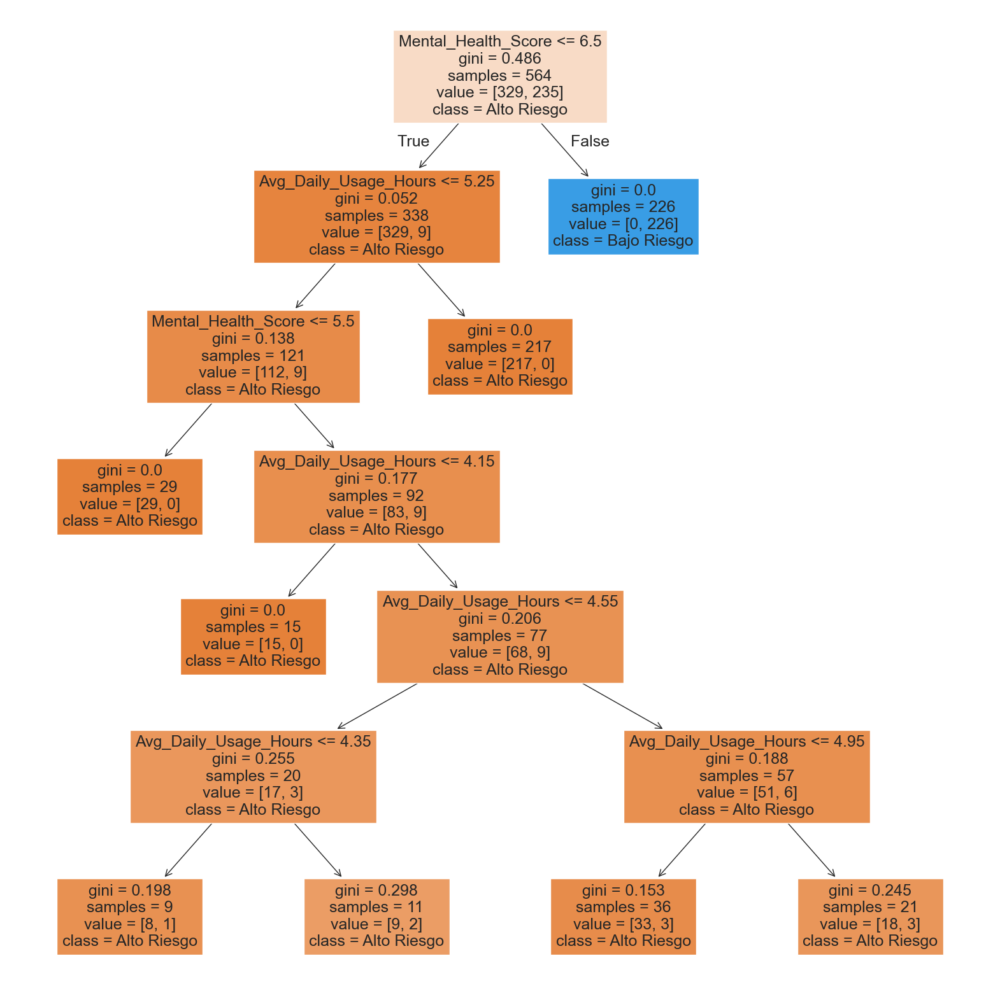

In [252]:
plt.figure(figsize=(20,20))
plot_tree(decision_tree=arbol,filled=True,class_names=['Alto Riesgo', 'Bajo Riesgo'],feature_names=['Mental_Health_Score', 'Avg_Daily_Usage_Hours']);
plt.savefig("arbol_decision.png")

In [253]:
# 💡 Regla de Interpretación Dominante (Tu Ejemplo)

# La lectura del árbol nos proporciona la regla más importante de tus datos:

# Regla de Negocio (Camino) | Significado |
# Mental_Health_Score > 6.5 | Si la Puntuación de Salud Mental es mayor a 6.5, el modelo predice directamente BAJO RIESGO(Clase Mayoritaria del nodo puro azul). |
# lto Riesgo Principal | El factor más importante para Alto Riesgo es tener Mental_Health_Score  6.5, y el segundo factor de riesgo es que el Uso Diario exceda las 5.25 horas.

In [254]:
# Objetivo : Determinar, a través de una serie de si el rendimiento académico de un estudiante se verá afectado ('Sí Afecta' o 'No Afecta'), sus hábitos de uso diario, como el uso promedio de las redes sociales.

In [255]:
X = df[["Avg_Daily_Usage_Hours"]]

In [256]:
y = y_codificado

In [257]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.8,random_state=42)

In [258]:
arbol = DecisionTreeClassifier()

In [259]:
arbol.fit(X_entrena,y_entrena)

DecisionTreeClassifier()

In [260]:
desempeño_arbol = arbol.score(X_prueba, y_prueba) 
print(f"Accuracy del Árbol de Decisión: {desempeño_arbol:.4f}")

Accuracy del Árbol de Decisión: 0.8227


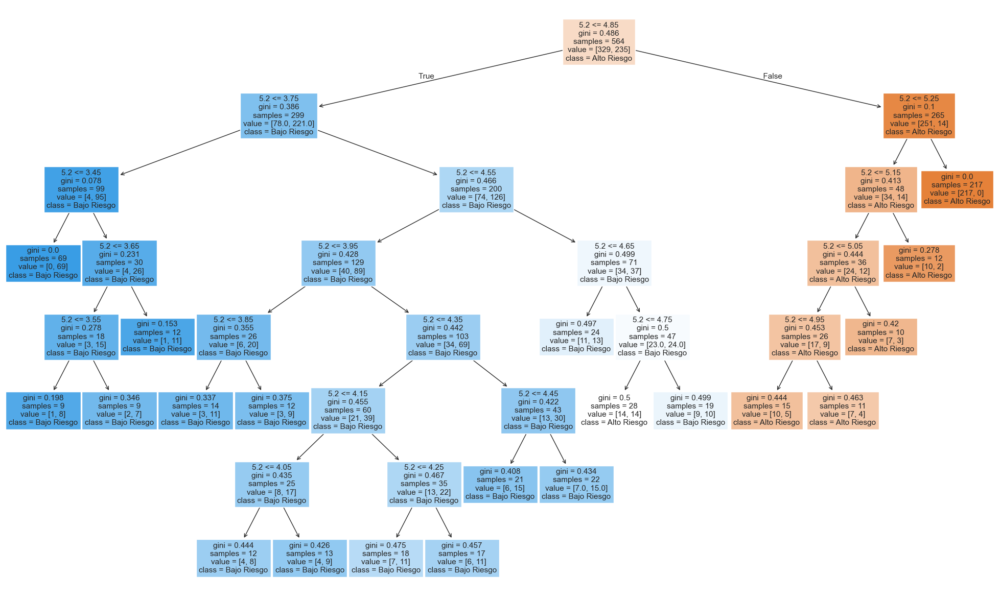

In [261]:
plt.figure(figsize=(25,15))
plot_tree(decision_tree=arbol,filled=True,class_names=['Alto Riesgo', 'Bajo Riesgo'],feature_names=df['Avg_Daily_Usage_Hours'],fontsize=11)
plt.savefig("arbol_decision_2.png");

In [262]:
X = df[['Addicted_Score', 'Mental_Health_Score', 'Sleep_Hours_Per_Night']]

In [263]:
y = y_afecta_rendimiento

In [264]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.8,random_state=42)

In [265]:
modelo_arbol_estudiante = DecisionTreeClassifier(max_depth=3,random_state=42)

In [266]:
modelo_arbol_estudiante.fit(X_entrena,y_entrena)

DecisionTreeClassifier(max_depth=3, random_state=42)

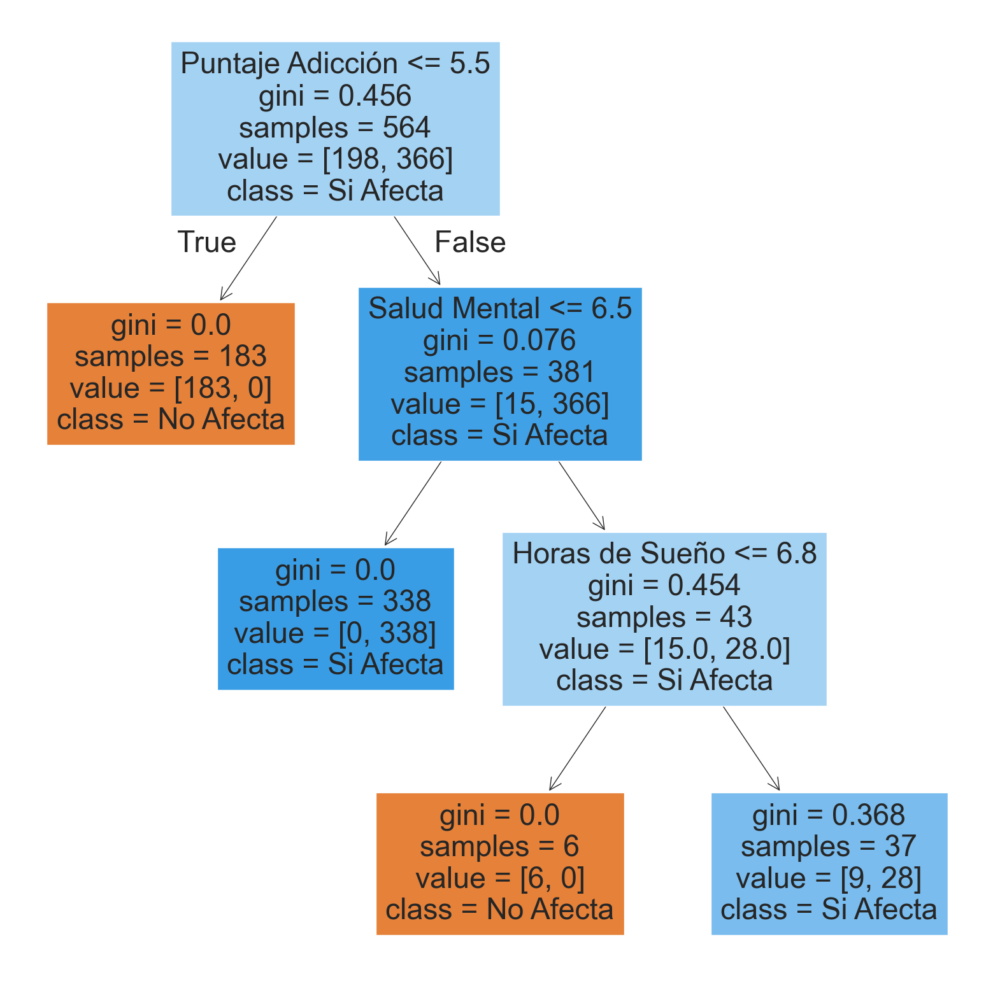

In [267]:
plt.figure(figsize=(20,20))
plot_tree(decision_tree=modelo_arbol_estudiante,filled=True,feature_names=['Puntaje Adicción','Salud Mental','Horas de Sueño'],
          class_names=['No Afecta','Si Afecta']);

In [268]:
estudiante_c = pd.DataFrame([[8,4,5]], columns= ['Addicted_Score','Mental_Health_Score','Sleep_Hours_Per_Night'])

In [269]:
prediccion_arbol = modelo_arbol_estudiante.predict(estudiante_c)
probabilidad_arbol =modelo_arbol_estudiante.predict_proba(estudiante_c)

In [270]:
resultado = "Si afecta" if prediccion_arbol[0] == 1 else "No Afecta"

print(f'Resultado para Estudiante C: {resultado}')
print(f'Certeza del modelo:{probabilidad_arbol.max() * 100}%')

Resultado para Estudiante C: Si afecta
Certeza del modelo:100.0%


#### Machine Learning Aprendizaje Supervisado (Bosques Aleatorios)

In [271]:
# Objetivo: Construir un modelo predictivo capaz de identificar las combinaciones específicas de Conflictos, Horas de Uso de Redes Sociales y Puntaje de Salud Mental que son los principales predictores de un bajo o afectado rendimiento académico en los estudiantes.

In [272]:
X = df[['Conflicts_Over_Social_Media', 'Avg_Daily_Usage_Hours', 'Mental_Health_Score']]

In [273]:
y = y_afecta_rendimiento

In [274]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.7,random_state=42)

In [275]:
forest_conflicto = RandomForestClassifier()

In [276]:
forest_conflicto.fit(X_entrena,y_entrena)

RandomForestClassifier()

In [277]:
forest_conflicto.score(X_prueba,y_prueba)

1.0

In [278]:
caracteristicas_de_los_Nuevos_Estudiantes = pd.DataFrame({
    'Conflicts_Over_Social_Media': [4.5, 1.0],  
    'Avg_Daily_Usage_Hours': [2.0, 8.0],       
    'Mental_Health_Score': [4.5, 8.5]          
})

In [279]:
clase_predicha_estudiante = forest_conflicto.predict(caracteristicas_de_los_Nuevos_Estudiantes)

In [280]:
clase_predicha_estudiante

array([1, 0])

In [281]:
probabildidad_clase_predicha = forest_conflicto.predict_proba(caracteristicas_de_los_Nuevos_Estudiantes)

In [282]:
probabildidad_clase_predicha

array([[0.01, 0.99],
       [0.82, 0.18]])

In [283]:
print('Clase predicha : ', clase_predicha_estudiante)
print('Probablidades de Afectar Rendimiento:',probabildidad_clase_predicha[0][1])
print('Probablidades de No Afectar Rendimiento:',probabildidad_clase_predicha[1][0])

Clase predicha :  [1 0]
Probablidades de Afectar Rendimiento: 0.99
Probablidades de No Afectar Rendimiento: 0.82


In [284]:
# Objetivo: Construir un modelo de clasificación que determine, a partir de la Puntuación de Salud Mental y las Horas de Uso de Redes Sociales, el Nivel de Riesgo (Bajo, Medio, Alto) al que pertenece un estudiante.

In [285]:
X = df[['Mental_Health_Score', 'Avg_Daily_Usage_Hours']]

In [286]:
y = y_codificado

In [287]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.7,random_state=42)

In [288]:
forest = RandomForestClassifier()

In [289]:
forest.fit(X_entrena,y_entrena)

RandomForestClassifier()

In [290]:
forest.score(X_prueba,y_prueba)

0.9811320754716981

In [291]:
# Obtener la importancia de las features
nombres_features = X_prueba.columns
importancias = forest.feature_importances_


# Crear un DataFrame para visualizar
importancia_df = pd.DataFrame({'Feature': nombres_features, 'Importancia': importancias})
importancia_df = importancia_df.sort_values(by='Importancia', ascending=False)

print(importancia_df)

                 Feature  Importancia
0    Mental_Health_Score     0.708249
1  Avg_Daily_Usage_Hours     0.291751


In [292]:
# 🔑 Apuntes: Explicación de `feature_importances_`

# 1. ¿Qué es feature_importances_?

# La propiedad **`forest.feature_importances_`** es un atributo clave en los modelos de Scikit-learn basados en árboles (Bosques Aleatorios, Árboles de Decisión, etc.). Su función es cuantificar la relevancia de cada variable de entrada en la decisión final del modelo.

## 2. Cálculo y Significado

# Cálculo:** El Bosque Aleatorio calcula la importancia de una *feature* midiendo **cuánto se reduce la Impureza de Gini** (o la entropía) en promedio cuando esa *feature* se utiliza para dividir un nodo en **todos y cada uno de los árboles** del bosque.
# Resultado:** El valor es una puntuación entre **0 y 1**.
# Suma Total:** La suma de las importancias de todas las *features* utilizadas siempre es **1.0** (o 100%).
# Conclusión:** Un valor alto indica que la variable fue consistentemente la más útil y potente para clasificar en el modelo.

In [293]:
nuevo_estudiante_1 = pd.DataFrame({
    'Mental_Health_Score': [6.5],
    'Avg_Daily_Usage_Hours': [9.0]
})

In [294]:
nuevo_estudiante_1

,Mental_Health_Score,Avg_Daily_Usage_Hours
0,6.5,9.0


In [295]:
nuevo_estudiante_2 = pd.DataFrame({
    'Mental_Health_Score': [8.0],
    'Avg_Daily_Usage_Hours': [3.0]
})

In [296]:
nuevo_estudiante_2

,Mental_Health_Score,Avg_Daily_Usage_Hours
0,8.0,3.0


In [297]:
clase_predicha = forest.predict(nuevo_estudiante_1)
clase_predicha

array([0])

In [298]:
clase_predicha_2 = forest.predict(nuevo_estudiante_2)
clase_predicha_2

array([1])

In [299]:
probabilidad = forest.predict_proba(nuevo_estudiante_1)
probabilidad

array([[1., 0.]])

In [300]:
probabilidad_2 = forest.predict_proba(nuevo_estudiante_2)
probabilidad_2

array([[0., 1.]])

In [301]:
print(f"Predicción (Clase): {clase_predicha}")
print(f"Probabilidades: {probabilidad}")

Predicción (Clase): [0]
Probabilidades: [[1. 0.]]


In [302]:
print(f"Predicción (Clase): {clase_predicha_2}")
print(f"Probabilidades: {probabilidad_2}")

Predicción (Clase): [1]
Probabilidades: [[0. 1.]]


In [303]:
print("Clase predicha: ",clase_predicha[0])
print("Probabilidades de Alto Riesgo: ",probabilidad[0][0])
print("Probabilidades de Bajo Riesgo: ",probabilidad[0][1])

Clase predicha:  0
Probabilidades de Alto Riesgo:  1.0
Probabilidades de Bajo Riesgo:  0.0


In [304]:
print("Clase predicha: ",clase_predicha_2[0])
print("Probabilidades de Alto Riesgo: ",probabilidad_2[0][0])
print("Probabilidades de Bajo Riesgo: ",probabilidad_2[0][1])

Clase predicha:  1
Probabilidades de Alto Riesgo:  0.0
Probabilidades de Bajo Riesgo:  1.0


In [305]:
modelos = [
    ("Regresion Logistica",LogisticRegression()),
    ("Arboles de Decision",DecisionTreeClassifier()),
    ("Bosques Aleatorio",RandomForestClassifier())
]

In [306]:
for nombre,modelo in modelos:
    modelo.fit(X_entrena,y_entrena)
    puntaje = modelo.score(X_prueba,y_prueba)
    print(f'{nombre}: {puntaje:.4f}')

Regresion Logistica: 0.9811
Arboles de Decision: 0.9811
Bosques Aleatorio: 0.9811


In [307]:
X = df[['Avg_Daily_Usage_Hours']]

In [308]:
y = y_codificado

In [309]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.7,random_state=42)

In [310]:
bosque_aleatorio = RandomForestClassifier()

In [311]:
bosque_aleatorio.fit(X_entrena,y_entrena)

RandomForestClassifier()

In [312]:
bosque_aleatorio.score(X_prueba,y_prueba)

0.8349056603773585

In [313]:
estudiante_1 = pd.DataFrame({
    'Avg_Daily_Usage_Hours': [6.0]
})

In [314]:
estudiante_2 = pd.DataFrame({
    'Avg_Daily_Usage_Hours': [4.0]
})

In [315]:
estudiante_predicho = bosque_aleatorio.predict(estudiante_1)

In [316]:
estudiante_predicho

array([0])

In [317]:
estudiante_predicho_2 = bosque_aleatorio.predict(estudiante_2)

In [318]:
estudiante_predicho_2

array([1])

In [319]:
probabilidades_estudiante = bosque_aleatorio.predict_proba(estudiante_1)

In [320]:
probabilidades_estudiante

array([[1., 0.]])

In [321]:
probabilidades_estudiante_2 = bosque_aleatorio.predict_proba(estudiante_2)

In [322]:
probabilidades_estudiante_2

array([[0.36519454, 0.63480546]])

In [323]:
CLASES = {0: "Alto Riesgo", 1: "Bajo Riesgo"}

In [324]:
print(f"Predicción (Etiqueta numérica): {estudiante_predicho[0]}")
print(f"Predicción de Riesgo: {CLASES[estudiante_predicho[0]]}")
print(f"Probabilidad de ALTO RIESGO (Clase 0): {probabilidades_estudiante[0][0]:.2f}")
print(f"Probabilidad de BAJO RIESGO (Clase 1): {probabilidades_estudiante[0][1]:.2f}")

Predicción (Etiqueta numérica): 0
Predicción de Riesgo: Alto Riesgo
Probabilidad de ALTO RIESGO (Clase 0): 1.00
Probabilidad de BAJO RIESGO (Clase 1): 0.00


In [325]:
print(f"Predicción (Etiqueta numérica): {estudiante_predicho_2[0]}")
print(f"Predicción de Riesgo: {CLASES[estudiante_predicho_2[0]]}")
print(f"Probabilidad de ALTO RIESGO (Clase 0): {probabilidades_estudiante_2[0][0]:.2f}")
print(f"Probabilidad de BAJO RIESGO (Clase 1): {probabilidades_estudiante_2[0][1]:.2f}")

Predicción (Etiqueta numérica): 1
Predicción de Riesgo: Bajo Riesgo
Probabilidad de ALTO RIESGO (Clase 0): 0.37
Probabilidad de BAJO RIESGO (Clase 1): 0.63


In [326]:
X = df[['Addicted_Score', 'Mental_Health_Score', 'Sleep_Hours_Per_Night']]

In [327]:
y = y_afecta_rendimiento

In [328]:
X_entrena,X_prueba,y_entrena,y_prueba = train_test_split(X,y,train_size=0.7,random_state=42)

In [329]:
forest_rendimiento = RandomForestClassifier()

In [330]:
forest_rendimiento.fit(X_entrena,y_entrena)

RandomForestClassifier()

In [331]:
forest_rendimiento.score(X_prueba,y_prueba)

0.9858490566037735

In [332]:
estudiantes_nuevos_ingresados = pd.DataFrame({
    'Addicted_Score': [2,4,7,8],
    'Mental_Health_Score':[9,7,4,3],
    'Sleep_Hours_Per_Night':[8.5,6.5,4,3.2]
})

In [333]:
estudiantes_nuevos_ingresados

,Addicted_Score,Mental_Health_Score,Sleep_Hours_Per_Night
0,2,9,8.5
1,4,7,6.5
2,7,4,4.0
3,8,3,3.2


In [334]:
clase_rendimiento_predicho = forest_rendimiento.predict(estudiantes_nuevos_ingresados)

In [335]:
clase_rendimiento_predicho

array([0, 0, 1, 1])

In [336]:
clase_rendimiento_predicho_probabilidad = forest_rendimiento.predict_proba(estudiantes_nuevos_ingresados)

In [337]:
clase_rendimiento_predicho_probabilidad

array([[1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.]])

In [338]:
print(f'Clase Predicha: ',clase_rendimiento_predicho)

Clase Predicha:  [0 0 1 1]


In [339]:
print(f'Probabilidades de NO afectar rendimiento: ',clase_rendimiento_predicho_probabilidad[0][0])
print(f'Probabilidades de Si afectar rendimiento: ',clase_rendimiento_predicho_probabilidad[2][0])

Probabilidades de NO afectar rendimiento:  1.0
Probabilidades de Si afectar rendimiento:  0.0


In [340]:
for i, proba in enumerate(clase_rendimiento_predicho_probabilidad):
    print(f"Estudiante {i+1}: No Afecta: {proba[0]*100}% | Si Afecta: {proba[1]*100}%")

Estudiante 1: No Afecta: 100.0% | Si Afecta: 0.0%
Estudiante 2: No Afecta: 100.0% | Si Afecta: 0.0%
Estudiante 3: No Afecta: 0.0% | Si Afecta: 100.0%
Estudiante 4: No Afecta: 0.0% | Si Afecta: 100.0%


#### Machine Learning Aprendizaje No Supervisado  (K-Means Clustering)

Pregunta:
**¿Existen grupos o tipos de estudiantes (clústeres) que se forman naturalmente en función de su Puntuación de Adicción y sus Horas de Uso Diario?**

In [341]:
X_adiccion = df[['Addicted_Score', 'Avg_Daily_Usage_Hours']]

In [342]:
X_adiccion

,Addicted_Score,Avg_Daily_Usage_Hours
0,8,5.2
1,3,2.1
2,9,6.0
3,4,3.0
4,7,4.5
...,...,...
700,5,4.7
701,9,6.8
702,7,5.6
703,4,4.3


In [343]:
kmeans = KMeans(n_clusters=3, random_state=42)

In [344]:
kmeans.fit(X_adiccion)

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=3, random_state=42)

In [345]:
centroides = kmeans.cluster_centers_

In [346]:
centroides

array([[4.54320988, 3.75390947],
       [8.23076923, 6.51538462],
       [6.91428571, 4.89178571]])

In [347]:
etiquetas = kmeans.labels_

In [348]:
etiquetas

array([2, 0, 1, 0, 2, 1, 0, 1, 0, 0, 2, 1, 0, 1, 0, 2, 0, 2, 0, 2, 2, 0,
       2, 1, 0, 1, 0, 2, 0, 1, 0, 2, 1, 0, 2, 1, 0, 1, 2, 2, 0, 1, 0, 2,
       1, 0, 2, 1, 0, 1, 2, 2, 0, 1, 0, 2, 1, 0, 2, 1, 0, 1, 2, 1, 0, 2,
       2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 2, 0, 1, 2, 2, 0,
       2, 1, 0, 2, 0, 1, 0, 2, 1, 0, 2, 1, 1, 0, 2, 1, 0, 2, 2, 1, 0, 2,
       1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2,
       2, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2,
       0, 2, 2, 0, 2, 2, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 2, 2, 2, 1, 2,
       0, 2, 2, 2, 1, 2, 0, 2, 2, 2, 1, 2, 0, 2, 2, 2, 1, 2, 0, 2, 2, 2,
       1, 2, 0, 2, 2, 2, 1, 2, 0, 2, 2, 2, 1, 2, 0, 2, 2, 2, 1, 2, 0, 2,
       1, 2, 0, 0, 0, 2, 2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 2,
       2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 2, 2, 0, 1, 2, 0, 0,
       0, 2, 2, 0, 1, 2, 0, 0, 0, 2, 2, 0, 1, 2, 0, 0, 0, 2, 2, 0, 1, 2,
       0, 0, 0, 2, 2, 0, 1, 2, 0, 0, 0, 2, 2, 0, 1,

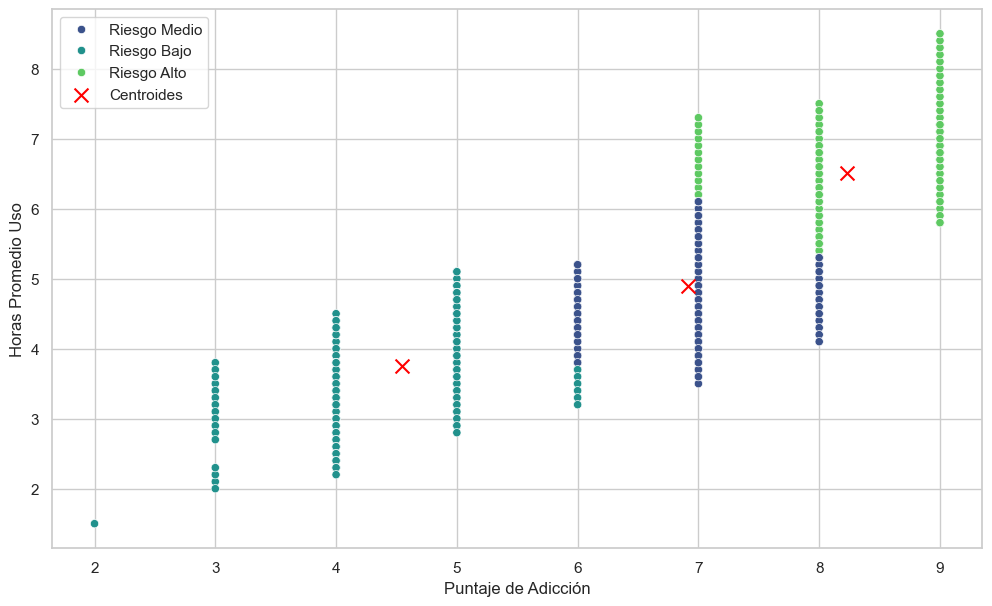

In [349]:
mapeo_riesgo = {
    0: 'Riesgo Bajo',
    1: 'Riesgo Alto',
    2: 'Riesgo Medio' 
}

df_visual = X_adiccion.copy()
df_visual['Cluster'] = etiquetas
df_visual['Nivel_Riesgo'] = df_visual['Cluster'].map(mapeo_riesgo)

plt.figure(figsize=(12,7))
sns.scatterplot(data=df_visual,x='Addicted_Score',y='Avg_Daily_Usage_Hours',hue="Nivel_Riesgo",palette='viridis',legend='auto')
plt.scatter(centroides[:,0],centroides[:,1], c='red',s=100,marker='x',label='Centroides')
plt.legend()
plt.xlabel("Puntaje de Adicción")
plt.ylabel("Horas Promedio Uso");

In [350]:
df_visual.groupby('Nivel_Riesgo').mean()

,Addicted_Score,Avg_Daily_Usage_Hours,Cluster
Nivel_Riesgo,,,
Riesgo Alto,8.230769,6.515385,1.0
Riesgo Bajo,4.543210,3.753909,0.0
Riesgo Medio,6.914286,4.891786,2.0


In [351]:
df_visual['Cluster']

0      2
1      0
2      1
3      0
4      2
      ..
700    0
701    1
702    2
703    0
704    1
Name: Cluster, Length: 705, dtype: int32

| # | Fase | Código Clave | Interpretación en Tu Proyecto |
| :---: | :--- | :--- | :--- |
| **1** | **Features** | `X = df[['Score', 'Hours']]` | Definición de las 2 variables (X, Y) para el clustering no supervisado. |
| **2** | **Definición K** | `KMeans(n_clusters=3, random_state=42)` | Se establece K=3 para encontrar 3 grupos de riesgo (Bajo, Medio, Alto). |
| **3** | **Entrenamiento** | `kmeans.fit(X_adiccion)` | El algoritmo itera hasta que los centros convergen a su posición óptima. |
| **4** | **Centroides** | `kmeans.cluster_centers_` | La posición final de los 3 centros (las "X" rojas en el gráfico), basados en la media de cada grupo. |
| **5** | **Asignación** | `kmeans.labels_` | El grupo (etiqueta 0, 1 o 2) asignado a cada uno de los estudiantes. |
| **6** | **Visualización** | `sns.scatterplot(data=df_visual, ...)` | Confirmación Visual: Los 3 clústeres (puntos de colores) están claramente separados. |
| **7** | **Justificación** | `kmeans.inertia_` | Métrica WCSS (Inercia) fundamental para el Método del Codo para validar K=3. |

In [352]:
etiquetas_ejemplo = y_codificado

print("Revisión de clasificación de riesgo")

for etiqueta in etiquetas_ejemplo:
    if etiqueta == 0:
        riesgo = "Bajo Riesgo (Monitoreo mínimo)"
    elif etiqueta == 1:
        riesgo = "ALTO RIESGO (Intervención Urgente)"
        

    print(f'Estudiante asignado {etiqueta} -> {riesgo}')

Revisión de clasificación de riesgo
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 1 -> ALTO RIESGO (Intervención Urgente)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 1 -> ALTO RIESGO (Intervención Urgente)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 1 -> ALTO RIESGO (Intervención Urgente)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 1 -> ALTO RIESGO (Intervención Urgente)
Estudiante asignado 1 -> ALTO RIESGO (Intervención Urgente)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 1 -> ALTO RIESGO (Intervención Urgente)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 1 -> ALTO RIESGO (Intervención Urgente)
Estudiante asignado 0 -> Bajo Riesgo (Monitoreo mínimo)
Estudiante asignado 1 -> ALTO RIESGO (In

**Objetivo**:¿Existen grupos o perfiles de estudiantes con características similares (en términos de conflicto, uso de redes y salud mental) que emergen de forma natural en el dataset, sin que nosotros les hayamos dicho previamente a qué grupo pertenecen?

In [353]:
X = df[["Conflicts_Over_Social_Media","Mental_Health_Score"]] 

In [354]:
kmeans_estudiante = KMeans(n_clusters=3,random_state=42)

In [355]:
kmeans_estudiante.fit(X)

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=3, random_state=42)

In [356]:
centroides_estudiante = kmeans_estudiante.cluster_centers_

In [357]:
centroides_estudiante

array([[1.51754386, 7.93859649],
       [2.61684783, 6.46195652],
       [3.91479821, 4.96412556]])

In [358]:
etiquetas_estudiante = kmeans_estudiante.labels_

In [359]:
etiquetas_estudiante

array([1, 0, 2, 0, 1, 2, 0, 1, 0, 0, 2, 1, 0, 2, 1, 1, 0, 2, 0, 1, 2, 0,
       1, 2, 1, 2, 0, 1, 0, 2, 0, 1, 2, 0, 1, 2, 0, 2, 1, 1, 0, 2, 1, 1,
       2, 0, 1, 2, 1, 2, 1, 1, 0, 2, 1, 1, 2, 0, 1, 2, 0, 2, 1, 2, 0, 1,
       1, 2, 0, 1, 2, 1, 1, 2, 0, 1, 2, 1, 1, 2, 0, 1, 1, 0, 2, 1, 2, 0,
       1, 2, 1, 1, 1, 2, 0, 1, 2, 0, 1, 2, 2, 0, 1, 2, 1, 1, 1, 2, 0, 1,
       2, 1, 1, 2, 1, 0, 2, 1, 1, 2, 1, 0, 2, 1, 1, 2, 1, 0, 2, 1, 1, 2,
       1, 0, 2, 1, 1, 2, 1, 0, 2, 1, 1, 2, 1, 0, 2, 1, 1, 2, 1, 0, 2, 1,
       1, 2, 1, 0, 2, 1, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2,
       1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1,
       2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2,
       2, 1, 0, 1, 0, 1, 1, 1, 2, 1, 1, 0, 0, 2, 1, 1, 2, 1, 1, 0, 0, 2,
       1, 1, 2, 1, 1, 0, 0, 2, 1, 1, 2, 1, 1, 0, 0, 2, 1, 1, 2, 1, 1, 0,
       0, 2, 1, 1, 2, 1, 1, 0, 0, 2, 1, 1, 2, 1, 1, 0, 0, 2, 1, 1, 2, 1,
       1, 0, 0, 2, 1, 1, 2, 1, 1, 0, 0, 2, 1, 1, 2,

In [360]:
Nivel_Riesgo = {
    0: 'Riesgo Bajo',
    1: 'Riesgo Alto',
    2: 'Riesgo Medio' 
}

df_visual_estudiante = X.copy()
df_visual_estudiante['Cluster'] = etiquetas_estudiante
df_visual_estudiante['Nivel_Riesgo'] = df_visual_estudiante['Cluster'].map(Nivel_Riesgo)

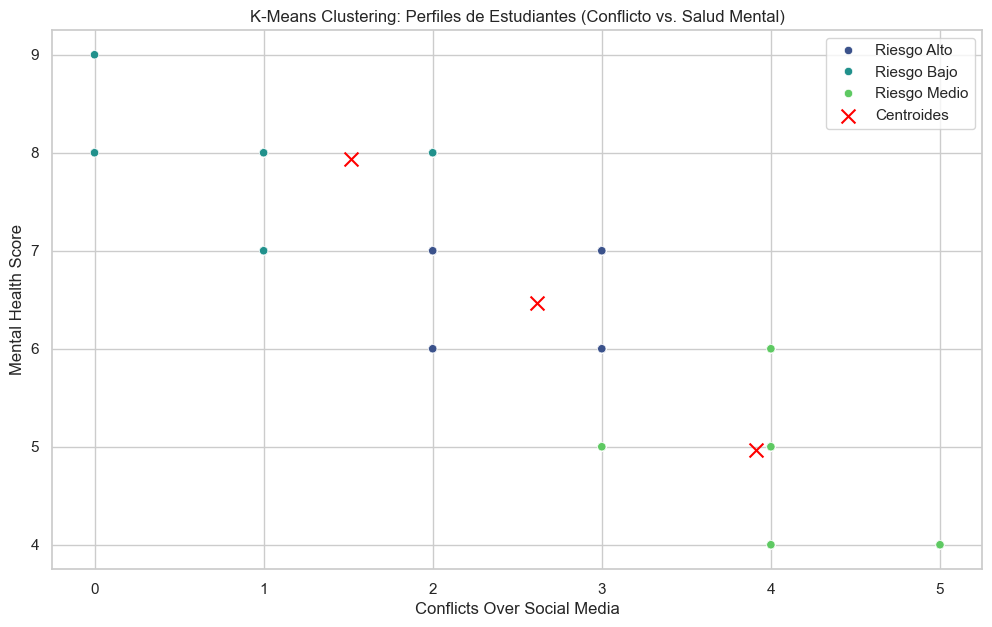

In [361]:
plt.figure(figsize=(12,7))
sns.scatterplot(data=df_visual_estudiante,x='Conflicts_Over_Social_Media',y='Mental_Health_Score',hue='Nivel_Riesgo',palette='viridis')
plt.scatter(centroides_estudiante[:, 0],centroides_estudiante[:, 1], c='red',s=100,marker='x',label='Centroides')
plt.title("K-Means Clustering: Perfiles de Estudiantes (Conflicto vs. Salud Mental)")
plt.legend()
plt.xlabel("Conflicts Over Social Media")
plt.ylabel("Mental Health Score");

**Objetivo:** Aplicar un algoritmo de Aprendizaje No Supervisado (K-Means) para identificar y segmentar automáticamente distintos perfiles de riesgo en la población estudiantil. El propósito es descubrir patrones ocultos entre la adicción tecnológica y la salud mental para facilitar intervenciones preventivas personalizadas, sin depender de etiquetas previas en los datos.

In [362]:
X = df[["Addicted_Score","Mental_Health_Score"]]

In [363]:
K_estudiantes = KMeans(n_clusters=3,random_state=42)

In [364]:
K_estudiantes.fit(X)

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=3, random_state=42)

In [365]:
centroides_estudiantes = K_estudiantes.cluster_centers_

In [366]:
centroides_estudiantes

array([[3.91743119, 7.98165138],
       [8.12389381, 4.97787611],
       [6.14864865, 6.47297297]])

In [367]:
etiquetas_estudiantes = K_estudiantes.labels_

In [368]:
etiquetas_estudiantes

array([1, 0, 1, 0, 2, 1, 0, 1, 2, 0, 1, 1, 0, 1, 2, 2, 0, 1, 2, 2, 1, 0,
       2, 1, 2, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 1, 2, 1, 2, 2, 0, 1, 2, 2,
       1, 0, 2, 1, 2, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 1, 2, 1, 2, 1, 0, 2,
       2, 1, 0, 2, 1, 2, 2, 1, 0, 2, 1, 2, 2, 1, 0, 2, 2, 0, 1, 2, 1, 0,
       2, 1, 2, 2, 2, 1, 0, 2, 1, 0, 2, 1, 1, 0, 2, 1, 2, 2, 2, 1, 0, 2,
       1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1,
       2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2,
       2, 1, 2, 0, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1,
       2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2,
       1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1,
       1, 2, 0, 0, 0, 2, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1,
       2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0,
       0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2,
       2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1,

In [369]:
Nivel_Riesgo = {
    0: 'Riesgo Bajo',
    1: 'Riesgo Alto',
    2: 'Riesgo Medio' 
}


df_visual_estudiantes = X.copy()

df_visual_estudiantes['Cluster'] = etiquetas_estudiantes

df_visual_estudiantes['Nivel_Riesgo'] = df_visual_estudiantes['Cluster'].map(Nivel_Riesgo)

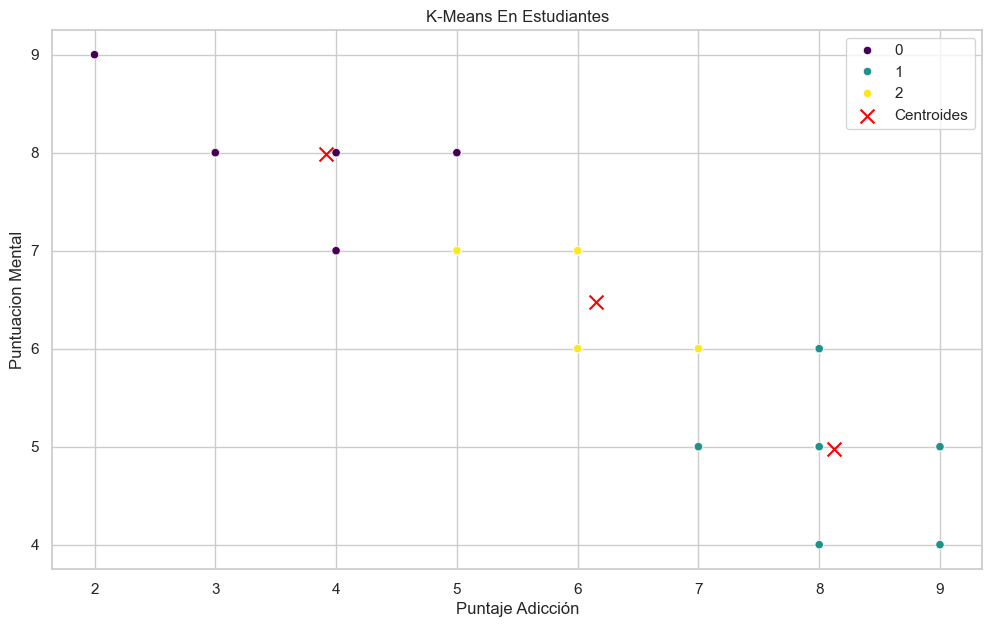

In [370]:
plt.figure(figsize=(12,7))
sns.scatterplot(data=df_visual_estudiantes,x="Addicted_Score",y="Mental_Health_Score",hue=etiquetas_estudiantes, palette='viridis')
plt.scatter(centroides_estudiantes[:,0],centroides_estudiantes[:,1],c='red',s=100,marker='x',label='Centroides')
plt.title('K-Means En Estudiantes')
plt.legend()
plt.xlabel('Puntaje Adicción')
plt.ylabel('Puntuacion Mental');

In [371]:
df_visual_estudiantes

,Addicted_Score,Mental_Health_Score,Cluster,Nivel_Riesgo
0,8,6,1,Riesgo Alto
1,3,8,0,Riesgo Bajo
2,9,5,1,Riesgo Alto
3,4,7,0,Riesgo Bajo
4,7,6,2,Riesgo Medio
...,...,...,...,...
700,5,7,2,Riesgo Medio
701,9,4,1,Riesgo Alto
702,7,6,2,Riesgo Medio
703,4,8,0,Riesgo Bajo


In [372]:
nivel_adiccion = df_visual_estudiantes.groupby(['Cluster','Nivel_Riesgo'])['Nivel_Riesgo'].count()
nivel_adiccion

Cluster  Nivel_Riesgo
0        Riesgo Bajo     109
1        Riesgo Alto     226
2        Riesgo Medio    370
Name: Nivel_Riesgo, dtype: int64

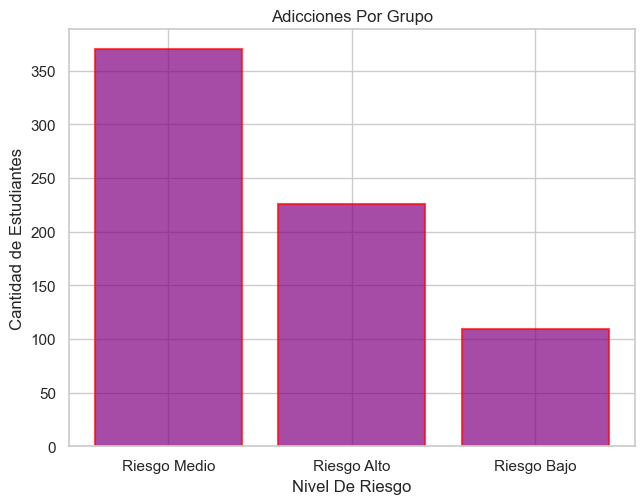

In [373]:
frecuencia_adiccion = df_visual_estudiantes['Nivel_Riesgo'].value_counts()
plt.bar(frecuencia_adiccion.index,frecuencia_adiccion.values,edgecolor="red",color="purple",linewidth=1.5,alpha=0.7)
plt.tight_layout()
plt.title("Adicciones Por Grupo")
plt.xlabel('Nivel De Riesgo')
plt.ylabel('Cantidad de Estudiantes');

In [374]:
df

,Student_ID,Age,Gender,Academic_Level,Country,Avg_Daily_Usage_Hours,Most_Used_Platform,Affects_Academic_Performance,Sleep_Hours_Per_Night,Mental_Health_Score,Relationship_Status,Conflicts_Over_Social_Media,Addicted_Score,Addicted_Risk
0,1,19,Female,Undergraduate,Bangladesh,5.2,Instagram,Yes,6.5,6,In Relationship,3,8,Alto Riesgo
1,2,22,Male,Graduate,India,2.1,Twitter,No,7.5,8,Single,0,3,Bajo Riesgo
2,3,20,Female,Undergraduate,USA,6.0,TikTok,Yes,5.0,5,Complicated,4,9,Alto Riesgo
3,4,18,Male,High School,UK,3.0,YouTube,No,7.0,7,Single,1,4,Bajo Riesgo
4,5,21,Male,Graduate,Canada,4.5,Facebook,Yes,6.0,6,In Relationship,2,7,Alto Riesgo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,701,20,Female,Undergraduate,Italy,4.7,TikTok,No,7.2,7,In Relationship,2,5,Bajo Riesgo
701,702,23,Male,Graduate,Russia,6.8,Instagram,Yes,5.9,4,Single,5,9,Alto Riesgo
702,703,21,Female,Undergraduate,China,5.6,WeChat,Yes,6.7,6,In Relationship,3,7,Alto Riesgo
703,704,24,Male,Graduate,Japan,4.3,Twitter,No,7.5,8,Single,2,4,Bajo Riesgo


**Objetivo**: Identificar patrones de comportamiento en la población estudiantil, analizando la correlación entre el uso de dispositivos móviles y la calidad del descanso (horas de sueño) para segmentarlos en grupos con perfiles similares

In [375]:
X = df[["Avg_Daily_Usage_Hours","Sleep_Hours_Per_Night"]]

In [376]:
kmeans_uso_sueño = KMeans(n_clusters=3,random_state=42)

In [377]:
kmeans_uso_sueño.fit(X)

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=3, random_state=42)

In [378]:
centroides_uso_sueño = kmeans_uso_sueño.cluster_centers_

In [379]:
centroides

array([[4.54320988, 3.75390947],
       [8.23076923, 6.51538462],
       [6.91428571, 4.89178571]])

In [380]:
etiquetas_uso_sueño = kmeans_uso_sueño.labels_

In [381]:
etiquetas_uso_sueño

array([2, 0, 1, 0, 2, 1, 0, 1, 2, 0, 2, 1, 0, 1, 2, 2, 0, 2, 0, 2, 1, 0,
       2, 1, 0, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 1, 0, 1, 2, 2, 0, 1, 2, 2,
       1, 0, 2, 1, 0, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 1, 0, 1, 2, 1, 0, 2,
       2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 2, 0, 1, 2, 1, 0,
       2, 1, 0, 2, 2, 1, 0, 2, 1, 0, 2, 1, 1, 0, 2, 1, 0, 2, 2, 1, 0, 2,
       1, 1, 2, 1, 2, 2, 1, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 0, 2, 1, 0, 2,
       1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1, 0, 2, 1,
       0, 0, 1, 0, 0, 1, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2,
       2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       1, 2, 2, 0, 0, 2, 2, 2, 1, 2, 2, 0, 0, 2, 2, 2, 1, 2, 2, 0, 0, 2,
       2, 2, 1, 2, 2, 0, 0, 2, 2, 2, 1, 2, 2, 0, 0, 2, 2, 0, 1, 2, 0, 0,
       0, 2, 2, 0, 1, 2, 2, 0, 0, 2, 2, 0, 1, 2, 2, 0, 0, 2, 2, 0, 1, 2,
       0, 0, 0, 2, 2, 0, 1, 2, 0, 0, 0, 2, 2, 0, 1,

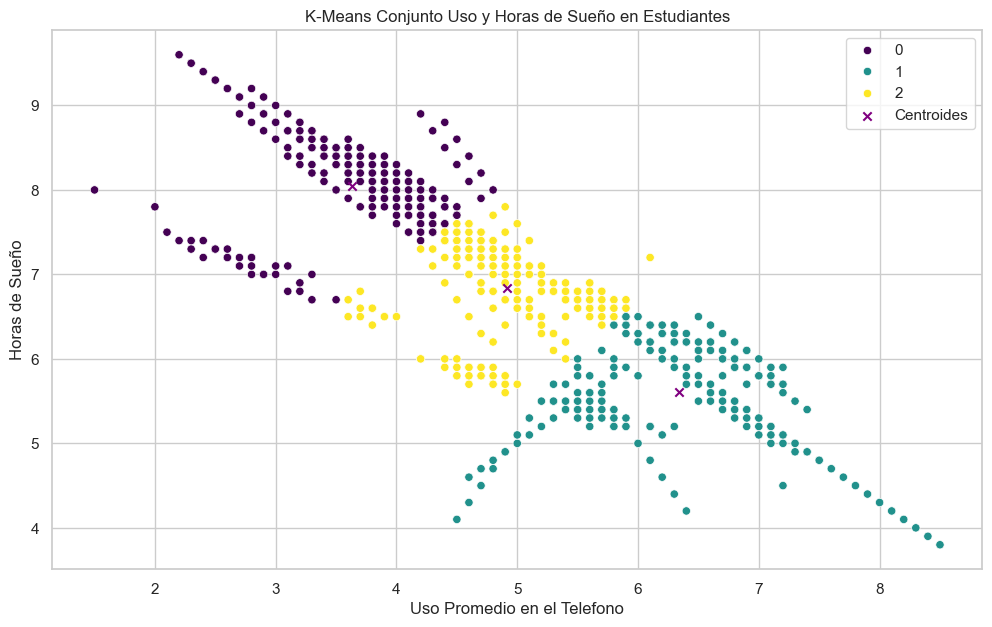

In [382]:
plt.figure(figsize=(12,7));
sns.scatterplot(data=df,x="Avg_Daily_Usage_Hours",y="Sleep_Hours_Per_Night",hue=etiquetas_uso_sueño,palette='viridis')
plt.scatter(centroides_uso_sueño[:,0],centroides_uso_sueño[:,1],c='purple',marker='x',label='Centroides')
plt.title('K-Means Conjunto Uso y Horas de Sueño en Estudiantes')
plt.legend()
plt.xlabel("Uso Promedio en el Telefono")
plt.ylabel("Horas de Sueño");

**Objetivo**:Identificar perfiles de vulnerabilidad psicológica mediante la segmentación de estudiantes, analizando la relación entre sus niveles de salud mental y su predisposición a conductas adictivas, con el fin de priorizar intervenciones de apoyo preventivo

In [383]:
X = df[["Mental_Health_Score","Addicted_Score"]]

In [384]:
kmeans_salud_adiccion = KMeans(n_clusters=3,random_state=42)

In [385]:
kmeans_salud_adiccion.fit(X)

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=3, random_state=42)

In [386]:
centroides_salud_adiccion = kmeans_salud_adiccion.cluster_centers_

In [387]:
centroides_salud_adiccion

array([[7.98165138, 3.91743119],
       [4.97787611, 8.12389381],
       [6.47297297, 6.14864865]])

In [388]:
etiquetas_salud_adiccion = kmeans_salud_adiccion.labels_

In [389]:
etiquetas_salud_adiccion

array([1, 0, 1, 0, 2, 1, 0, 1, 2, 0, 1, 1, 0, 1, 2, 2, 0, 1, 2, 2, 1, 0,
       2, 1, 2, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 1, 2, 1, 2, 2, 0, 1, 2, 2,
       1, 0, 2, 1, 2, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 1, 2, 1, 2, 1, 0, 2,
       2, 1, 0, 2, 1, 2, 2, 1, 0, 2, 1, 2, 2, 1, 0, 2, 2, 0, 1, 2, 1, 0,
       2, 1, 2, 2, 2, 1, 0, 2, 1, 0, 2, 1, 1, 0, 2, 1, 2, 2, 2, 1, 0, 2,
       1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1,
       2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2, 2, 1, 2, 0, 1, 2,
       2, 1, 2, 0, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1,
       2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2,
       1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1,
       1, 2, 0, 0, 0, 2, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1,
       2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0,
       0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1, 2,
       2, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 1,

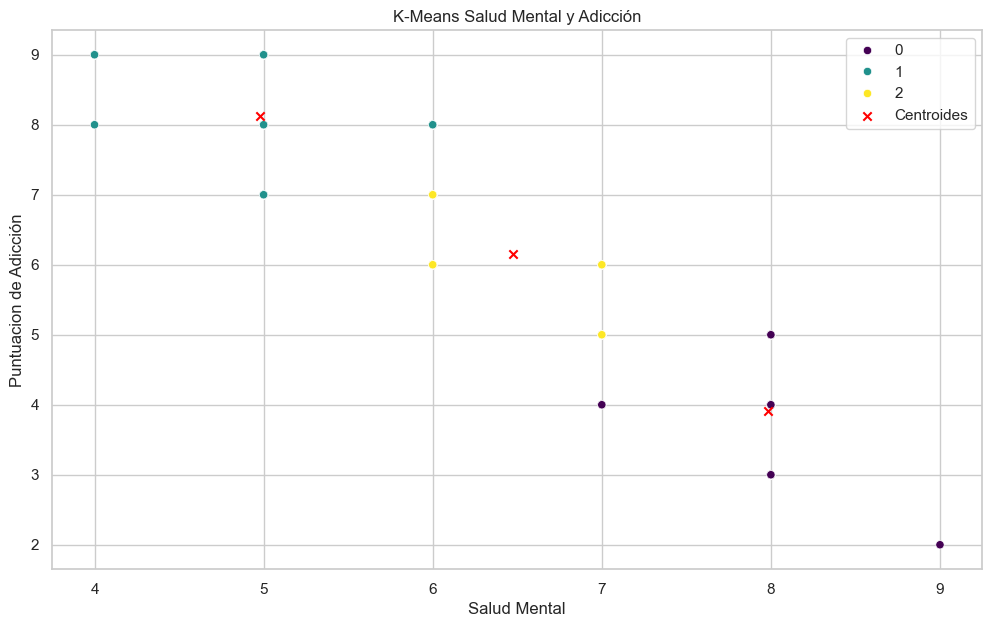

In [390]:
plt.figure(figsize=(12,7))
sns.scatterplot(data=df,x="Mental_Health_Score",y="Addicted_Score",hue=etiquetas_salud_adiccion,palette='viridis')
plt.scatter(centroides_salud_adiccion[:,0],centroides_salud_adiccion[:,1],marker='x',c='red',label='Centroides')
plt.title('K-Means Salud Mental y Adicción')
plt.xlabel("Salud Mental")
plt.ylabel("Puntuacion de Adicción")
plt.legend();

In [391]:
# 1. K-MEANS CLUSTERING (Aprendizaje No Supervisado)
# -----------------------------------------------------------------
# * OBJETIVO: Buscar grupos específicos (clusters) basados en features comunes.
# * COMPONENTES:
#   - Cluster: Conjunto o grupo de datos ordenados por similitud.
#   - Centroide: Representante del cluster. Se calcula promediando la 
#     posición de todos sus puntos en base a las features.
# * FUNCIONAMIENTO: El algoritmo es iterativo; el centroide se mueve hasta 
#   que se estabiliza (convergencia).
# * PARÁMETROS: 
#   - 'n_clusters (K)': Definido por el usuario según la necesidad del negocio.
#   - 'random_state=42': Garantiza la consistencia y reproducibilidad.
# * LÓGICA: Utiliza la medición euclidiana para asignar puntos al centroide más cercano.

#### Machine Learning Aprendizaje No Supervisado (PCA) 

In [392]:
X = df[['Age','Addicted_Score', 'Avg_Daily_Usage_Hours','Sleep_Hours_Per_Night','Mental_Health_Score','Conflicts_Over_Social_Media']]

In [393]:
X

,Age,Addicted_Score,Avg_Daily_Usage_Hours,Sleep_Hours_Per_Night,Mental_Health_Score,Conflicts_Over_Social_Media
0,19,8,5.2,6.5,6,3
1,22,3,2.1,7.5,8,0
2,20,9,6.0,5.0,5,4
3,18,4,3.0,7.0,7,1
4,21,7,4.5,6.0,6,2
...,...,...,...,...,...,...
700,20,5,4.7,7.2,7,2
701,23,9,6.8,5.9,4,5
702,21,7,5.6,6.7,6,3
703,24,4,4.3,7.5,8,2


In [394]:
y = y_codificado

In [395]:
scaler = StandardScaler()

In [396]:
X_escalado = scaler.fit_transform(X)

In [397]:
X_escalado

array([[-1.18691539,  0.98554997,  0.22385679, -0.32763788, -0.20552043,
         0.15706307],
       [ 0.95866243, -2.16695786, -2.24330915,  0.56042327,  1.60562838,
        -2.97678961],
       [-0.47172278,  1.61605153,  0.86054477, -1.65972962, -1.11109484,
         1.20168062],
       ...,
       [ 0.24346982,  0.3550484 ,  0.54220078, -0.15002565, -0.20552043,
         0.15706307],
       [ 2.38904764, -1.5364563 , -0.49241719,  0.56042327,  1.60562838,
        -0.88755449],
       [-1.18691539,  0.98554997,  1.01971676, -0.50525011, -1.11109484,
         1.20168062]], shape=(705, 6))

In [398]:
pca = PCA(n_components=2)

In [399]:
X_pca = pca.fit_transform(X_escalado)

In [400]:
X_pca

array([[ 0.97830584, -1.09402024],
       [-4.40174896,  0.57584972],
       [ 2.90775672, -0.17868328],
       ...,
       [ 0.60543771,  0.32150638],
       [-2.53834164,  2.18195831],
       [ 2.28452604, -0.97691819]], shape=(705, 2))

In [401]:
print(pca.explained_variance_ratio_)

[0.71708536 0.16156916]


In [402]:
nivel_riesgo = ['Alto Riesgo', 'Bajo Riesgo']

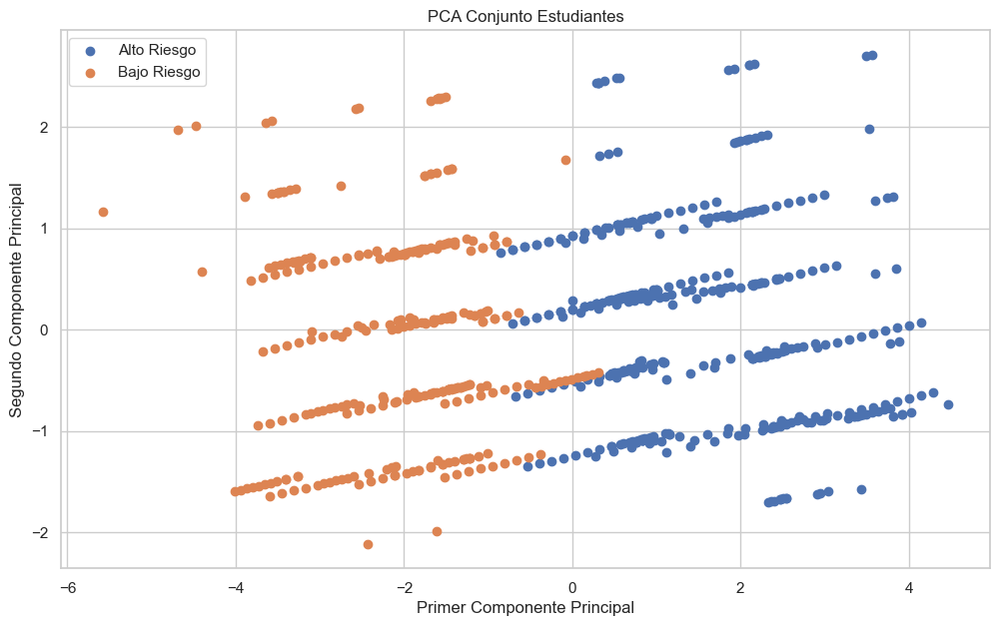

In [403]:
plt.figure(figsize=(12,7))
for i in range(0,2):
    plt.scatter(X_pca[y == i,0],X_pca[y == i,1],label=nivel_riesgo[i])
plt.xlabel("Primer Componente Principal")
plt.ylabel("Segundo Componente Principal")
plt.legend()
plt.title("PCA Conjunto Estudiantes");

In [404]:
pca.components_

array([[-1.01501872e-01,  4.68178340e-01,  4.39474671e-01,
        -4.07620012e-01, -4.55064172e-01,  4.51808534e-01],
       [ 9.91904579e-01,  3.24248467e-02,  9.42167367e-02,
        -7.22272131e-02, -3.12977320e-02,  9.07370485e-04]])

In [405]:
# 🎓 Resumen: Análisis de Riesgo de Adicción con PCA

# El objetivo fue transformar las  6 features numéricas a un gráfico 2D, utilizando el Análisis de Componentes Principales (PCA), para visualizar la separación entre los grupos de Alto Riesgo y Bajo Riesgo.


## 1. 🛠️ Preparación de Datos: La Estandarización StandardScaler

# Este paso es obligatorio para tu dataset porque las 6 features estaban en diferentes escalas, evitando que una variable domine el análisis solo por tener números más grandes.

#    Proceso: Aplicamos el StandardScaler para obtener escalado
#    Centrado: La media de cada feature se establece a 0.
#    Escalado: La desviación estándar  de cada feature se establece a 1.
#    Resultado: Cada valor en escalado es una Puntuación Z, que indica la desviación del promedio de la población en unidades estandarizadas.


## 2. 📉 Reducción Dimensional y Varianza Explicada

# Aplicamos el PCA a la matriz estandarizada escalado y la reducimos de 6D a 2D para obtener las coordenadas pca.

# Varianza Explicada:
    # CP1 (Primer Componente): 92.08% de la varianza total.
    # CP2 (Segundo Componente): 7.92\ de la varianza total.
    # Conclusión de la Reducción: El gráfico 2D retiene el 100% de la información relevante, lo que es una representación ideal de la variación en tus 6 features.



## 3. 🧭 Interpretación del Gráfico y los Loadings

# El análisis de los Loadings reveló el significado de las dos dimensiones principales en tu gráfico:

#  Componente  Eje del Gráfico  Varianza (%)  Significado Principal 

# CP1  Horizontal (X)  2.08%  Factor de Uso Problemático / Adicción (Impulsado por Addicted_Score, Avg_Daily_Usage_Hours y Conflicts). 
# CP2  Vertical (Y)  7.92%  Factor de Edad (Impulsado casi exclusivamente por Age). 

### Interpretación del Gráfico Final

#Desviación: Los estudiantes a la derecha del gráfico son los que más se desvían del promedio hacia un patrón de Alto Uso Problemático.
#Separación: Existe una tendencia a que los grupos se separen a lo largo del Eje X (CP1), lo que valida que el factor "Adicción" es el más importante.
#Superposición: Hay una alta superposición de puntos entre los grupos Alto Riesgo y Bajo Riesgo. Esto indica que, aunque la adicción es el principal impulsor de la variación, estas 6 métricas numéricas no son suficientes para clasificar perfectamente a los estudiantes.



In [406]:
X = df[['Addicted_Score','Mental_Health_Score','Sleep_Hours_Per_Night']]

In [407]:
y = y_afecta_rendimiento

In [408]:
X_centrado_features = X-np.mean(X,axis=0)

In [409]:
X_centrado_features

,Addicted_Score,Mental_Health_Score,Sleep_Hours_Per_Night
0,1.563121,-0.22695,-0.368936
1,-3.436879,1.77305,0.631064
2,2.563121,-1.22695,-1.868936
3,-2.436879,0.77305,0.131064
4,0.563121,-0.22695,-0.868936
...,...,...,...
700,-1.436879,0.77305,0.331064
701,2.563121,-2.22695,-0.968936
702,0.563121,-0.22695,-0.168936
703,-2.436879,1.77305,0.631064


In [410]:
pca_estudiantes = PCA(n_components=2,random_state=42)

In [411]:
X_pca_estudiante = pca_estudiantes.fit_transform(X_centrado_features)

In [412]:
X_pca_estudiante

array([[ 1.43551124,  0.23762616],
       [-3.71046857, -1.11841305],
       [ 3.35232978, -0.43802336],
       ...,
       [ 0.60589219,  0.10339074],
       [-2.97135063, -0.80689824],
       [ 2.02495464,  0.40277783]], shape=(705, 2))

In [413]:
clasificacion_estudiante = ['No Afecta','Si Afecta']

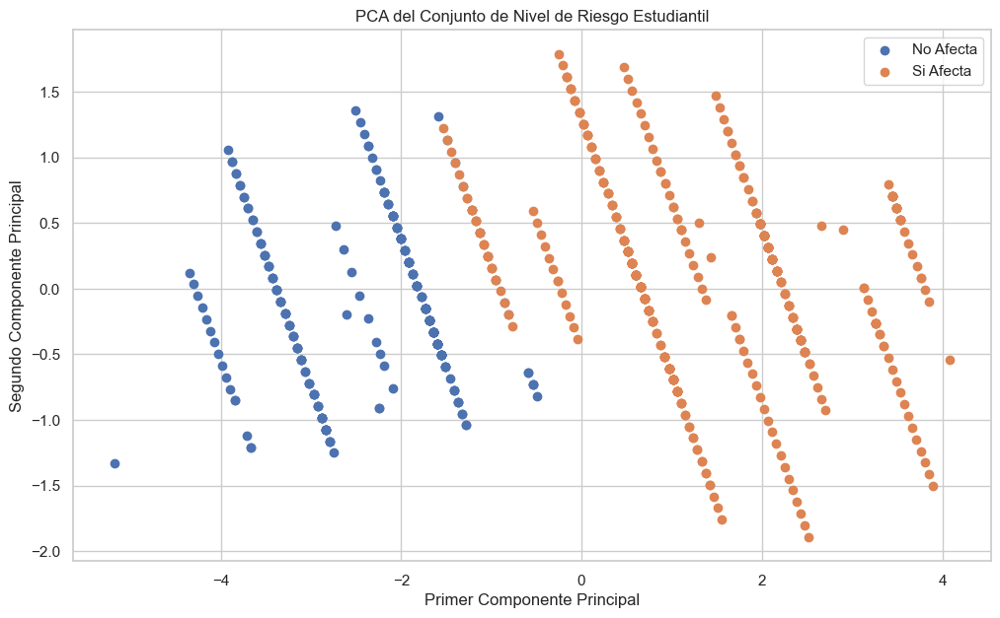

In [414]:
plt.figure(figsize=(12,7))
for i in range(0,2):
    plt.scatter(X_pca_estudiante[y == i,0],X_pca_estudiante[y == i,1], label=clasificacion_estudiante[i])
plt.xlabel('Primer Componente Principal')
plt.ylabel('Segundo Componente Principal')
plt.legend()
plt.title('PCA del Conjunto de Nivel de Riesgo Estudiantil');

In [415]:
pca_estudiantes.components_

array([[ 0.73911794, -0.4989423 , -0.45250554],
       [ 0.31151481, -0.34243105,  0.88639692]])

In [416]:
df

,Student_ID,Age,Gender,Academic_Level,Country,Avg_Daily_Usage_Hours,Most_Used_Platform,Affects_Academic_Performance,Sleep_Hours_Per_Night,Mental_Health_Score,Relationship_Status,Conflicts_Over_Social_Media,Addicted_Score,Addicted_Risk
0,1,19,Female,Undergraduate,Bangladesh,5.2,Instagram,Yes,6.5,6,In Relationship,3,8,Alto Riesgo
1,2,22,Male,Graduate,India,2.1,Twitter,No,7.5,8,Single,0,3,Bajo Riesgo
2,3,20,Female,Undergraduate,USA,6.0,TikTok,Yes,5.0,5,Complicated,4,9,Alto Riesgo
3,4,18,Male,High School,UK,3.0,YouTube,No,7.0,7,Single,1,4,Bajo Riesgo
4,5,21,Male,Graduate,Canada,4.5,Facebook,Yes,6.0,6,In Relationship,2,7,Alto Riesgo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,701,20,Female,Undergraduate,Italy,4.7,TikTok,No,7.2,7,In Relationship,2,5,Bajo Riesgo
701,702,23,Male,Graduate,Russia,6.8,Instagram,Yes,5.9,4,Single,5,9,Alto Riesgo
702,703,21,Female,Undergraduate,China,5.6,WeChat,Yes,6.7,6,In Relationship,3,7,Alto Riesgo
703,704,24,Male,Graduate,Japan,4.3,Twitter,No,7.5,8,Single,2,4,Bajo Riesgo


In [417]:
X =  df[["Avg_Daily_Usage_Hours","Sleep_Hours_Per_Night","Mental_Health_Score","Conflicts_Over_Social_Media"]]

In [418]:
y = df["Academic_Level"]

In [419]:
le = LabelEncoder()

In [420]:
target_estudiante = le.fit_transform(y)

In [421]:
target_estudiante

array([2, 0, 2, 1, 0, 2, 0, 2, 1, 0, 2, 2, 0, 1, 2, 2, 0, 1, 2, 2, 1, 0,
       2, 2, 0, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 2, 0, 1, 2, 2, 0, 1, 2, 2,
       1, 0, 2, 2, 0, 1, 2, 2, 0, 1, 2, 2, 1, 0, 2, 2, 0, 2, 2, 1, 0, 2,
       2, 1, 0, 2, 1, 0, 2, 2, 0, 2, 1, 0, 2, 1, 0, 2, 2, 0, 1, 2, 1, 0,
       2, 1, 0, 2, 2, 1, 0, 2, 1, 0, 2, 2, 1, 0, 2, 1, 0, 2, 2, 1, 0, 2,
       2, 2, 2, 0, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 2,
       0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0,
       2, 2, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2,

In [422]:
X_centrado_estudiante = X - np.mean(X,axis=0)

In [423]:
X_centrado_estudiante

,Avg_Daily_Usage_Hours,Sleep_Hours_Per_Night,Mental_Health_Score,Conflicts_Over_Social_Media
0,0.281277,-0.368936,-0.22695,0.150355
1,-2.818723,0.631064,1.77305,-2.849645
2,1.081277,-1.868936,-1.22695,1.150355
3,-1.918723,0.131064,0.77305,-1.849645
4,-0.418723,-0.868936,-0.22695,-0.849645
...,...,...,...,...
700,-0.218723,0.331064,0.77305,-0.849645
701,1.881277,-0.968936,-2.22695,2.150355
702,0.681277,-0.168936,-0.22695,0.150355
703,-0.618723,0.631064,1.77305,-0.849645


In [424]:
pca_nivel_estudiante = PCA(n_components=2)

In [425]:
X_pca_academico = pca_nivel_estudiante.fit_transform(X_centrado_estudiante)

In [426]:
nivel_academico = df['Academic_Level'].unique()

In [427]:
nivel_academico

array(['Undergraduate', 'Graduate', 'High School'], dtype=object)

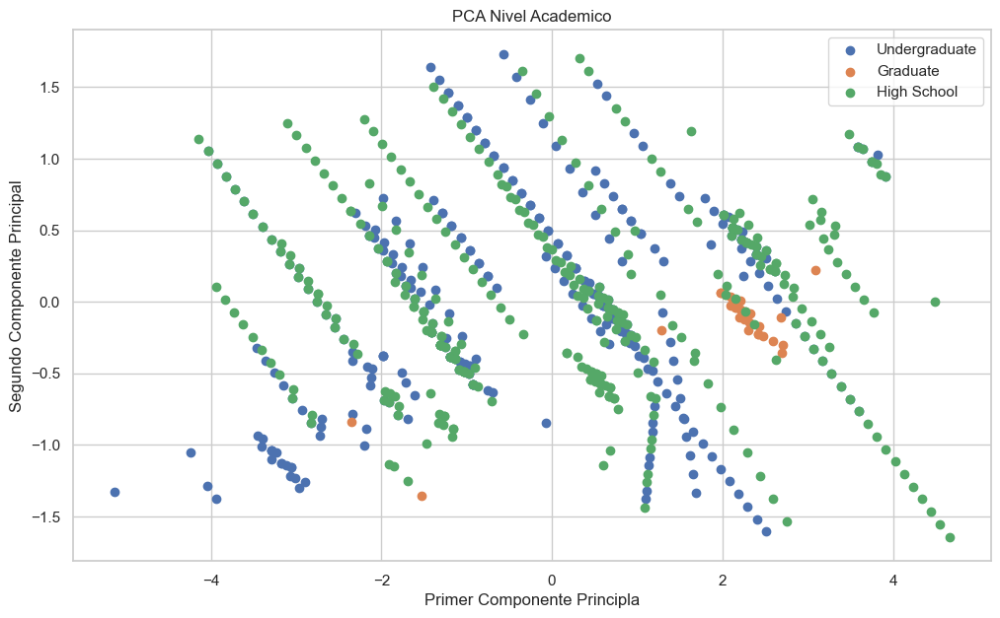

In [428]:
plt.figure(figsize=(12,7))
for i in range(0,3):
    plt.scatter(X_pca_academico[target_estudiante == i,0],X_pca_academico[target_estudiante == i,1],label=nivel_academico[i])
plt.xlabel("Primer Componente Principla")
plt.ylabel("Segundo Componente Principal")
plt.legend()
plt.title("PCA Nivel Academico");

In [429]:
# 2. PCA (ANÁLISIS DE COMPONENTES PRINCIPALES)
# -----------------------------------------------------------------
# * OBJETIVO: Reducción de dimensionalidad manteniendo la mayor varianza posible.
# * LÓGICA: Transforma variables originales (ej. 4 features de Iris) en 
#   nuevos componentes (PC1, PC2) para visualizarlos en 2D.
# * PRE-PROCESAMIENTO CRUCIAL:
#   - Estandarización/Centrado: X_centrado = X - np.mean(X). 
#   - Propósito: "Juego justo". Al restar el promedio a cada columna, todos 
#     parten desde la misma línea. 
# * UTILIDAD: Permite identificar qué datos se alejan o acercan al promedio 
#   según su categoría (especie de flor, nivel académico, etc.).

#### Machine Learning Aprendizaje No Supervisado (SVD) 

In [430]:
X = df[['Avg_Daily_Usage_Hours','Mental_Health_Score','Conflicts_Over_Social_Media']].to_numpy()

In [431]:
X

array([[5.2, 6. , 3. ],
       [2.1, 8. , 0. ],
       [6. , 5. , 4. ],
       ...,
       [5.6, 6. , 3. ],
       [4.3, 8. , 2. ],
       [6.2, 5. , 4. ]], shape=(705, 3))

In [432]:
X_centrado = X-np.mean(X,axis=0)

In [433]:
X_centrado

array([[ 0.2812766 , -0.22695035,  0.15035461],
       [-2.8187234 ,  1.77304965, -2.84964539],
       [ 1.0812766 , -1.22695035,  1.15035461],
       ...,
       [ 0.6812766 , -0.22695035,  0.15035461],
       [-0.6187234 ,  1.77304965, -0.84964539],
       [ 1.2812766 , -1.22695035,  1.15035461]], shape=(705, 3))

In [434]:
U,sigma,VT = np.linalg.svd(X_centrado)

In [435]:
U

array([[-8.05792676e-03, -2.35739006e-03,  4.09381463e-03, ...,
        -1.96522092e-02,  2.58653885e-02, -3.93012846e-02],
       [ 8.85444684e-02,  7.43184737e-03,  1.13317986e-01, ...,
         1.43640244e-02,  7.71271060e-02, -1.26487218e-02],
       [-4.10781725e-02,  1.82767403e-02, -1.01106350e-02, ...,
         1.19632759e-02, -1.94300196e-02, -1.96467885e-02],
       ...,
       [-1.34721815e-02, -2.27685619e-02,  6.19514065e-03, ...,
         9.99273673e-01, -3.38783331e-04, -3.53086599e-04],
       [ 3.82491704e-02, -5.38608053e-02, -5.25152102e-02, ...,
        -3.27792466e-04,  9.93068811e-01,  1.52997375e-03],
       [-4.37852998e-02,  8.07115441e-03, -9.05997203e-03, ...,
        -3.01119101e-04,  2.03794376e-03,  9.97896940e-01]],
      shape=(705, 705))

In [436]:
sigma

array([48.17654463, 14.82939598,  8.82682095])

In [437]:
VT

array([[-0.65210021,  0.57490457, -0.4942166 ],
       [-0.75671337, -0.53344419,  0.3779182 ],
       [ 0.04637007, -0.62042085, -0.78289704]])

In [438]:
k = 2
X_transformado = U[:, :k] * sigma[:k]

In [439]:
X_transformado

array([[-0.38820307, -0.03495867],
       [ 4.26576653,  0.11020981],
       [-1.97900441,  0.27103302],
       ...,
       [-0.64904315, -0.33764402],
       [ 1.84271286, -0.79872321],
       [-2.10942445,  0.11969034]], shape=(705, 2))

In [440]:
estado_riesgo = ['Alto Riesgo', 'Bajo Riesgo']

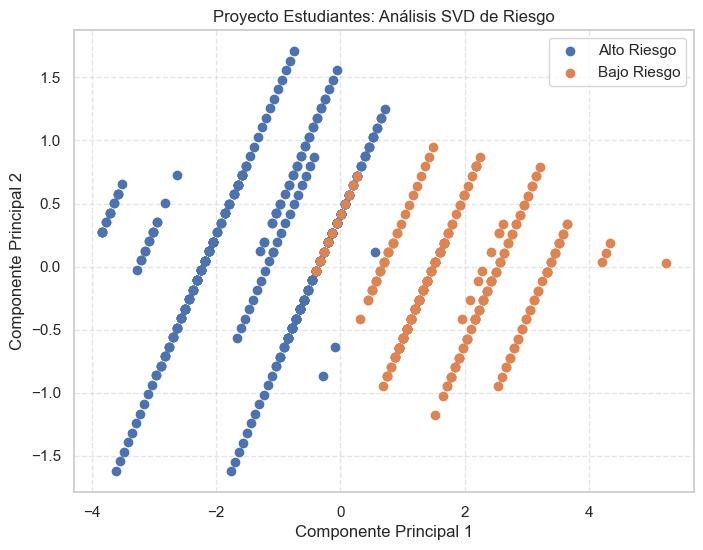

In [441]:
plt.figure(figsize=(8,6))
for i in range(2):
    plt.scatter(X_transformado[y_codificado == i, 0],X_transformado[y_codificado == i,1],label=estado_riesgo[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend()
plt.title('Proyecto Estudiantes: Análisis SVD de Riesgo')
plt.grid(True, linestyle='--', alpha=0.5);

In [442]:
# =============================================================================
# APUNTES: DESCOMPOSICIÓN DE VALORES SINGULARES (SVD) - PROYECTO ESTUDIANTES
# =============================================================================

# 1. OBJETIVO DEL SVD:
# SVD es un extractor de esencia. Toma una matriz con muchas variables (3D)
# y la "comprime" para que podamos ver los patrones en un gráfico 2D.
# Sirve para reducir la dimensionalidad sin perder la información más importante.

# 2. EL CENTRADO (X_centrado):
# Antes del SVD, restamos el promedio a cada columna. 
# Esto sirve para que cada dato represente que tan lejos está el estudiante 
# de la media. El punto (0,0) en el gráfico será el "Estudiante Promedio".

# 3. LAS TRES PIEZAS DEL ROMPECABEZAS (U, Sigma, VT):

# A. MATRIZ U (LOS PROTAGONISTAS):
# Representa a los sujetos (tus 705 estudiantes).
# Cada fila de U corresponde a un estudiante. 
# Son las coordenadas "base" o normalizadas. Nos dicen quién se parece a quién,
# pero en una escala muy pequeña.

# B. MATRIZ SIGMA (EL AMPLIFICADOR):
# Contiene los "Valores Singulares" (importancia de cada componente).
# En tu caso: [48.17, 14.82, 8.82].
# El primer valor (48.17) es el más potente y el que más separa a los grupos.
# Sigma toma los puntos de U y los "estira" para que la diferencia entre
# Alto y Bajo Riesgo sea visible y proporcional a su importancia real.

# C. MATRIZ VT (LA BRÚJULA O RECETA):
# Representa a las variables originales (Horas, Salud, Conflictos).
# Nos explica qué significan los ejes del gráfico:
# - Eje X (Componente 1): Mezcla tus 3 variables. Si un punto está a la izquierda,
#   es porque pesan más las "Horas" y "Conflictos" (signos negativos en VT).
# - Eje Y (Componente 2): Detalles secundarios de la conducta.

# 4. EL PLATO FINAL (X_transformado = U[:, :k] * sigma[:k]):
# Aquí se crea el gráfico. Seleccionamos k=2 porque queremos 2 dimensiones.
# Multiplicamos la ubicación (U) por la fuerza (Sigma).
# X_transformado contiene las coordenadas finales (X, Y) para plt.scatter.
# VT no está en la multiplicación, pero es la que nos da la lógica de por qué
# los puntos se movieron hacia esos lados.

# =============================================================================
# RESULTADO: 
# Si el punto es naranja (Bajo Riesgo) y está a la derecha, es porque el SVD 
# detectó que su "Salud Mental" es alta, superando sus horas de uso y conflictos.
# =============================================================================

In [443]:
X_target = df[['Avg_Daily_Usage_Hours','Sleep_Hours_Per_Night','Addicted_Score','Mental_Health_Score']].to_numpy()

In [444]:
y = df['Academic_Level']

In [445]:
le = LabelEncoder()

In [446]:
target_estudiantes = le.fit_transform(y)

In [447]:
y 

0      Undergraduate
1           Graduate
2      Undergraduate
3        High School
4           Graduate
           ...      
700    Undergraduate
701         Graduate
702    Undergraduate
703         Graduate
704    Undergraduate
Name: Academic_Level, Length: 705, dtype: object

In [448]:
X_centralizado = X_target - np.mean(X_target,axis=0)

In [449]:
X_centralizado

array([[ 0.2812766 , -0.36893617,  1.56312057, -0.22695035],
       [-2.8187234 ,  0.63106383, -3.43687943,  1.77304965],
       [ 1.0812766 , -1.86893617,  2.56312057, -1.22695035],
       ...,
       [ 0.6812766 , -0.16893617,  0.56312057, -0.22695035],
       [-0.6187234 ,  0.63106383, -2.43687943,  1.77304965],
       [ 1.2812766 , -0.56893617,  1.56312057, -1.22695035]],
      shape=(705, 4))

In [450]:
U, sigma, VT = np.linalg.svd(X_centralizado)

In [451]:
U

array([[-2.18818229e-02,  2.28116138e-02, -2.15829554e-02, ...,
        -1.93039366e-02,  1.99781901e-02, -3.63691067e-02],
       [ 7.23823865e-02, -4.01192683e-02, -7.90711553e-02, ...,
         1.84544216e-02,  9.27484794e-04,  2.34614590e-02],
       [-5.44650204e-02, -3.78259659e-03, -5.61991019e-02, ...,
         3.18523827e-03,  7.71775857e-02, -1.30878195e-02],
       ...,
       [-1.35083417e-02, -1.81904624e-03,  2.28015342e-02, ...,
         9.99095434e-01, -2.12386510e-04, -7.09813143e-04],
       [ 4.55353710e-02, -6.14190474e-02,  3.10365938e-02, ...,
        -3.76613624e-04,  9.93462425e-01,  1.91732281e-03],
       [-3.75805650e-02,  1.70459827e-02,  2.26639369e-02, ...,
        -6.75639551e-04,  2.16670395e-03,  9.97658957e-01]],
      shape=(705, 705))

In [452]:
sigma

array([63.55305808, 18.55145575, 14.02116948,  7.76986075])

In [453]:
VT

array([[-0.4826325 ,  0.40397449, -0.64441844,  0.43427567],
       [-0.38136247,  0.69732961,  0.44385553, -0.41386754],
       [ 0.78830763,  0.5828101 , -0.19043738,  0.05135244],
       [ 0.01412843,  0.1042517 ,  0.59283281,  0.79842421]])

In [454]:
k = 2
X_transformado_estudiante = U[:, :k] * sigma[:k]

In [455]:
X_transformado_estudiante

array([[-1.39065676,  0.42318864],
       [ 4.60012202, -0.74427083],
       [-3.4614186 , -0.07017267],
       ...,
       [-0.85849642, -0.03374596],
       [ 2.89391208, -1.13941274],
       [-2.38835983,  0.31622779]], shape=(705, 2))

In [456]:
niveles_academicos = le.classes_

In [457]:
niveles_academicos

array(['Graduate', 'High School', 'Undergraduate'], dtype=object)

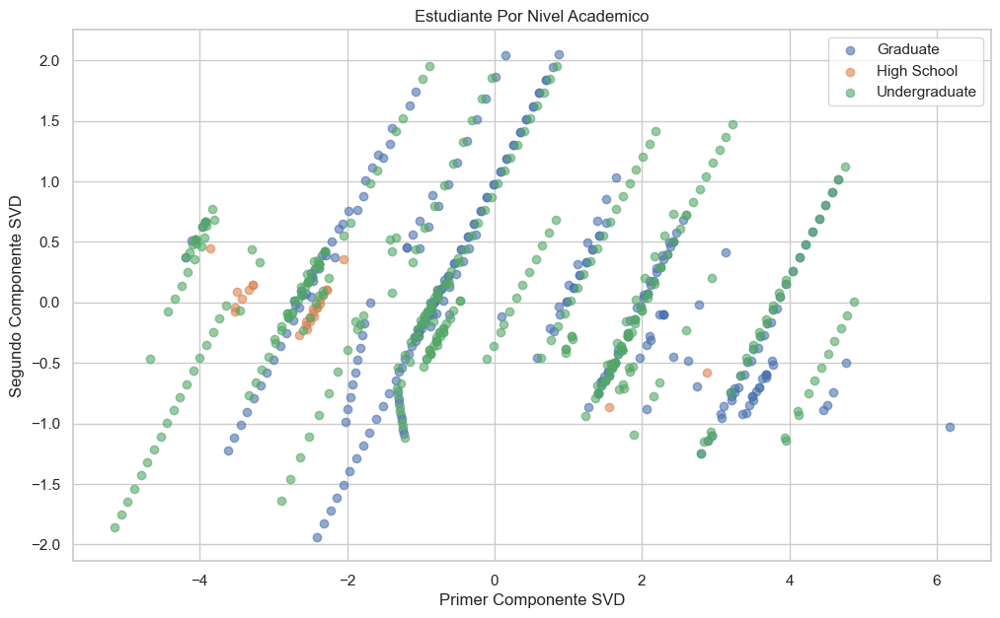

In [458]:
plt.figure(figsize=(12,7))
for i in range(3):
    plt.scatter(X_transformado_estudiante[target_estudiantes == i,0],
                X_transformado_estudiante[target_estudiantes == i,1],label=niveles_academicos[i],alpha=0.6)
                
plt.xlabel('Primer Componente SVD')
plt.ylabel('Segundo Componente SVD')
plt.title('Estudiante Por Nivel Academico')
plt.legend();

In [459]:
nombres_features = ['Avg_Daily_Usage', 'Sleep_Hours_Per_Night', 'Addicted_Score', 'Mental_Health_Score']
df_importancia_estudiante = pd.DataFrame(VT[:2, :], columns=nombres_features, index=['PC1 (Eje X)', 'PC2 (Eje Y)'])

print("Importancia de cada variable en los ejes:")
print(df_importancia_estudiante.T) 

Importancia de cada variable en los ejes:
                       PC1 (Eje X)  PC2 (Eje Y)
Avg_Daily_Usage          -0.482632    -0.381362
Sleep_Hours_Per_Night     0.403974     0.697330
Addicted_Score           -0.644418     0.443856
Mental_Health_Score       0.434276    -0.413868


In [460]:
# --- APUNTE DE INTERPRETACIÓN SVD PARA DATA SCIENCE ---

# 1. SIGMA: EL VECTOR DE IMPORTANCIA (FUERZA)
# Sigma nos dice cuánta "información" o "variabilidad" captura cada componente.
# Tus valores: [63.55, 18.55, 14.02, 7.76]
# ---------------------------------------------------------------------------
# - 63.55 (Comp 1): Es la relación más fuerte de todo el dataset.
# - 18.55 (Comp 2): Es importante, pero 3.4 veces menos potente que la primera.
# - 7.76  (Comp 4): Es casi ruido. Podríamos ignorarlo sin perder mucho.
# REGLA: Si Sigma es grande, ese componente es un "protagonista" de tu gráfico.


# 2. VT: LA MATRIZ DE RELACIONES (LA RECETA)
# VT conecta las Features originales con los componentes de Sigma (Fila por Fila).
# Tus variables: [Uso_Diario, Horas_Sueño, Adicción, Salud_Mental]
# ---------------------------------------------------------------------------

# FILA 0 (Relacionada con Sigma 63.55 -> Tu Eje X)
# VT[0] = [-0.48, 0.40, -0.64, 0.43]
# - ADICCIÓN (-0.64) y USO (-0.48): Tienen signo IGUAL. Se mueven juntas (Sube una, sube la otra).
# - SUEÑO (+0.40): Signo OPUESTO a los anteriores. Significa que a más adicción, menos sueño.
# CONCLUSIÓN EJE X: Es el eje del "Enganche Tecnológico".

# FILA 1 (Relacionada con Sigma 18.55 -> Tu Eje Y)
# VT[1] = [-0.38, 0.69, 0.44, -0.41]
# - SUEÑO (0.69): Es el valor absoluto más alto. Este componente mide principalmente el descanso.
# CONCLUSIÓN EJE Y: Es el eje de la "Calidad del Descanso".


# 3. REGLAS DE ORO PARA EL FUTURO:
# ---------------------------------------------------------------------------
# # Mismo signo (+,+) o (-,-): Relación LINEAL DIRECTA (Crecen juntas).
# # Signos distintos (+,-): Relación LINEAL INVERSA (Si una sube, la otra baja).
# # Valor cercano a 0: La variable no aporta nada a ese componente específico.
# # El valor absoluto más alto: Es la variable que le da el nombre al eje.

In [461]:
# --- APUNTE DE GENERACIÓN DE COORDENADAS (PROYECCIÓN) ---

# 1. EL PROCESO DE REDUCCIÓN (K=2)
# Elegimos k=2 porque los dos primeros Sigmas capturan la mayor parte de la información.
# Esto convierte nuestros datos de 4 dimensiones a solo 2 (X e Y).
# k = 2 

# 2. EL CÁLCULO DE LAS COORDENADAS
# X_transformado_estudiante = U[:, :k] * sigma[:k]
# ---------------------------------------------------------------------------
# - U[:, :k]: Toma la "posición relativa" de cada estudiante (sus 705 filas).
# - sigma[:k]: Escala esa posición por la "fuerza" de los componentes (63.55 y 18.55).
# ---------------------------------------------------------------------------

# 3. ¿QUÉ SIGNIFICA CADA COLUMNA EN EL RESULTADO?
# Una vez hecha la multiplicación, el array resultante tiene dos columnas:

# COLUMNA 0 (Eje X):
# Basada en la Fila 1 de VT (Adicción y Uso). 
# Si el valor es muy NEGATIVO, el estudiante tiene ALTA Adicción/Uso.
# Si el valor es muy POSITIVO, el estudiante tiene BAJA Adicción/Uso.

# COLUMNA 1 (Eje Y):
# Basada en la Fila 2 de VT (Sueño).
# Si el valor es POSITIVO, el estudiante tiene MÁS horas de sueño que el promedio.
# Si el valor es NEGATIVO, duerme MENOS que el promedio.

# 4. RESULTADO VISUAL:
# Cada fila de 'X_transformado_estudiante' es un punto [x, y] en tu gráfico.
# Ahora el gráfico no es solo puntos; es un mapa de comportamiento.

In [462]:
df

,Student_ID,Age,Gender,Academic_Level,Country,Avg_Daily_Usage_Hours,Most_Used_Platform,Affects_Academic_Performance,Sleep_Hours_Per_Night,Mental_Health_Score,Relationship_Status,Conflicts_Over_Social_Media,Addicted_Score,Addicted_Risk
0,1,19,Female,Undergraduate,Bangladesh,5.2,Instagram,Yes,6.5,6,In Relationship,3,8,Alto Riesgo
1,2,22,Male,Graduate,India,2.1,Twitter,No,7.5,8,Single,0,3,Bajo Riesgo
2,3,20,Female,Undergraduate,USA,6.0,TikTok,Yes,5.0,5,Complicated,4,9,Alto Riesgo
3,4,18,Male,High School,UK,3.0,YouTube,No,7.0,7,Single,1,4,Bajo Riesgo
4,5,21,Male,Graduate,Canada,4.5,Facebook,Yes,6.0,6,In Relationship,2,7,Alto Riesgo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,701,20,Female,Undergraduate,Italy,4.7,TikTok,No,7.2,7,In Relationship,2,5,Bajo Riesgo
701,702,23,Male,Graduate,Russia,6.8,Instagram,Yes,5.9,4,Single,5,9,Alto Riesgo
702,703,21,Female,Undergraduate,China,5.6,WeChat,Yes,6.7,6,In Relationship,3,7,Alto Riesgo
703,704,24,Male,Graduate,Japan,4.3,Twitter,No,7.5,8,Single,2,4,Bajo Riesgo


In [463]:
X = df[["Sleep_Hours_Per_Night","Mental_Health_Score","Conflicts_Over_Social_Media","Addicted_Score"]]

In [464]:
y = target_estudiantes

In [465]:
X_centrado_academico = X - np.mean(X,axis=0)

In [466]:
U,sigma,VT = np.linalg.svd(X_centrado_academico)

In [467]:
U

array([[-2.27157928e-02, -5.45060850e-03,  8.27074416e-03, ...,
        -8.93589295e-03,  2.92503445e-02, -1.47480703e-02],
       [ 7.46091287e-02,  7.49170639e-02, -1.09092021e-01, ...,
         4.26285934e-03, -5.66154670e-02,  4.31552648e-02],
       [-5.80012523e-02,  2.82785834e-02,  1.68322462e-02, ...,
         3.96601449e-03, -5.14867338e-02, -1.67942738e-02],
       ...,
       [-1.01431901e-02, -3.58430593e-03, -1.32094140e-03, ...,
         9.99243862e-01,  1.90419938e-03,  2.67439556e-04],
       [ 5.04935052e-02,  3.41675478e-02,  5.50137746e-02, ...,
         1.96362633e-03,  9.90828318e-01,  1.10547755e-03],
       [-3.80651106e-02, -2.38807524e-02,  4.69192631e-03, ...,
         2.60784447e-04,  8.82344710e-04,  9.97473849e-01]],
      shape=(705, 705))

In [468]:
sigma

array([60.88140945, 18.41684966,  8.85945115,  6.9932073 ])

In [469]:
VT

array([[ 0.40754785,  0.46084606, -0.39213248, -0.6839282 ],
       [-0.90452914,  0.25273078, -0.26760023, -0.21527724],
       [-0.02052682,  0.72231951,  0.68650779,  0.08087171],
       [ 0.12373531,  0.44944698, -0.55075339,  0.69235662]])

In [470]:
k = 2
X_transformado_academico = U[:,:k] * sigma[:k]

In [471]:
level_academic = df['Academic_Level'].unique()

In [472]:
level_academic

array(['Undergraduate', 'Graduate', 'High School'], dtype=object)

In [473]:
# REDUCCIÓN Y TRANSFORMACIÓN
# k = 2 # Decidimos bajar a 2D para poder graficar (Eje X y Eje Y)

# X_academico_transformado contiene ahora a los 705 estudiantes, pero resumidos en 2 columnas
# Columna 0: Representa la variabilidad máxima (Salud/Sueño vs Adicción)
# Columna 1: Representa la segunda variabilidad más importante
# X_academico_transformado = U[:, :k] * sigma[:k]

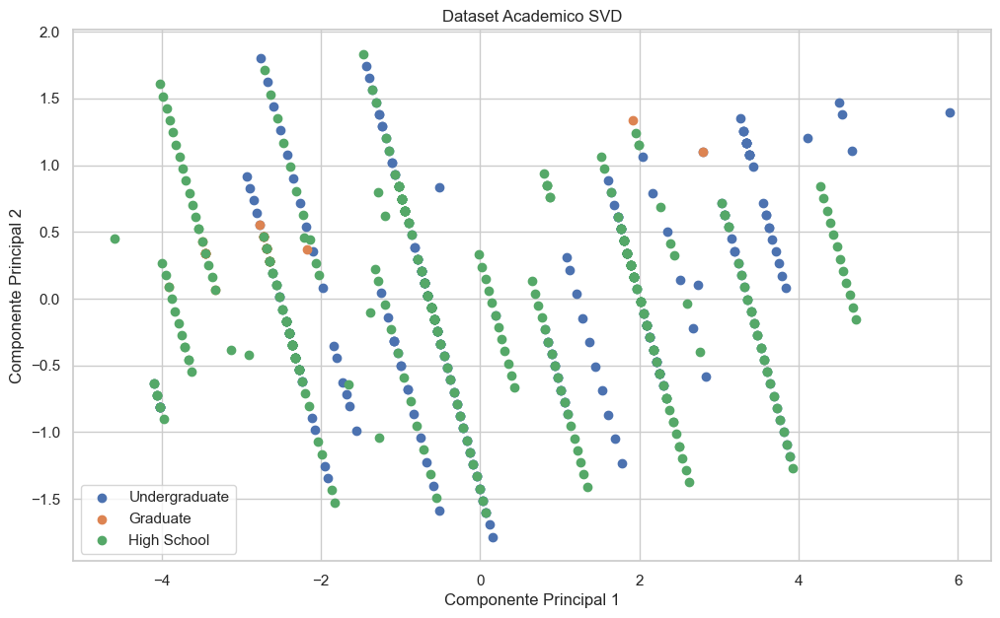

In [474]:
plt.figure(figsize=(12,7))
for i in range(3):
    plt.scatter(X_transformado_academico[y == i,0],X_transformado_academico[y == i,1],label=level_academic[i])
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend()
plt.title("Dataset Academico SVD");

In [475]:
#Interpretación según tu "Receta"
#Recordando tu matriz VT:

#Eje X (Componente 1): Hacia la derecha (positivo) van los estudiantes con más Sueño y Salud Mental; hacia la izquierda (negativo) los que tienen más Adicción y Conflictos.

#Observación: Los puntos que ves en el extremo izquierdo (cerca de -4) son estudiantes con niveles críticos de adicción y problemas de sueño.

#### Machine Learning Aprendizaje No Supervizado (Clustering Jerárquico)

In [476]:
X = df[["Avg_Daily_Usage_Hours","Sleep_Hours_Per_Night","Mental_Health_Score","Conflicts_Over_Social_Media"]]

In [477]:
linked_academico = linkage(X,'ward')

In [478]:
# =================================================================
# CLUSTERING JERÁRQUICO: DATASET ESTUDIANTES
# =================================================================
# - Linkage 'Ward': Busca minimizar la varianza dentro de los grupos de alumnos.
# - Dendrograma: Nos muestra la "distancia emocional y de hábitos" entre niveles.
# - ANALISIS: Si las ramas son muy cortas, los estudiantes son muy parecidos. 
#   Si son largas, hemos encontrado perfiles bien definidos.

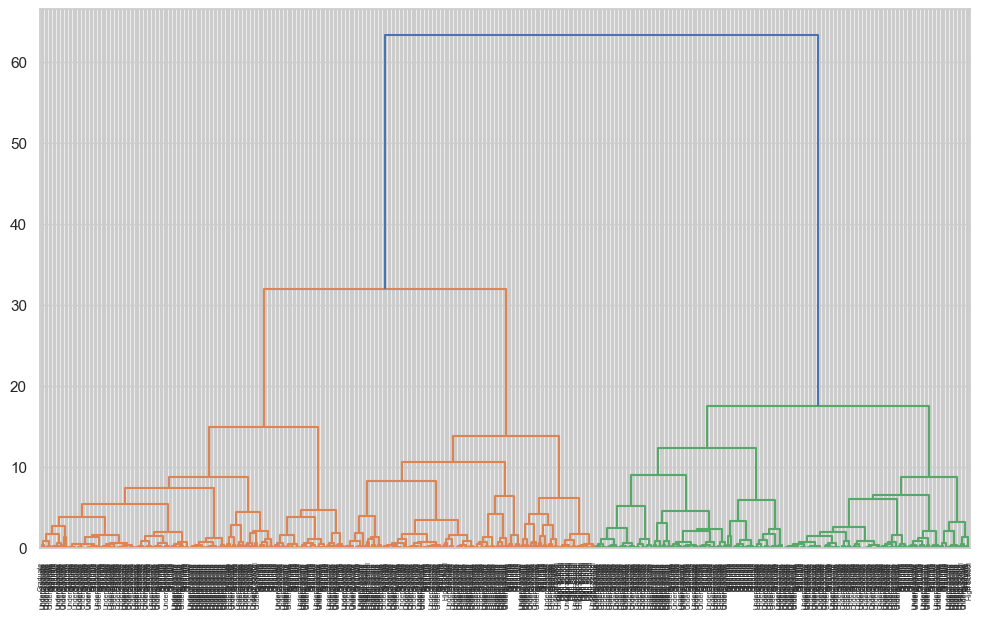

In [479]:
plt.figure(figsize=(12,7))
dendrogram(linked_academico,orientation='top',
           labels=df['Academic_Level'].values,
          distance_sort='descending',
          show_leaf_counts=True);

#### Mini Proyecto (Aprendizaje No Supervizado)

**Objetivo**: Realizar una Segmentación de Estudiantes basada en su comportamiento digital y salud mental. Buscamos encontrar patrones ocultos (Clusters) que no son evidentes a simple vista, para poder diseñar estrategias de bienestar personalizadas

In [480]:
# 1. Preprocesamiento de Datos

In [481]:
# Ver información del dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 705 entries, 0 to 704
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Student_ID                    705 non-null    int64  
 1   Age                           705 non-null    int64  
 2   Gender                        705 non-null    object 
 3   Academic_Level                705 non-null    object 
 4   Country                       705 non-null    object 
 5   Avg_Daily_Usage_Hours         705 non-null    float64
 6   Most_Used_Platform            705 non-null    object 
 7   Affects_Academic_Performance  705 non-null    object 
 8   Sleep_Hours_Per_Night         705 non-null    float64
 9   Mental_Health_Score           705 non-null    int64  
 10  Relationship_Status           705 non-null    object 
 11  Conflicts_Over_Social_Media   705 non-null    int64  
 12  Addicted_Score                705 non-null    int64  
 13  Addic

In [482]:
# Ver informacion estadistica basica del dataset
df.describe()

,Student_ID,Age,Avg_Daily_Usage_Hours,Sleep_Hours_Per_Night,Mental_Health_Score,Conflicts_Over_Social_Media,Addicted_Score
count,705.000000,705.000000,705.000000,705.000000,705.000000,705.000000,705.000000
mean,353.000000,20.659574,4.918723,6.868936,6.226950,2.849645,6.436879
std,203.660256,1.399217,1.257395,1.126848,1.105055,0.957968,1.587165
min,1.000000,18.000000,1.500000,3.800000,4.000000,0.000000,2.000000
25%,177.000000,19.000000,4.100000,6.000000,5.000000,2.000000,5.000000
50%,353.000000,21.000000,4.800000,6.900000,6.000000,3.000000,7.000000
75%,529.000000,22.000000,5.800000,7.700000,7.000000,4.000000,8.000000
max,705.000000,24.000000,8.500000,9.600000,9.000000,5.000000,9.000000


In [483]:
# Visualizar si existen datos nulos (null)
df.isnull().sum()

Student_ID                      0
Age                             0
Gender                          0
Academic_Level                  0
Country                         0
Avg_Daily_Usage_Hours           0
Most_Used_Platform              0
Affects_Academic_Performance    0
Sleep_Hours_Per_Night           0
Mental_Health_Score             0
Relationship_Status             0
Conflicts_Over_Social_Media     0
Addicted_Score                  0
Addicted_Risk                   0
dtype: int64

In [484]:
# 2. Reduccion de Dimenciones PCA y SVD

In [485]:
# 1. Definir variables (sin escalador, directo del DF)
# No se aplica MinMaxScaler ya que no hay minimos y maximos dispersos ya que el rango estos van entre 0-10
X = df[["Avg_Daily_Usage_Hours", "Sleep_Hours_Per_Night", 
             "Mental_Health_Score", "Conflicts_Over_Social_Media", "Addicted_Score"]]

In [486]:
# Centralizar datos
X_centralizado_estudiantes = X -np.mean(X,axis=0)

In [487]:
# Aplicar PCA
pca_instancia_estudiantes = PCA(n_components=2)
pca_estudiantes_general = pca_instancia_estudiantes.fit_transform(X_centralizado_estudiantes)

In [488]:
pca_estudiantes_general

array([[ 1.3594696 ,  0.28358684],
       [-5.31409174, -1.03758699],
       [ 3.6440681 , -0.14949406],
       ...,
       [ 0.85709093, -0.08041755],
       [-3.01710524, -0.97557486],
       [ 2.64257145,  0.36207296]], shape=(705, 2))

In [489]:
# Aplicar SVD
U,sigma,VT = np.linalg.svd(X_centralizado_estudiantes)

In [490]:
# Seleccionar los dos primeros componentes singulares para reducción de dimensiones
k = 2
svd_resultado = U[:,:k] * sigma[:k]

In [491]:
# 3. K-Means y Clustering Jerarquico

In [492]:
kmeans_estudiantes = KMeans(n_clusters=3, random_state=42)
kmeans_clusters = kmeans_estudiantes.fit_predict(X)

C:\Users\Matias\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [493]:
kmeans_estudiantes.cluster_centers_

array([[3.20884956, 8.14867257, 7.90265487, 1.54867257, 3.95575221],
       [5.87909605, 5.97372881, 5.37288136, 3.57062147, 7.71751412],
       [4.30210084, 7.59285714, 6.70168067, 2.39495798, 5.71008403]])

In [494]:
kmeans_estudiantes.labels_

array([1, 0, 1, 0, 2, 1, 0, 1, 2, 0, 1, 1, 0, 1, 2, 1, 0, 1, 2, 1, 1, 0,
       1, 1, 2, 1, 2, 1, 0, 1, 2, 1, 1, 0, 1, 1, 0, 1, 2, 1, 0, 1, 2, 1,
       1, 0, 1, 1, 2, 1, 2, 1, 0, 1, 2, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       2, 1, 0, 1, 1, 2, 1, 1, 0, 1, 1, 2, 1, 1, 0, 1, 2, 0, 1, 1, 1, 0,
       1, 1, 2, 1, 2, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 2, 1, 2, 1, 0, 1,
       1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1,
       1, 2, 1, 1, 2, 1, 1, 0, 1, 1, 2, 1, 1, 0, 1, 1, 2, 1, 1, 0, 1, 1,
       2, 1, 1, 0, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1,
       2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 2, 2, 1, 2, 2,
       1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1,
       1, 1, 2, 0, 0, 1, 2, 2, 1, 1, 2, 0, 0, 1, 2, 2, 1, 1, 2, 0, 0, 1,
       2, 2, 1, 1, 2, 0, 0, 1, 2, 2, 1, 1, 2, 0, 0, 1, 2, 2, 1, 1, 2, 0,
       0, 1, 2, 2, 1, 1, 2, 0, 0, 1, 2, 2, 1, 1, 2, 0, 0, 1, 2, 2, 1, 1,
       2, 0, 0, 1, 2, 2, 1, 1, 2, 0, 0, 1, 2, 2, 1,

In [495]:
# Aplicar Clustering Jerarquico
linked_estudiantes = linkage(X,'ward')

In [496]:
# 4. Visualizacion de los Datos

In [497]:
# Crear grafico de dispersion para los resultados de PCA

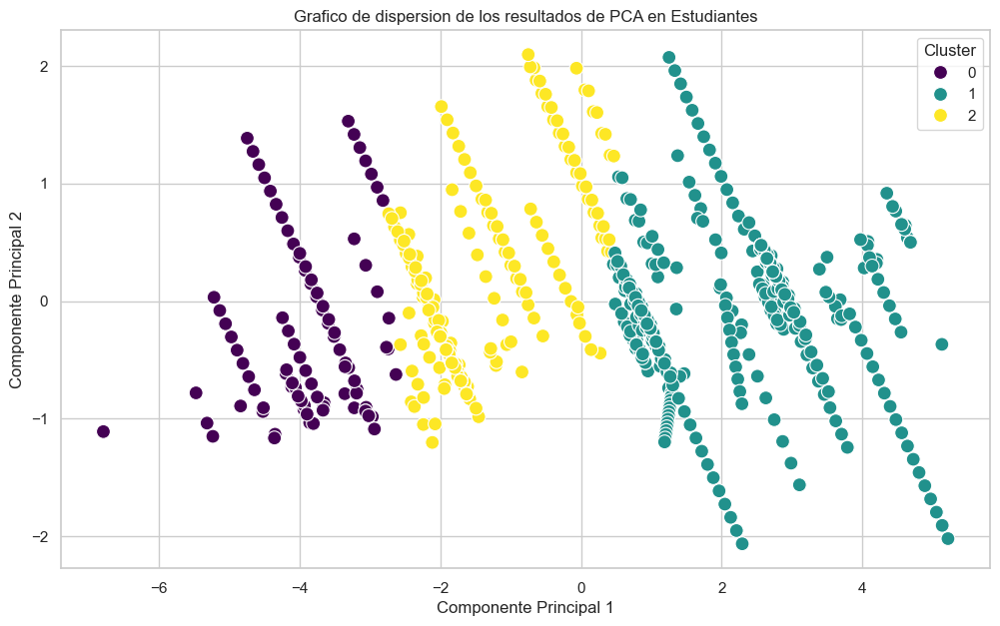

In [498]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=pca_estudiantes_general[:,0],y=pca_estudiantes_general[:,1],hue=kmeans_clusters,palette='viridis',s=100)
plt.title('Grafico de dispersion de los resultados de PCA en Estudiantes')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Cluster');

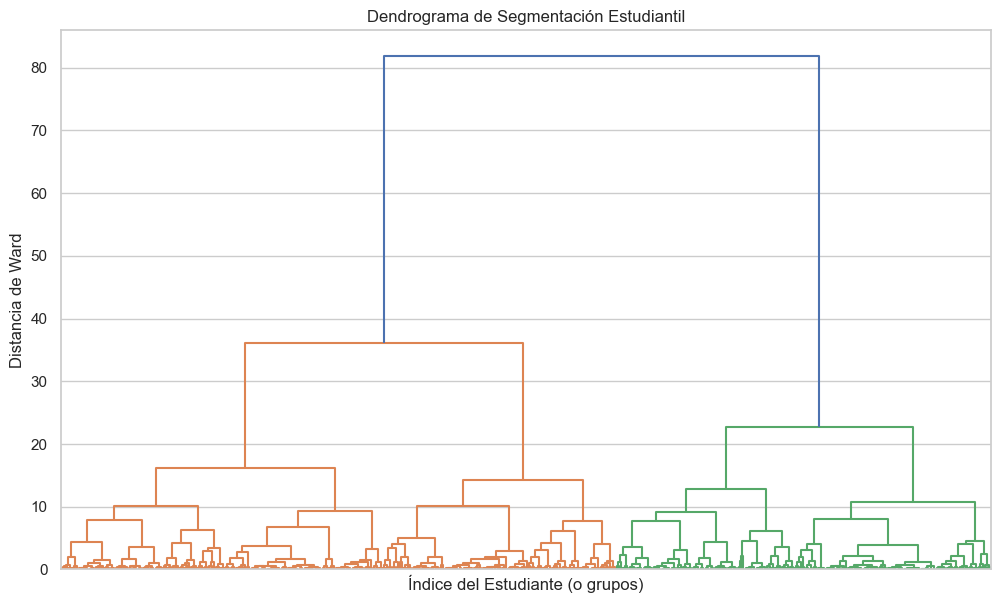

In [499]:
# Dendograma de Clustering Jerarquico
plt.figure(figsize=(12, 7))
dendrogram(linked_estudiantes, 
           orientation='top', 
           distance_sort='descending', 
           show_leaf_counts=True,
           no_labels=True) 
plt.title('Dendrograma de Segmentación Estudiantil')
plt.xlabel('Índice del Estudiante (o grupos)')
plt.ylabel('Distancia de Ward');

In [500]:
# 5 Estrategias de Estudiantes basdas en los Clusters

In [501]:
clusters_estudiantes = pd.DataFrame({
    'Cluster': kmeans_clusters,
    'Edad':df['Age'],
    'Horas de Uso':df['Avg_Daily_Usage_Hours'],
    'Horas de Sueño':df['Sleep_Hours_Per_Night'],
    'Salud Mental': df['Mental_Health_Score'],
    'Puntacion de Adiccion a las Redes':df['Addicted_Score'],
    'Conflicto con las Redes Sociales':df['Conflicts_Over_Social_Media']
})

In [502]:
clusters_estudiantes['Cluster']

0      1
1      0
2      1
3      0
4      2
      ..
700    2
701    1
702    1
703    0
704    1
Name: Cluster, Length: 705, dtype: int32

In [503]:
for cluster in clusters_estudiantes["Cluster"].unique():
    cluster_data = clusters_estudiantes[clusters_estudiantes["Cluster"] == cluster]
    print(f'=== Perfil del Grupo {cluster}===')
    print(f'- Edad Promedio: {cluster_data["Edad"].mean():.2f}')
    print(f'- Horas de Uso Diarias: {cluster_data["Horas de Uso"].mean():.2f}')
    print(f'- Horas de Sueño:{cluster_data["Horas de Sueño"].mean():.2f}')
    print(f'- Salud Mental:{cluster_data["Salud Mental"].mean():.2f}')
    print(f'- Puntaje Adicción:{cluster_data["Puntacion de Adiccion a las Redes"].mean():.2f}')
    print(f'- Conflicto con las Redes Sociales:{cluster_data["Puntacion de Adiccion a las Redes"].mean():.2f}')
    print()

=== Perfil del Grupo 1===
- Edad Promedio: 20.50
- Horas de Uso Diarias: 5.88
- Horas de Sueño:5.97
- Salud Mental:5.37
- Puntaje Adicción:7.72
- Conflicto con las Redes Sociales:7.72

=== Perfil del Grupo 0===
- Edad Promedio: 20.90
- Horas de Uso Diarias: 3.21
- Horas de Sueño:8.15
- Salud Mental:7.90
- Puntaje Adicción:3.96
- Conflicto con las Redes Sociales:3.96

=== Perfil del Grupo 2===
- Edad Promedio: 20.79
- Horas de Uso Diarias: 4.30
- Horas de Sueño:7.59
- Salud Mental:6.70
- Puntaje Adicción:5.72
- Conflicto con las Redes Sociales:5.72



In [504]:
# ==============================================================================
# LÓGICA DEL LOOP DE PROFILING - PROYECTO DÍA 12
# ==============================================================================

# 1. Identificación de Grupos:
# clusters_estudiantes['Cluster'].unique() extrae los valores únicos [0, 1, 2].
# El loop 'for' asegura que el análisis se repita exactamente una vez por cada grupo.
# for cluster in clusters_estudiantes['Cluster'].unique():
    
    # 2. Creación del Mini-Dataset (Filtrado):
    # 'clusters_estudiantes['Cluster'] == cluster' genera una máscara lógica (True/False).
    # Al pasar esa máscara al DataFrame original, creamos 'cluster_data'.
    # Este es un sub-conjunto que contiene SOLO a los estudiantes del grupo actual.
    # cluster_data = clusters_estudiantes[clusters_estudiantes['Cluster'] == cluster]
    
    # 3. Extracción de Insights (Promedios):
    # Al usar .mean() sobre 'cluster_data', calculamos la "identidad" de ese grupo.
    # Esto permite comparar, por ejemplo, si el Cluster 0 duerme menos que el Cluster 1.
    #print(f'=== Perfil del Grupo {cluster} ===')
    #print(f'- Edad Promedio: {cluster_data["Edad"].mean():.2f}')
    #print(f'- Horas de Uso: {cluster_data["Horas de Uso"].mean():.2f}')
    #print(f'- Salud Mental: {cluster_data["Salud Mental"].mean():.2f}')
    #print() # Salto de línea para claridad visual

#### Plotly (Gráficos Interactivos)

In [505]:
fig = go.Figure()

In [506]:
estudiantes_trazado = go.Scatter(x=df['Addicted_Score'],
                                y=df['Mental_Health_Score'],
                                mode='markers')

In [507]:
fig.add_trace(estudiantes_trazado)

In [508]:
estudiantes_trazado = go.Scatter(x=df['Addicted_Score'],
                                y=df['Mental_Health_Score'],
                                mode='markers',
                                marker=dict(size=12,
                                           color='orange',
                                           line=dict(width=2,
                                                     color='red')))

In [509]:
fig.update_traces(estudiantes_trazado)

In [510]:
layout_estudiates = go.Layout(title="Nivel de Adicción por Salud Mental",
                             xaxis=dict(title='Nivel del Adicción'),
                             yaxis=dict(title='Puntuación Mental')) 

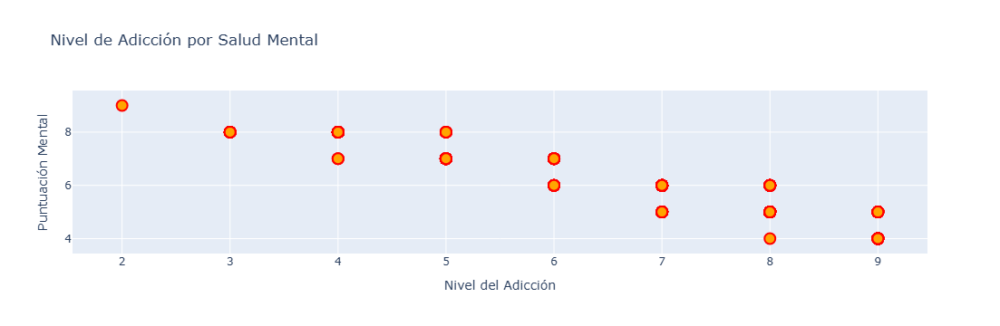

In [523]:
fig.update_layout(layout_estudiates)

In [512]:
fig2 = go.Figure()
fig2.add_trace(go.Pie(labels=df['Most_Used_Platform'],
                    values=df['Most_Used_Platform'].value_counts()))
fig2.update_layout(title='Gráfico Circular de Redes Más Usadas')

In [513]:
data = go.Histogram(x=df['Relationship_Status'])
fig3 = go.Figure(data=data)
fig3.update_layout(title="Frecuencia por tipo de Relaciones")

In [514]:
fig4 = go.Figure(data=go.Box(y=df['Avg_Daily_Usage_Hours']))

fig4.update_layout(title='Grafico de Caja')

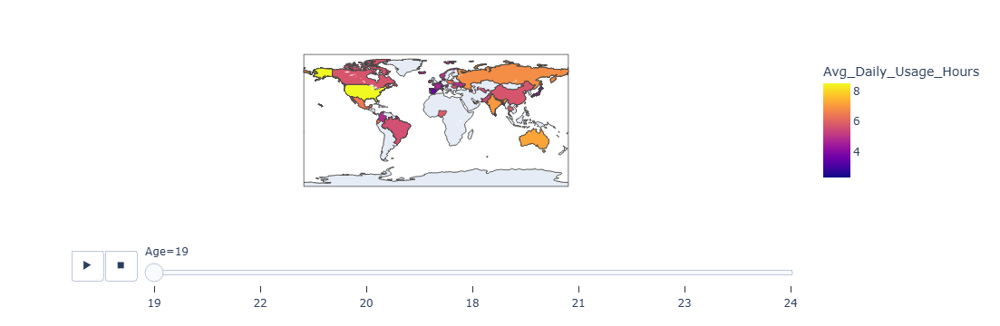

In [519]:
fig5 = px.choropleth(df,
                    locations='Country',
                    locationmode='country names',
                    color='Avg_Daily_Usage_Hours',
                    hover_name='Country',
                    color_continuous_scale=px.colors.sequential.Plasma,
                    animation_frame='Age')

fig5